# Preparing files

## Read data and check data

In [94]:
def merge_json_files(input_files):
    merged_modifiers = []

    for file_path in input_files:
        with open(file_path, "r") as f:
            data = json.load(f)
            modifiers = data.get("modifiers", [])
            print(f"✅ Loaded {len(modifiers)} modifiers from {file_path}")
            merged_modifiers.extend(modifiers)

    print(f"✅ Merged {len(input_files)} files with {len(merged_modifiers)} total modifiers.")
    return merged_modifiers

In [95]:
import json
import os
import matplotlib.pyplot as plt

def preview_first_strokes(file_path, n_samples=12):
    """
    Load a stroke JSON file, visualize the first `n_samples` modifiers,
    and print a summary of unique modifier types in that file.
    """
    try:
        with open(file_path, "r") as f:
            data = json.load(f)
        modifiers = data.get("modifiers", [])
    except Exception as e:
        print(f"❌ Failed to load {file_path}: {e}")
        return

    if not modifiers:
        print(f"⚠️ No modifiers found in {os.path.basename(file_path)}")
        return

    # --- 🧩 Get unique modifier types ---
    modifier_types = [m.get("type", "unknown") for m in modifiers if isinstance(m, dict)]
    unique_types = sorted(set(modifier_types))
    type_counts = {t: modifier_types.count(t) for t in unique_types}

    # === 📊 Summary print ===
    print(f"\n📂 {os.path.basename(file_path)} → {len(modifiers)} total strokes")
    print("🔎 Unique modifier types:")
    for t, c in type_counts.items():
        print(f"   • {t}: {c} samples")

    # === 🖼️ Plot first N samples ===
    n_show = min(n_samples, len(modifiers))
    cols = 4
    rows = (n_show + cols - 1) // cols

    plt.figure(figsize=(12, 3 * rows))
    for i, mod in enumerate(modifiers[:n_show]):
        stroke = mod.get("stroke", [])
        if not stroke:
            continue

        x = [p["x"] for p in stroke]
        y = [p["y"] for p in stroke]

        plt.subplot(rows, cols, i + 1)
        plt.plot(x, y, linewidth=2)
        plt.gca().invert_yaxis()
        plt.axis("equal")
        plt.axis("off")
        plt.title(f"#{i+1}", fontsize=9)

    plt.suptitle(os.path.basename(file_path), fontsize=12, y=1.02)
    plt.tight_layout()
    plt.show()



📂 underline.json → 50 total strokes
🔎 Unique modifier types:
   • underline: 50 samples


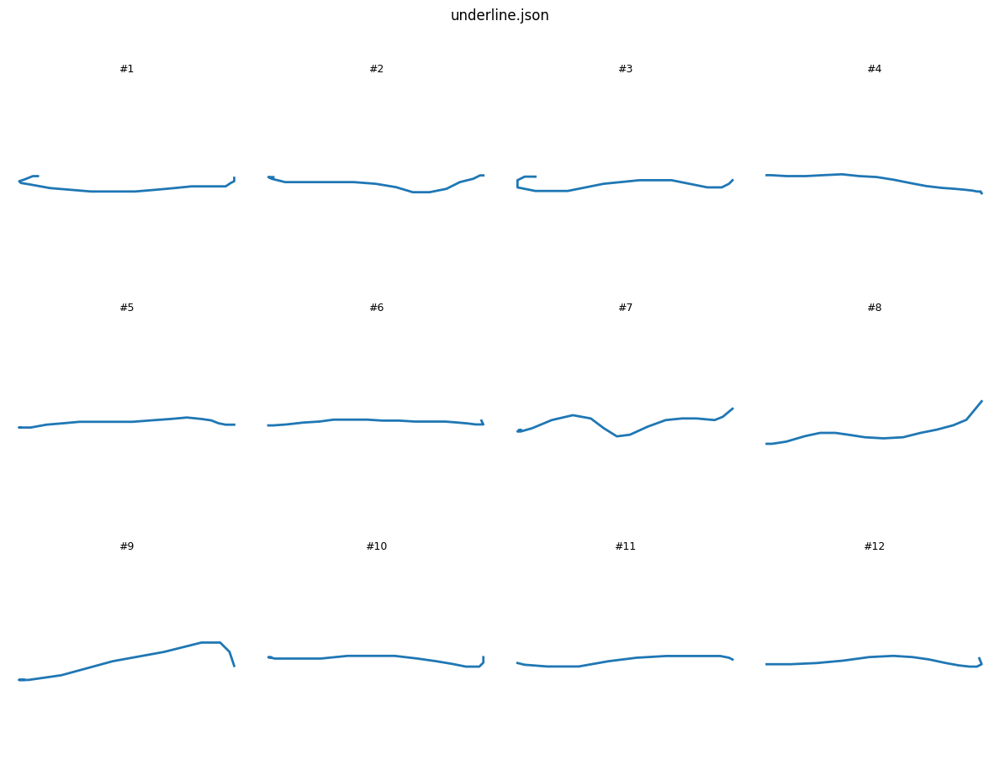


📂 nicebox_2.json → 50 total strokes
🔎 Unique modifier types:
   • box: 50 samples


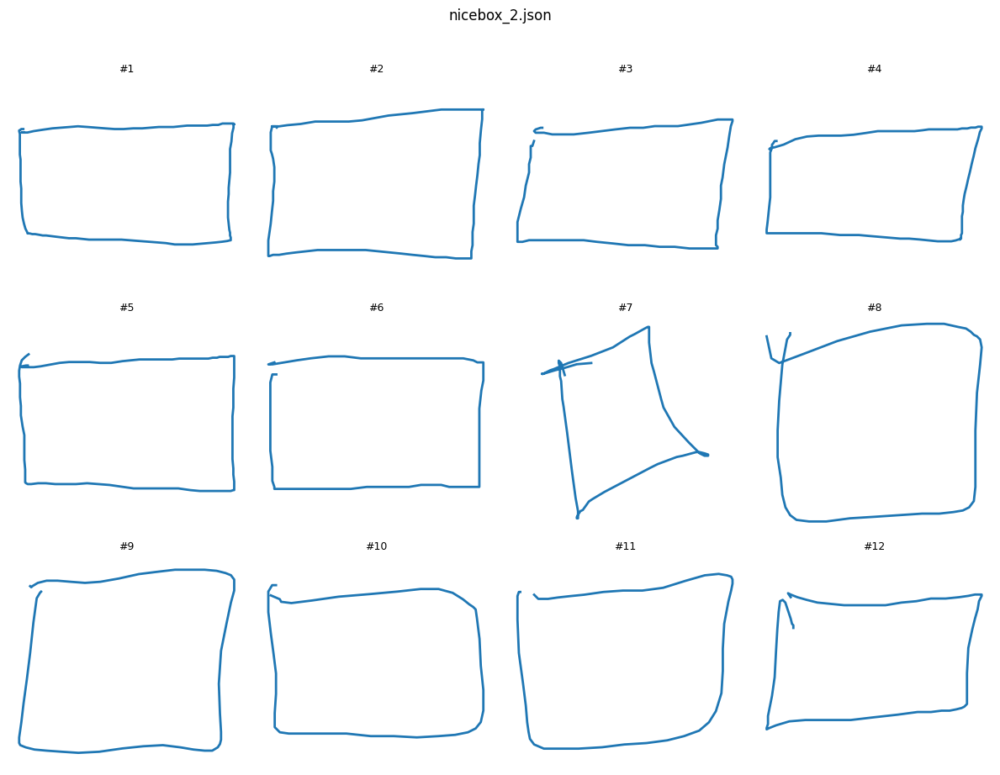


📂 curlybox.json → 50 total strokes
🔎 Unique modifier types:
   • curly: 50 samples


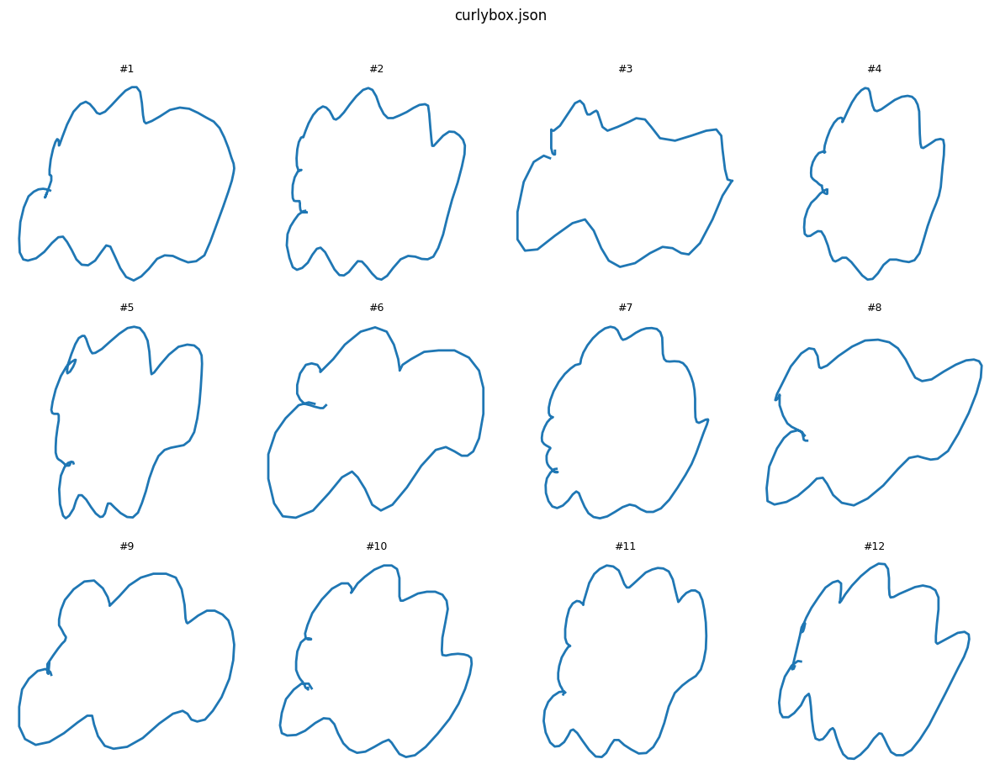


📂 boxshortcut.json → 50 total strokes
🔎 Unique modifier types:
   • boxshortcut: 50 samples


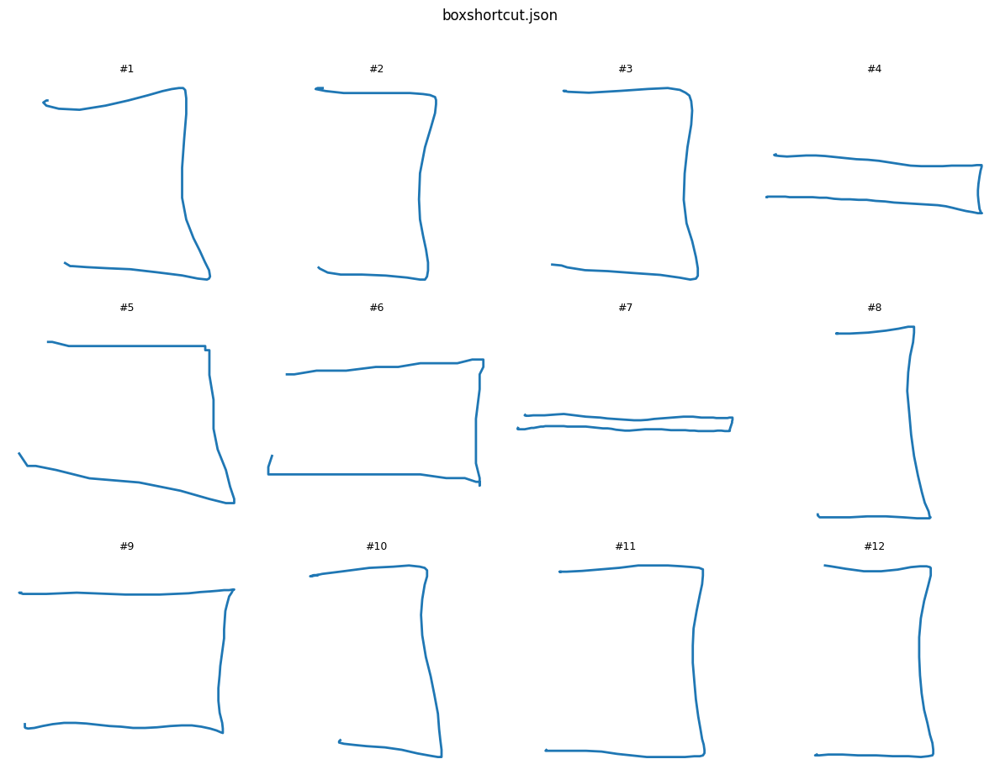


📂 curlyshortcut.json → 50 total strokes
🔎 Unique modifier types:
   • curlyshortcut: 50 samples


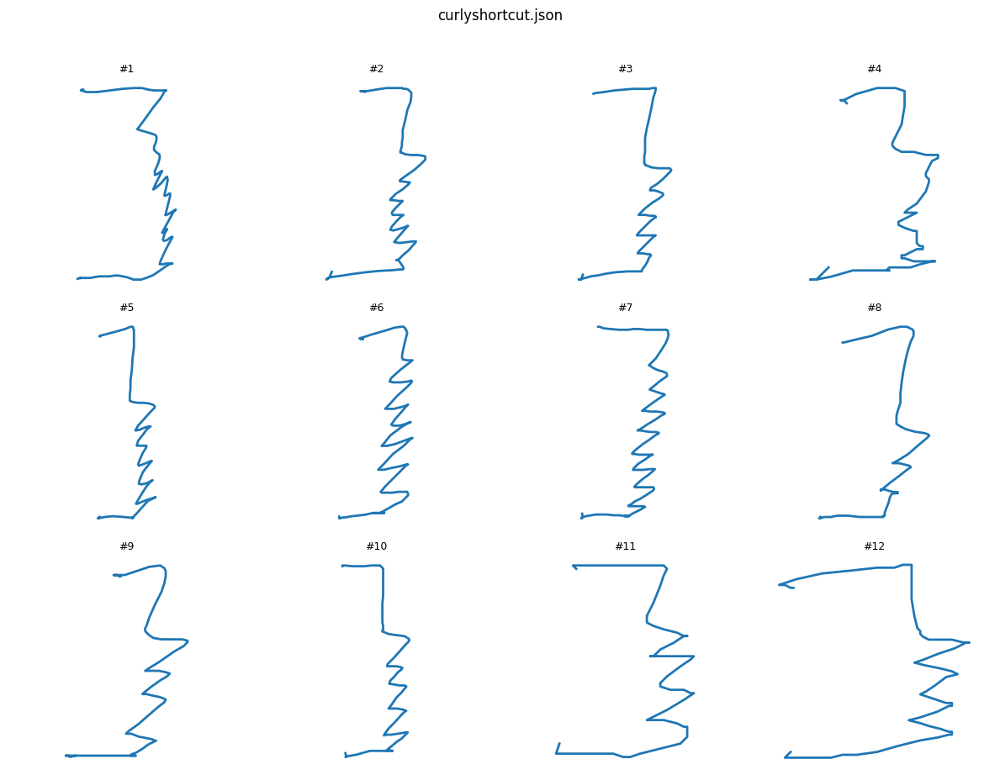


📂 circleshortcut.json → 50 total strokes
🔎 Unique modifier types:
   • circleshortcut: 50 samples


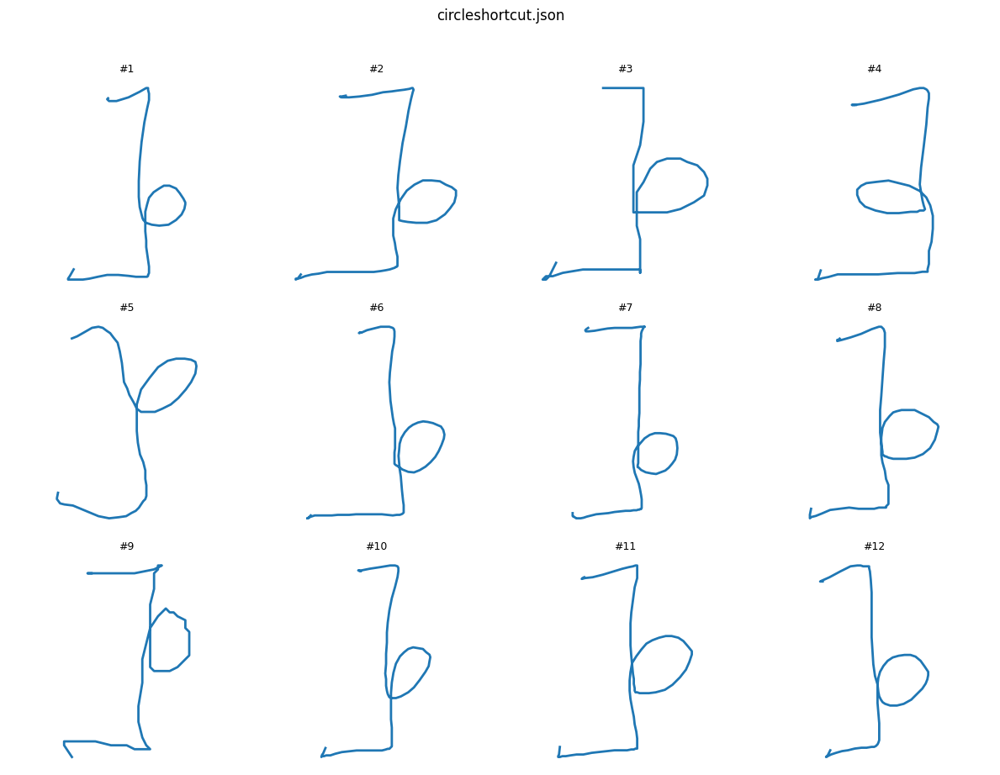


📂 delete_vertical.json → 51 total strokes
🔎 Unique modifier types:
   • delete: 51 samples


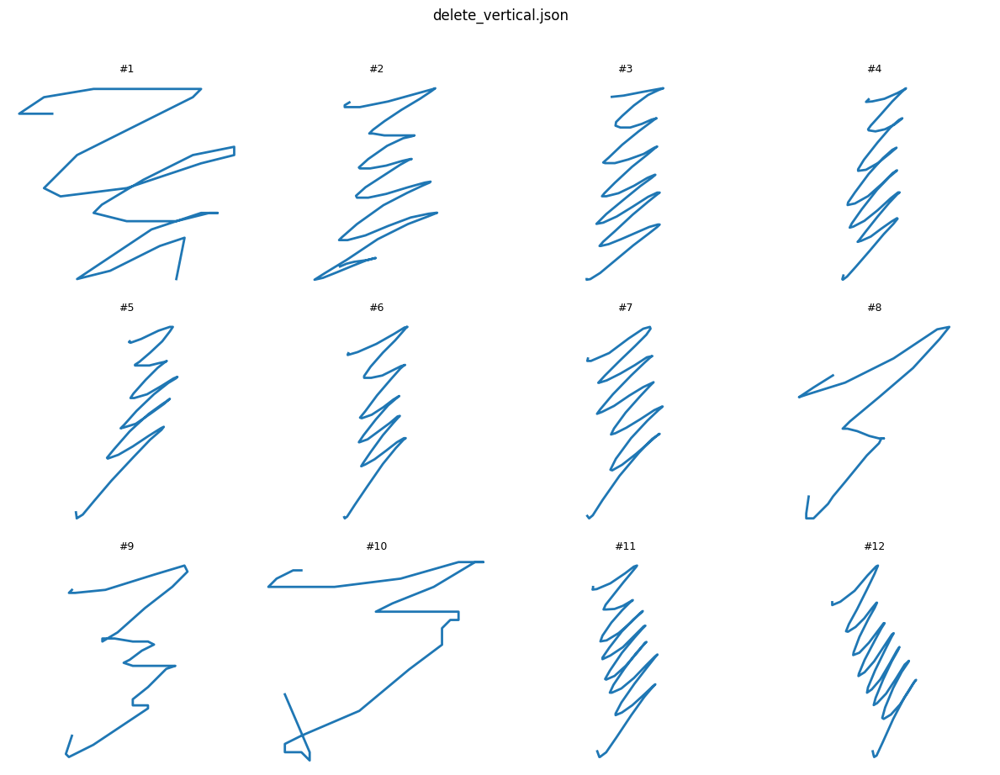


📂 hordelete.json → 50 total strokes
🔎 Unique modifier types:
   • delete: 50 samples


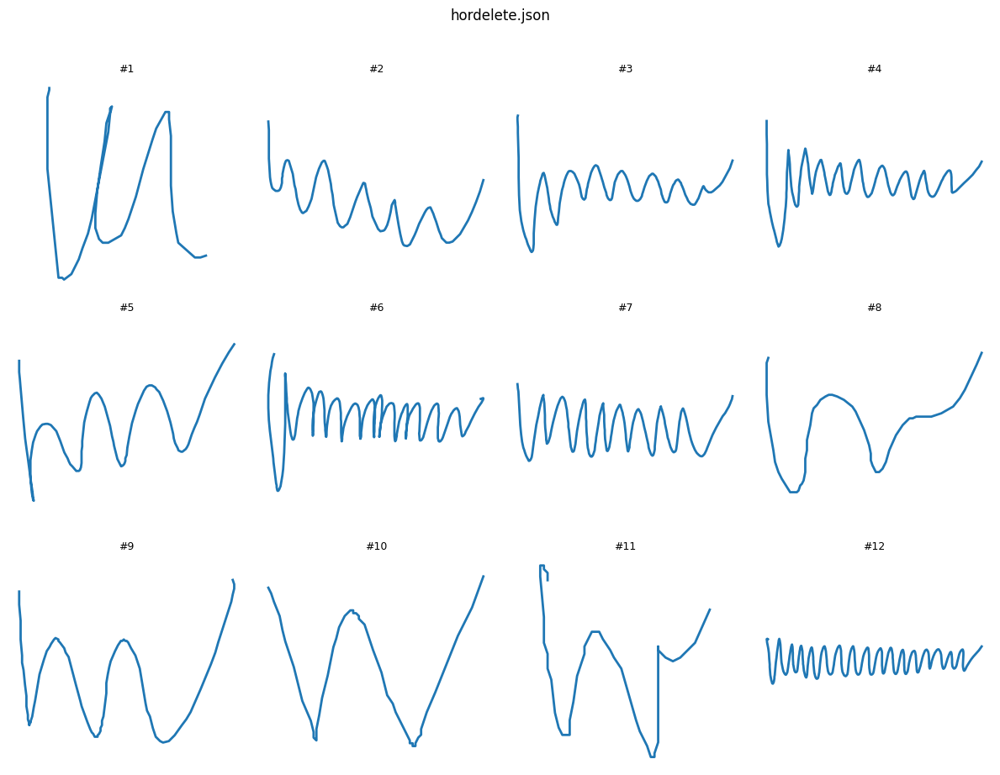


📂 nonedot.json → 50 total strokes
🔎 Unique modifier types:
   • nonedot: 50 samples


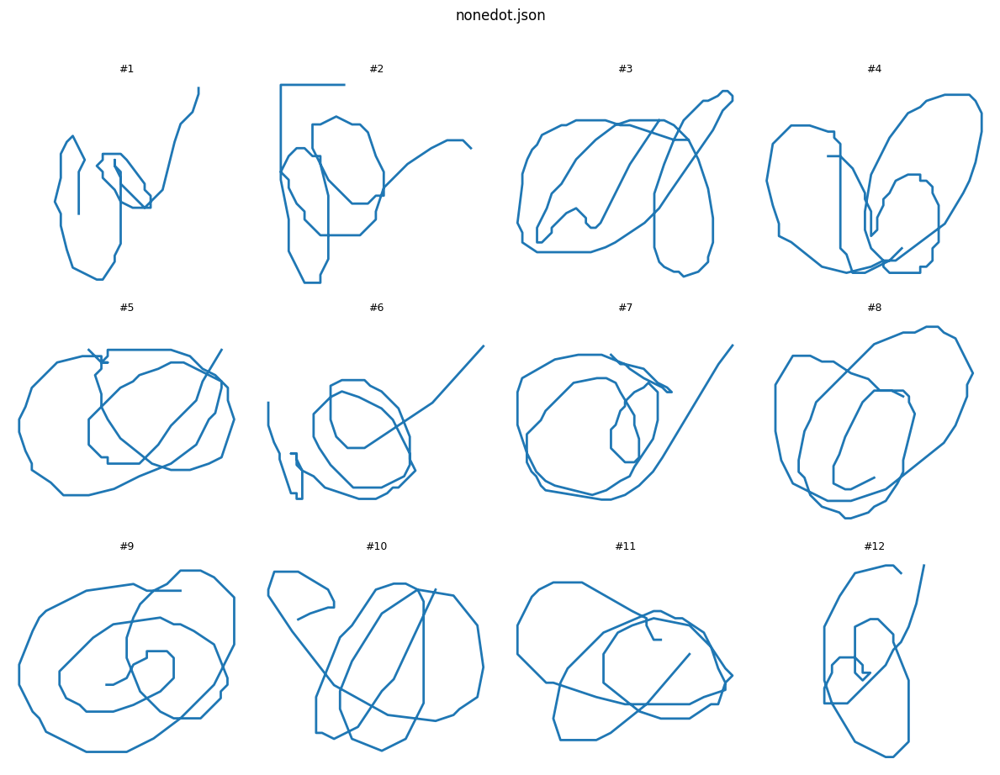


📂 nonedaulon.json → 50 total strokes
🔎 Unique modifier types:
   • nonedaulon: 50 samples


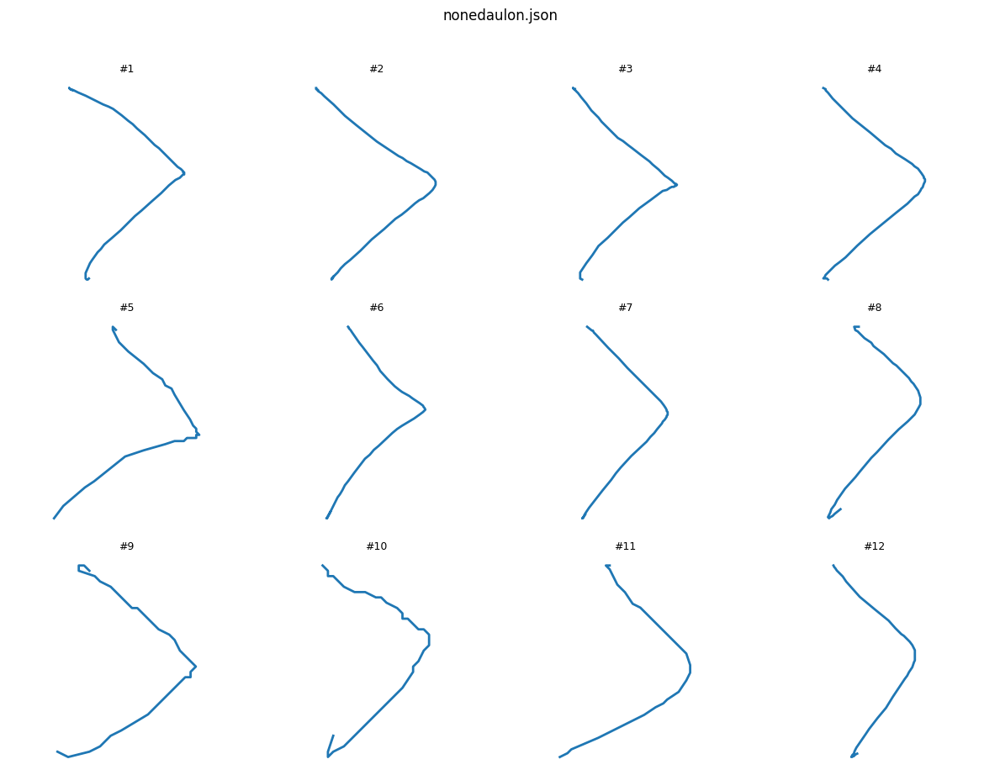


📂 nonedaungoac.json → 50 total strokes
🔎 Unique modifier types:
   • nonenhon: 50 samples


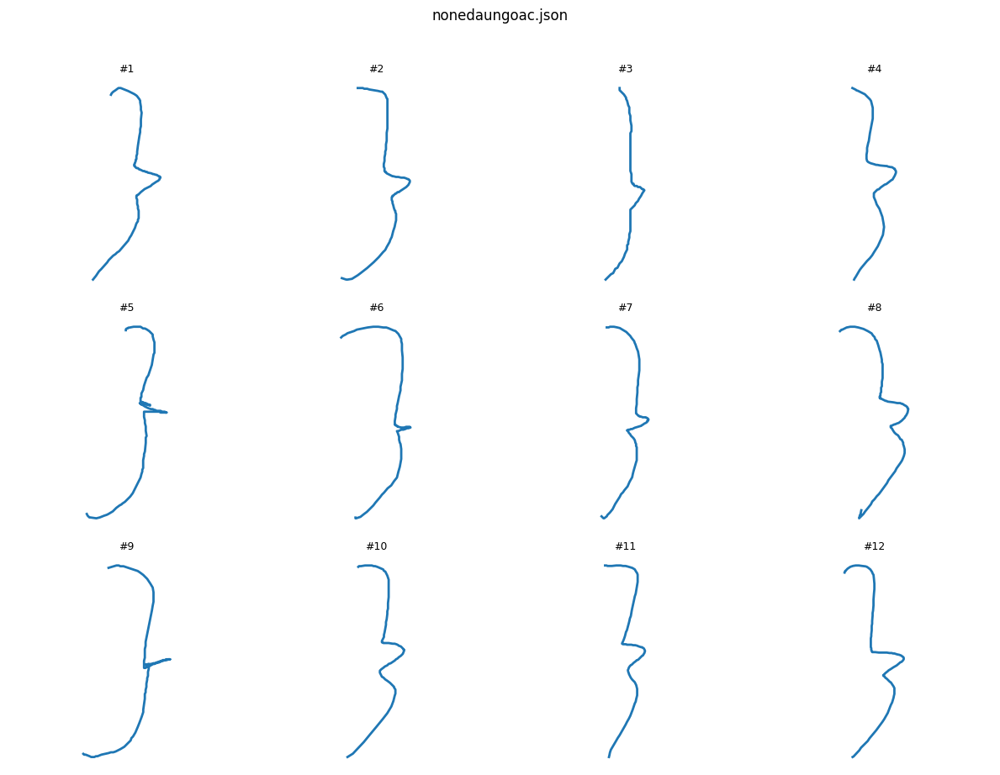

✅ Loaded 50 modifiers from NewData/QuangData/underline.json
✅ Loaded 50 modifiers from NewData/QuangData/nicebox_2.json
✅ Loaded 50 modifiers from NewData/QuangData/curlybox.json
✅ Loaded 50 modifiers from NewData/QuangData/boxshortcut.json
✅ Loaded 50 modifiers from NewData/QuangData/curlyshortcut.json
✅ Loaded 50 modifiers from NewData/QuangData/circleshortcut.json
✅ Loaded 51 modifiers from NewData/QuangData/delete_vertical.json
✅ Loaded 50 modifiers from NewData/QuangData/hordelete.json
✅ Loaded 50 modifiers from NewData/QuangData/nonedot.json
✅ Loaded 50 modifiers from NewData/QuangData/nonedaulon.json
✅ Loaded 50 modifiers from NewData/QuangData/nonedaungoac.json
✅ Merged 11 files with 551 total modifiers.


In [96]:
import json
import os
import matplotlib.pyplot as plt

# === Base paths ===
Quang_input_files = [
    "NewData/QuangData/underline.json",
    "NewData/QuangData/nicebox_2.json",
    "NewData/QuangData/curlybox.json",
    "NewData/QuangData/boxshortcut.json",
    "NewData/QuangData/curlyshortcut.json",
    "NewData/QuangData/circleshortcut.json",
    "NewData/QuangData/delete_vertical.json",
    "NewData/QuangData/hordelete.json",
    "NewData/QuangData/nonedot.json",
    "NewData/QuangData/nonedaulon.json",
    "NewData/QuangData/nonedaungoac.json",
]

# === Run preview for each file ===
for fpath in Quang_input_files:
    if os.path.exists(fpath):
        preview_first_strokes(fpath, n_samples=12)
    else:
        print(f"⚠️ Missing: {fpath}")

Quang_data = merge_json_files(Quang_input_files)




📂 underline_1.json → 51 total strokes
🔎 Unique modifier types:
   • underline: 51 samples


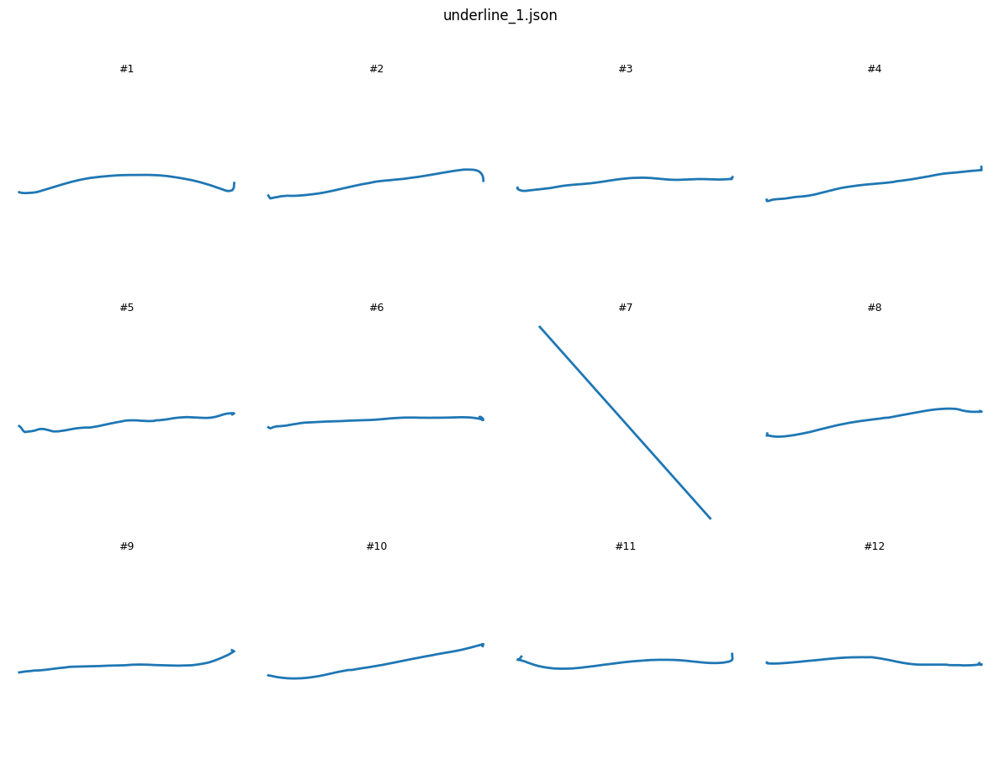


📂 underline_2.json → 50 total strokes
🔎 Unique modifier types:
   • underline: 50 samples


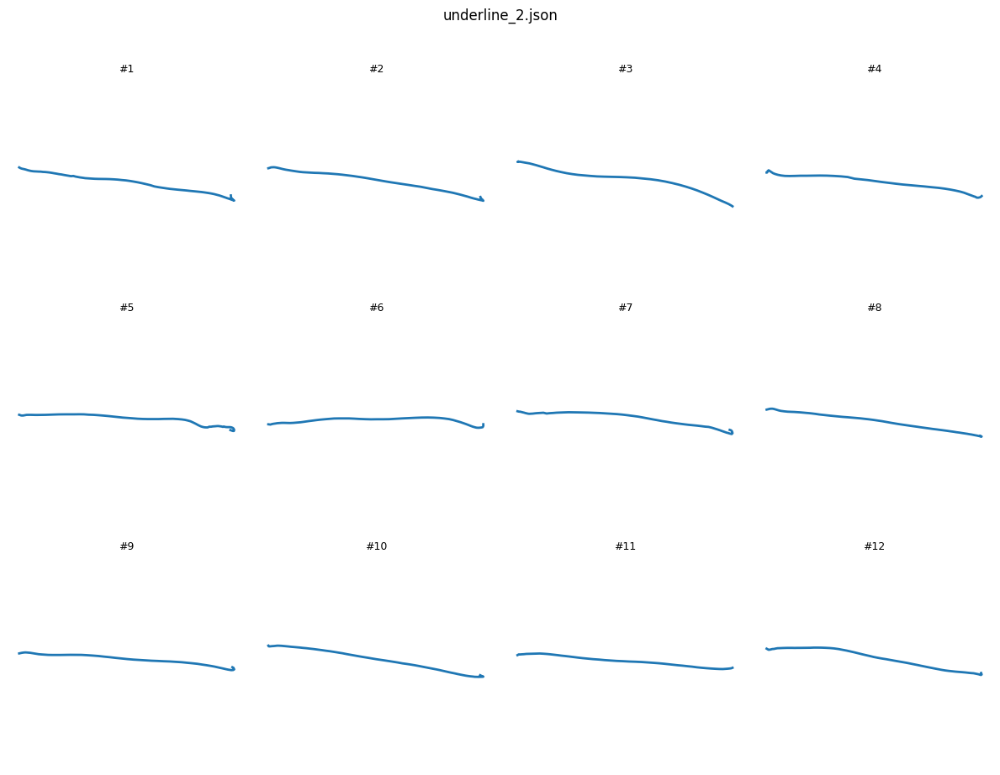


📂 underline_3.json → 25 total strokes
🔎 Unique modifier types:
   • underline: 25 samples


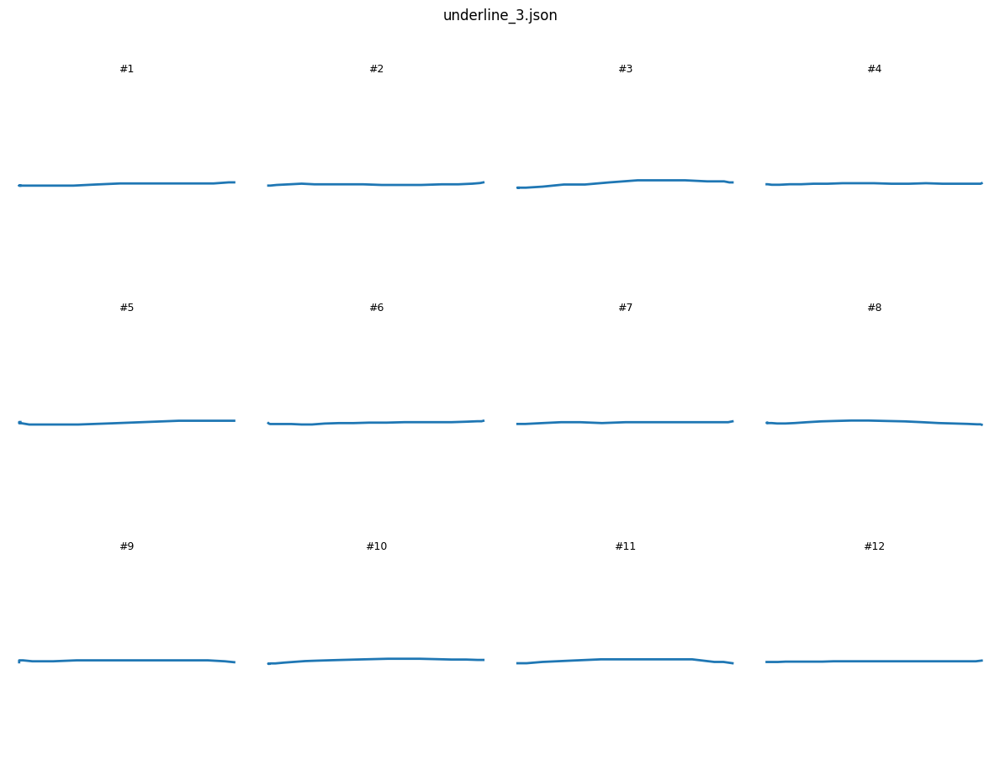


📂 box.json → 25 total strokes
🔎 Unique modifier types:
   • box: 25 samples


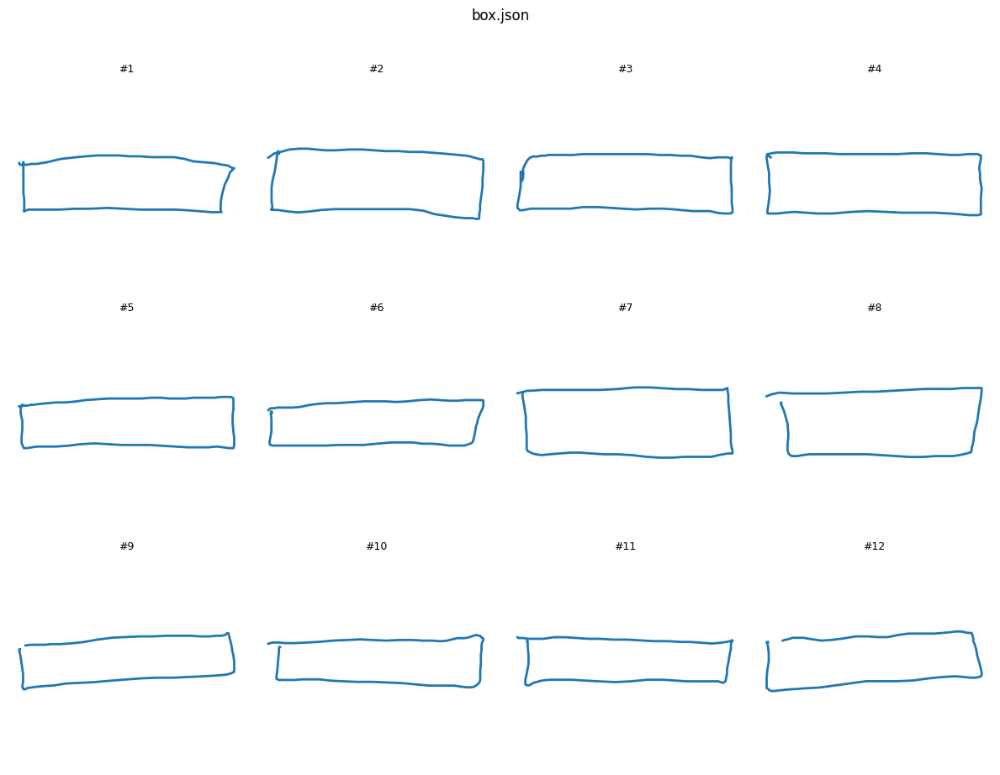


📂 uglybox.json → 61 total strokes
🔎 Unique modifier types:
   • box: 61 samples


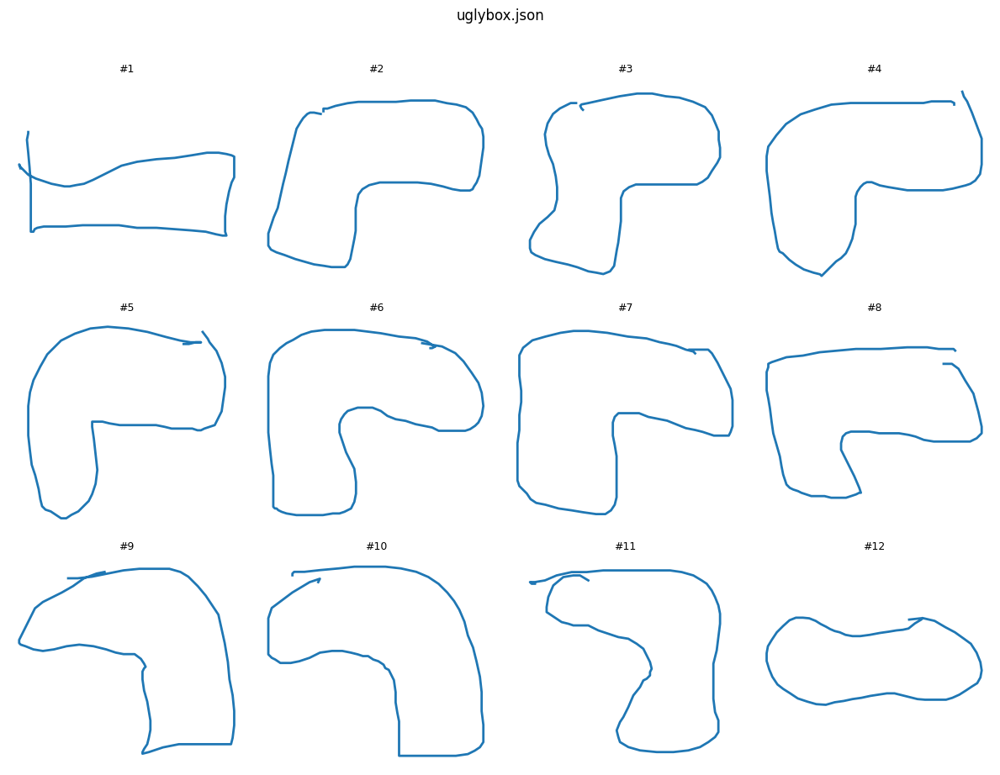


📂 curlybox.json → 28 total strokes
🔎 Unique modifier types:
   • curly: 28 samples


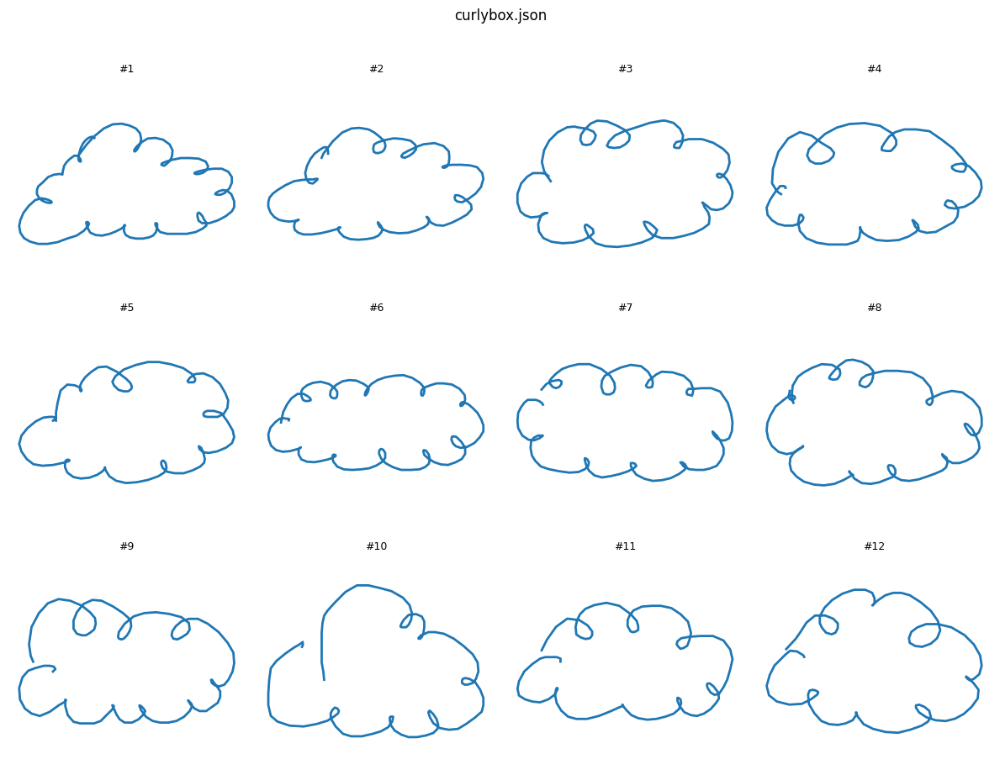


📂 boxshortcut.json → 59 total strokes
🔎 Unique modifier types:
   • boxshortcut: 59 samples


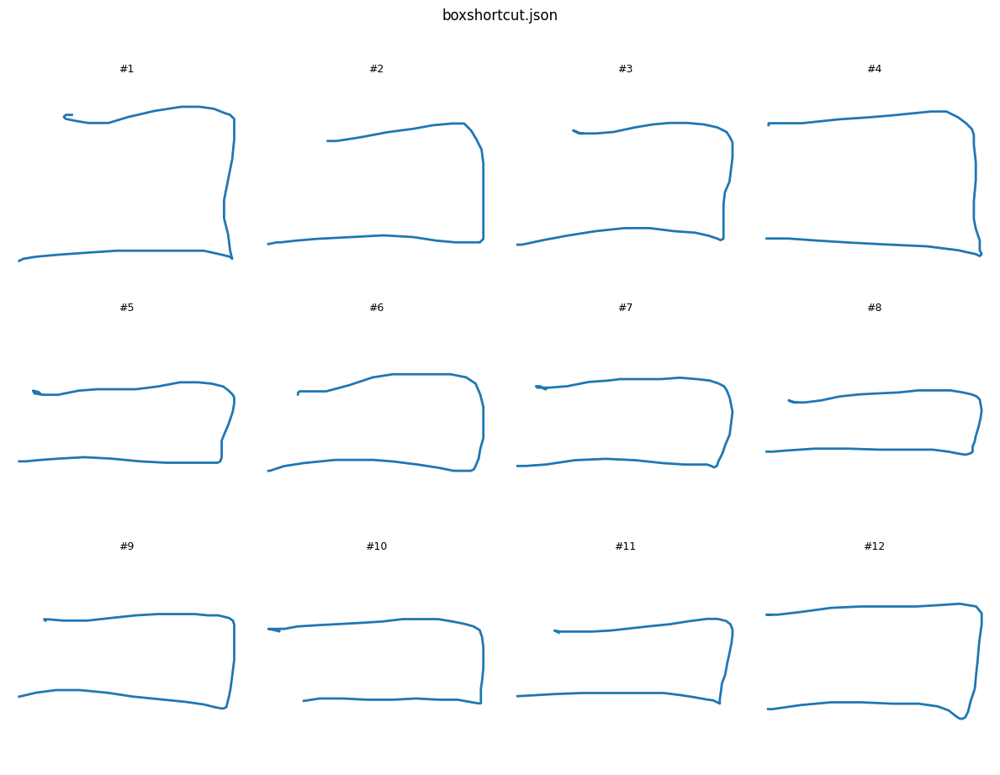


📂 curlyshortcut.json → 52 total strokes
🔎 Unique modifier types:
   • curlyshortcut: 52 samples


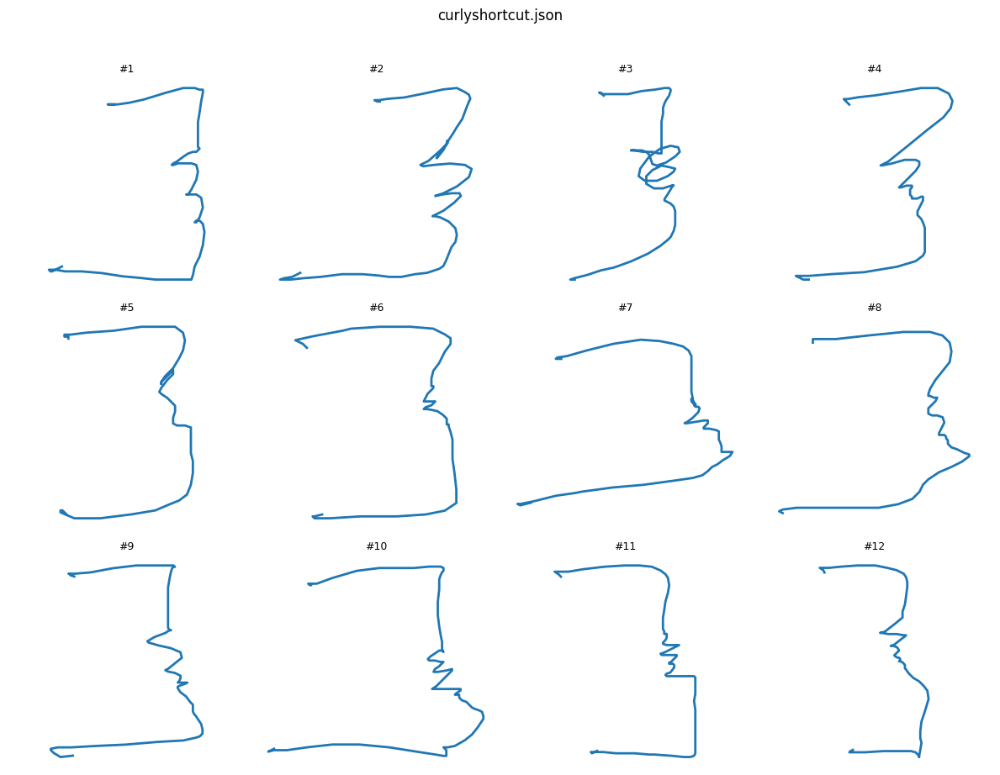


📂 circleshortcut.json → 62 total strokes
🔎 Unique modifier types:
   • circleshortcut: 62 samples


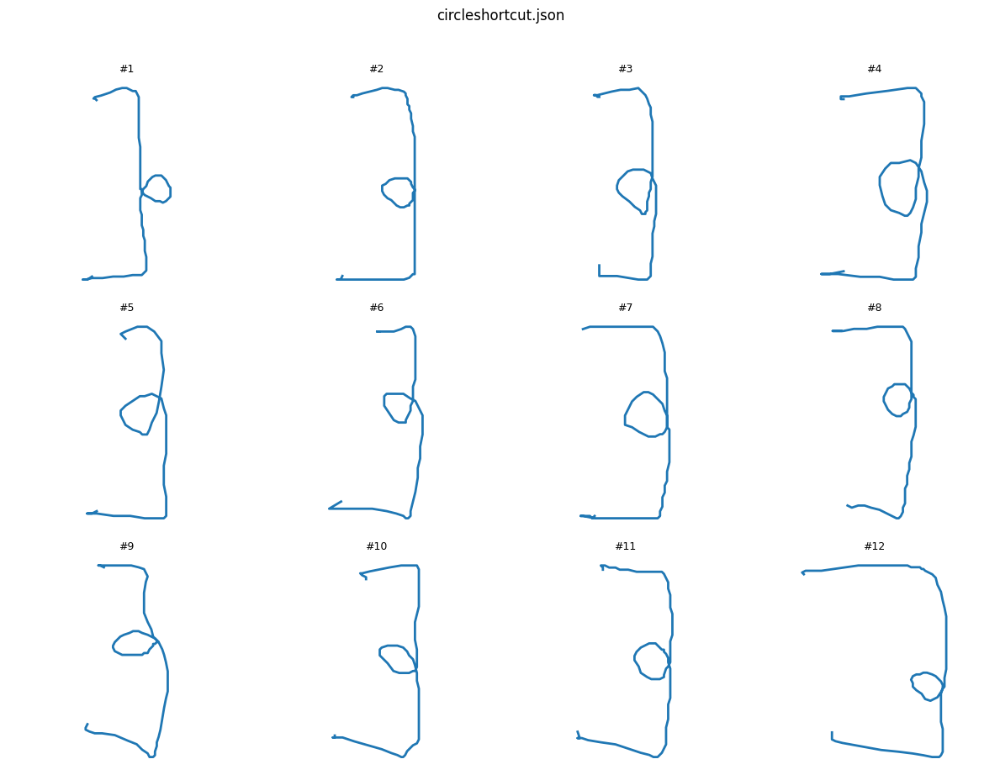


📂 deletehor.json → 51 total strokes
🔎 Unique modifier types:
   • delete: 51 samples


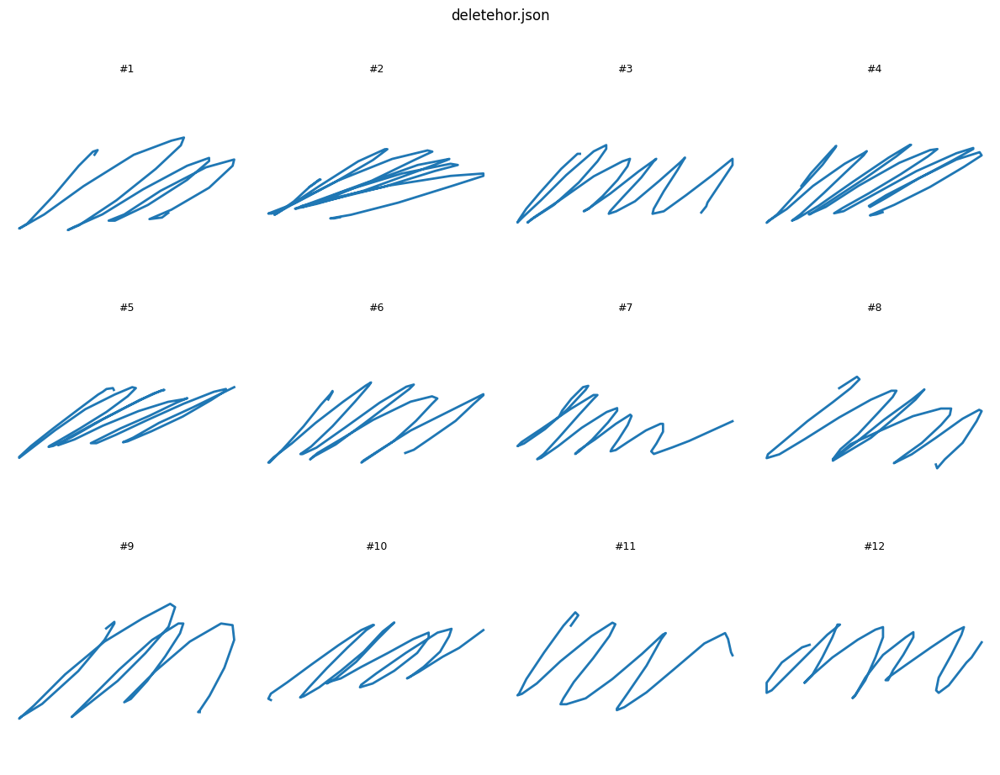


📂 delver.json → 50 total strokes
🔎 Unique modifier types:
   • delete: 50 samples


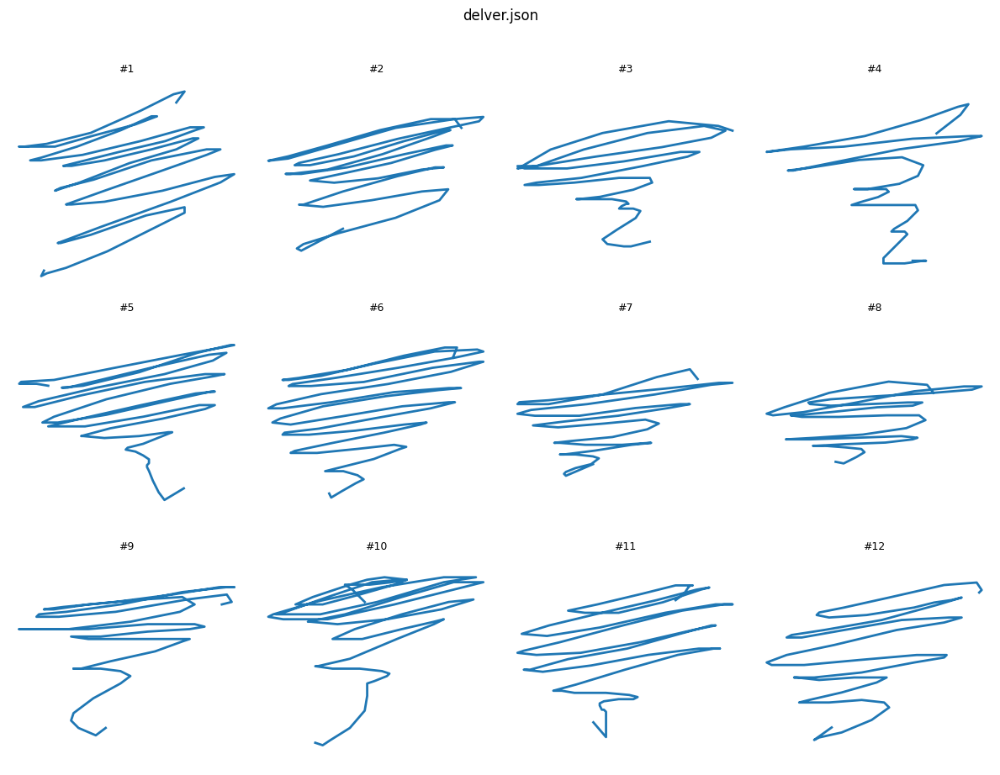


📂 nonedot.json → 50 total strokes
🔎 Unique modifier types:
   • nonedot: 50 samples


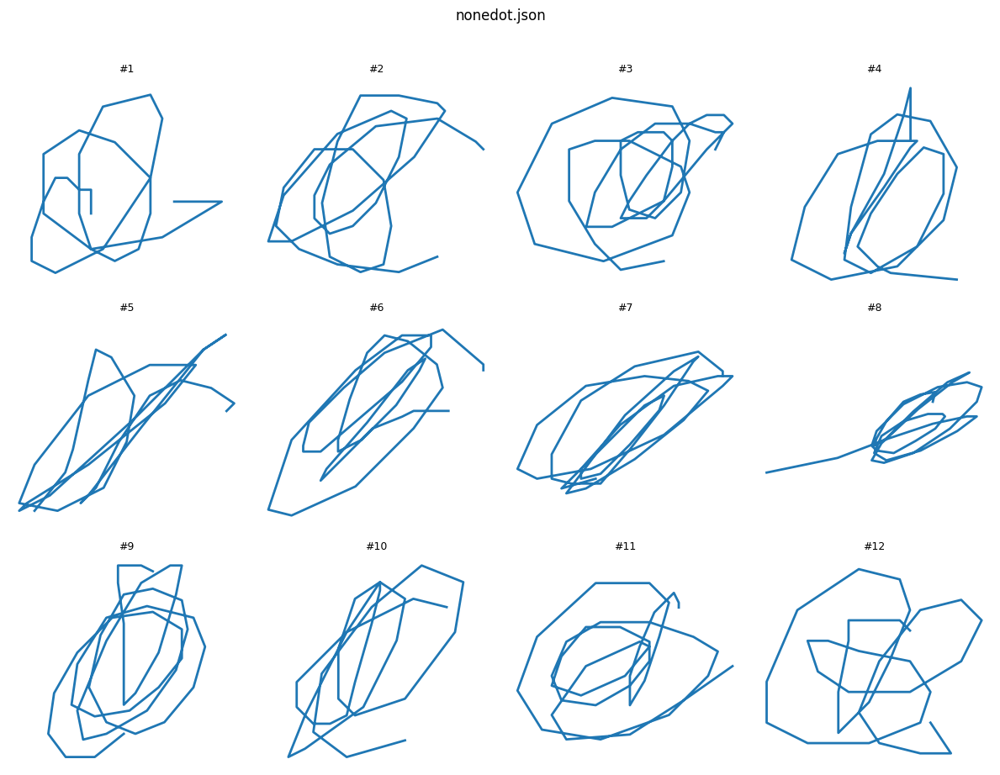


📂 none_>.json → 55 total strokes
🔎 Unique modifier types:
   • nonedaulon: 55 samples


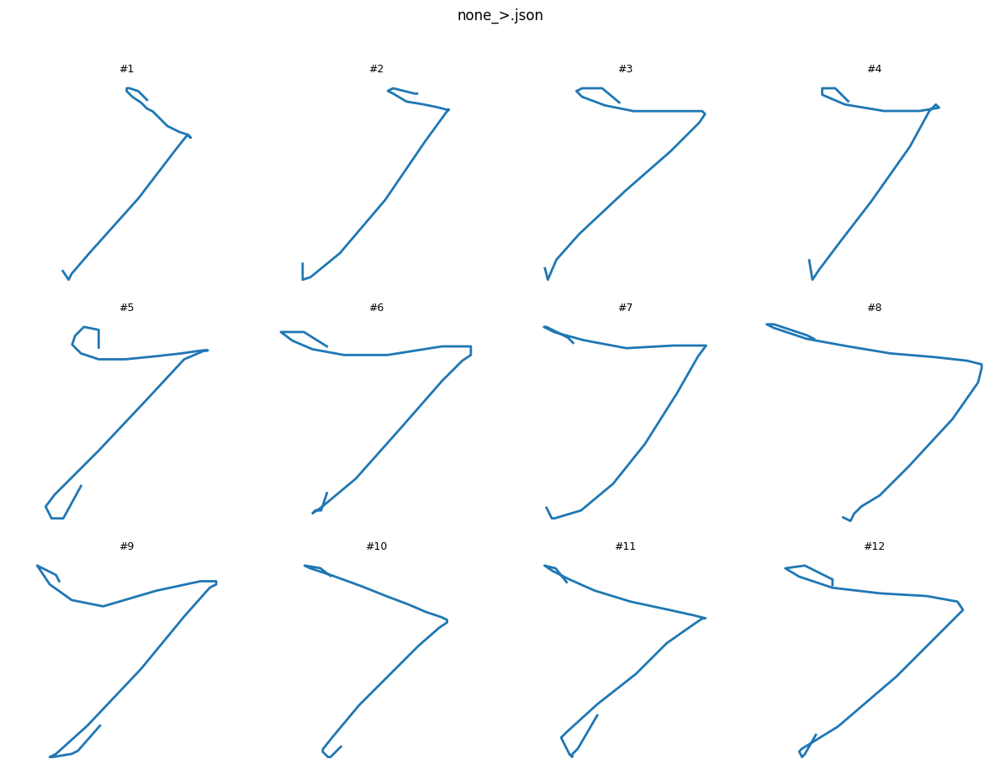


📂 nonenhon.json → 59 total strokes
🔎 Unique modifier types:
   • nonenhon: 59 samples


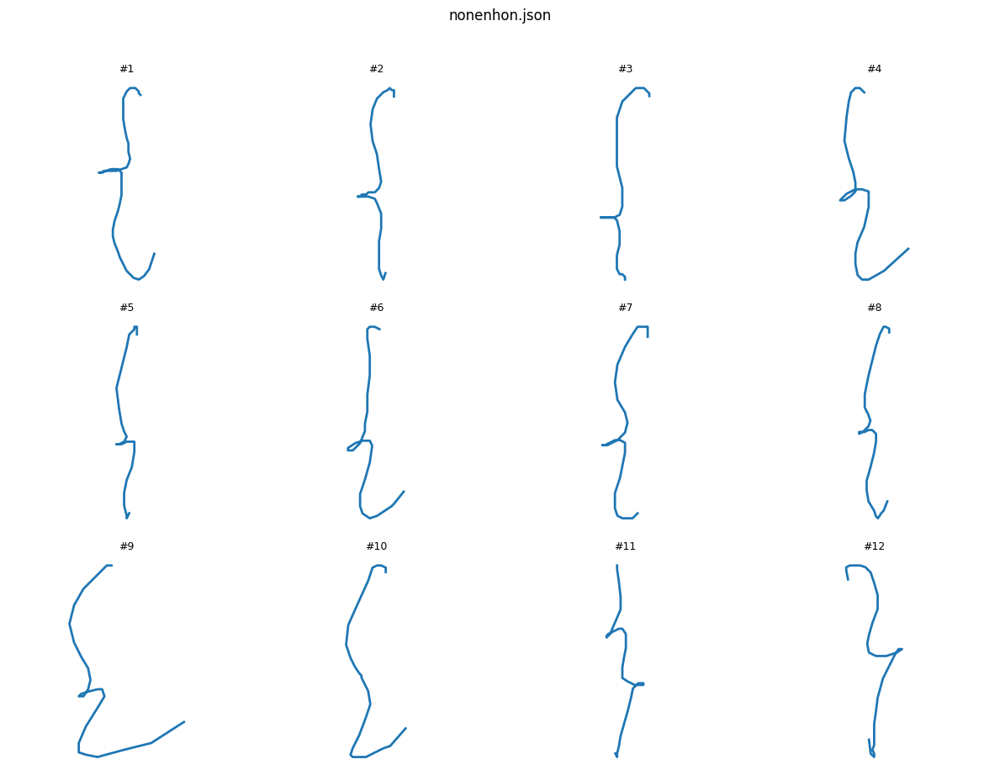

✅ Loaded 51 modifiers from NewData/LinhData/underline_1.json
✅ Loaded 50 modifiers from NewData/LinhData/underline_2.json
✅ Loaded 25 modifiers from NewData/LinhData/underline_3.json
✅ Loaded 25 modifiers from NewData/LinhData/box.json
✅ Loaded 61 modifiers from NewData/LinhData/uglybox.json
✅ Loaded 28 modifiers from NewData/LinhData/curlybox.json
✅ Loaded 59 modifiers from NewData/LinhData/boxshortcut.json
✅ Loaded 52 modifiers from NewData/LinhData/curlyshortcut.json
✅ Loaded 62 modifiers from NewData/LinhData/circleshortcut.json
✅ Loaded 51 modifiers from NewData/LinhData/deletehor.json
✅ Loaded 50 modifiers from NewData/LinhData/delver.json
✅ Loaded 50 modifiers from NewData/LinhData/nonedot.json
✅ Loaded 55 modifiers from NewData/LinhData/none_>.json
✅ Loaded 59 modifiers from NewData/LinhData/nonenhon.json
✅ Merged 14 files with 678 total modifiers.


In [97]:
import json
import os
import matplotlib.pyplot as plt

# === Base paths ===
Linh_input_files = [
    "NewData/LinhData/underline_1.json",
    "NewData/LinhData/underline_2.json",
    "NewData/LinhData/underline_3.json", 
    "NewData/LinhData/box.json",
    "NewData/LinhData/uglybox.json",
    "NewData/LinhData/curlybox.json",
    "NewData/LinhData/boxshortcut.json",
    "NewData/LinhData/curlyshortcut.json",
    "NewData/LinhData/circleshortcut.json",
    "NewData/LinhData/deletehor.json",
    "NewData/LinhData/delver.json",
    "NewData/LinhData/nonedot.json",
    "NewData/LinhData/none_>.json",
    "NewData/LinhData/nonenhon.json",
    
]


# === Run preview for each file ===
for fpath in Linh_input_files:
    if os.path.exists(fpath):
        preview_first_strokes(fpath, n_samples=12)
    else:
        print(f"⚠️ Missing: {fpath}")

Linh_data = merge_json_files(Linh_input_files)



📂 underline.json → 50 total strokes
🔎 Unique modifier types:
   • underline: 50 samples


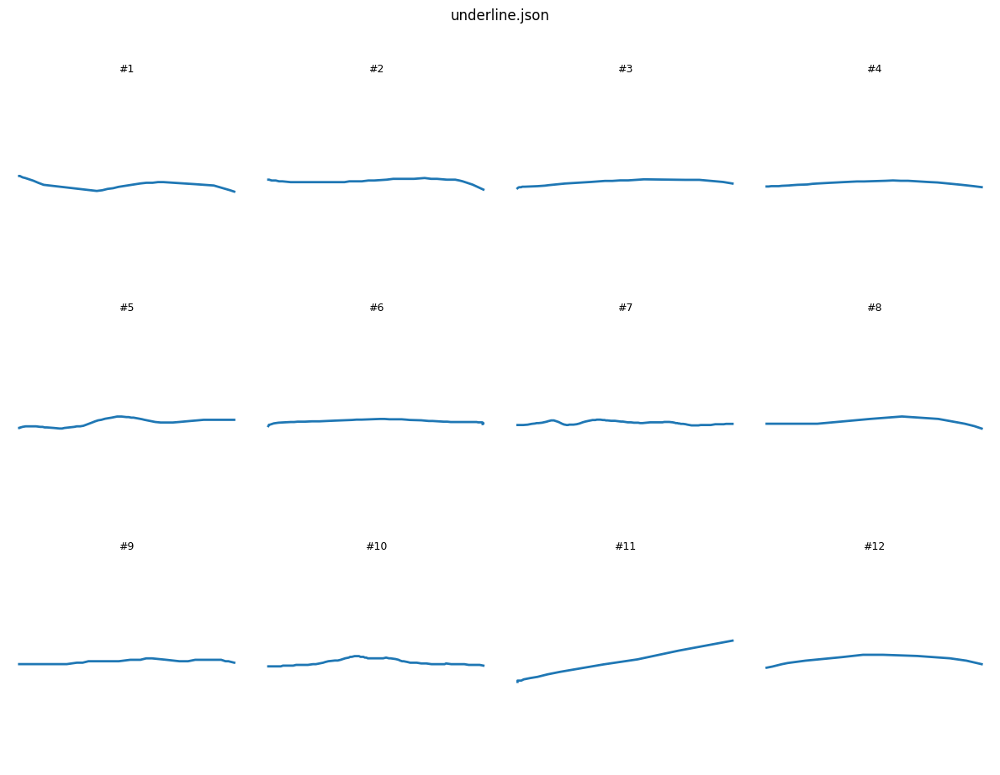


📂 underline2.json → 50 total strokes
🔎 Unique modifier types:
   • underline: 50 samples


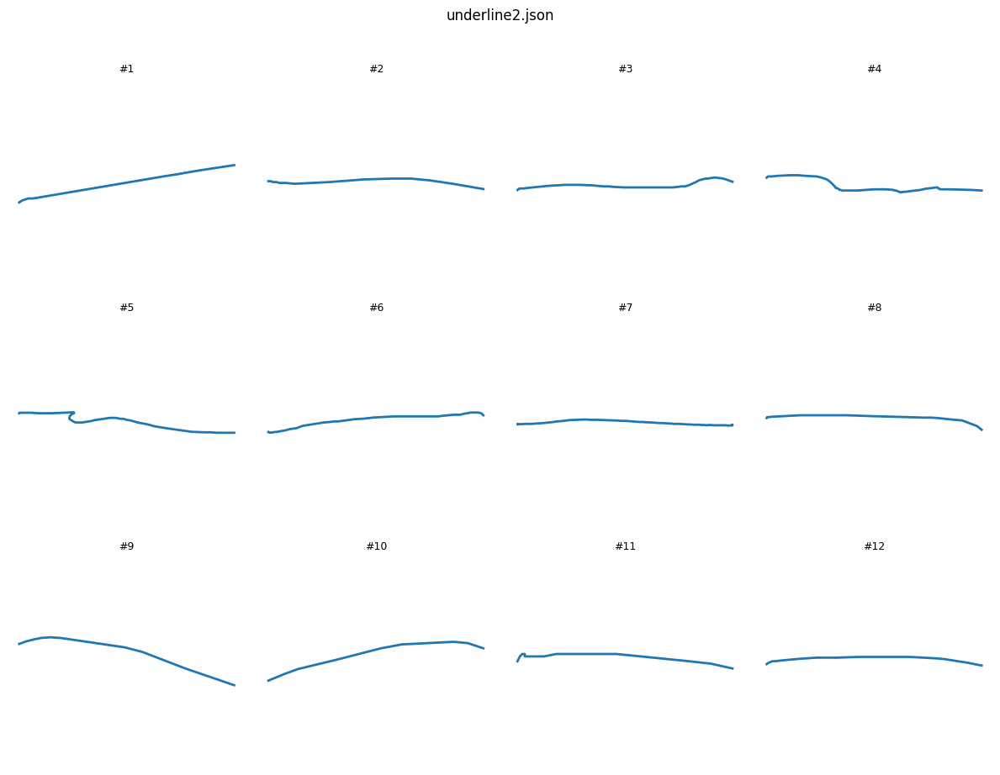


📂 box.json → 50 total strokes
🔎 Unique modifier types:
   • box: 50 samples


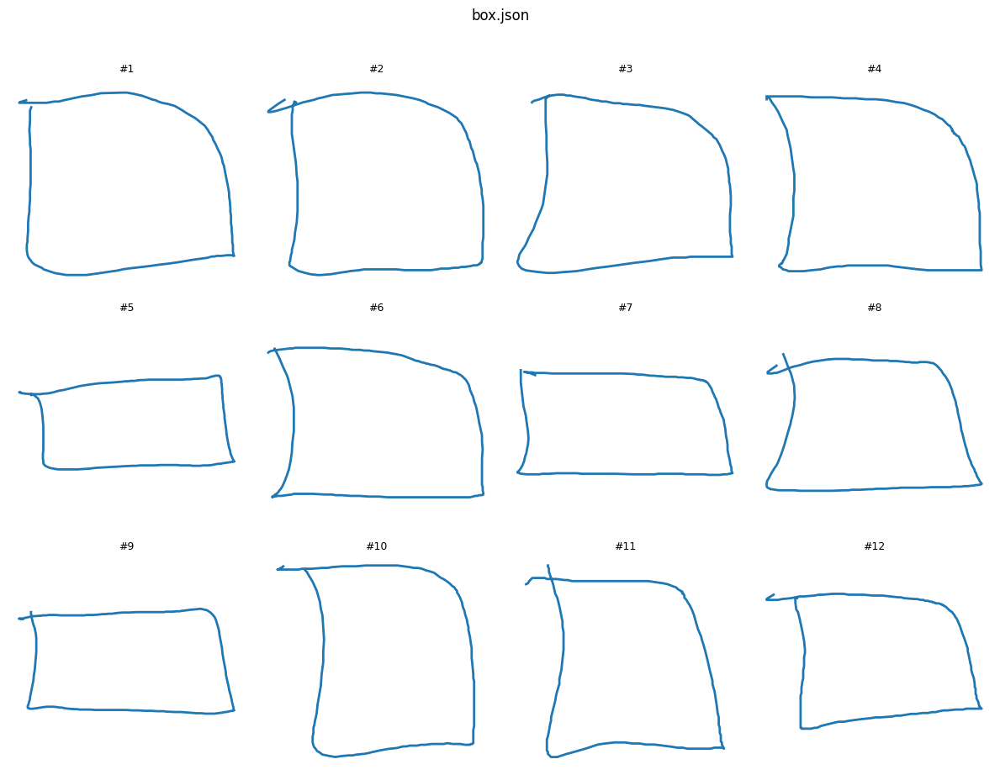


📂 curlybox.json → 50 total strokes
🔎 Unique modifier types:
   • curly: 50 samples


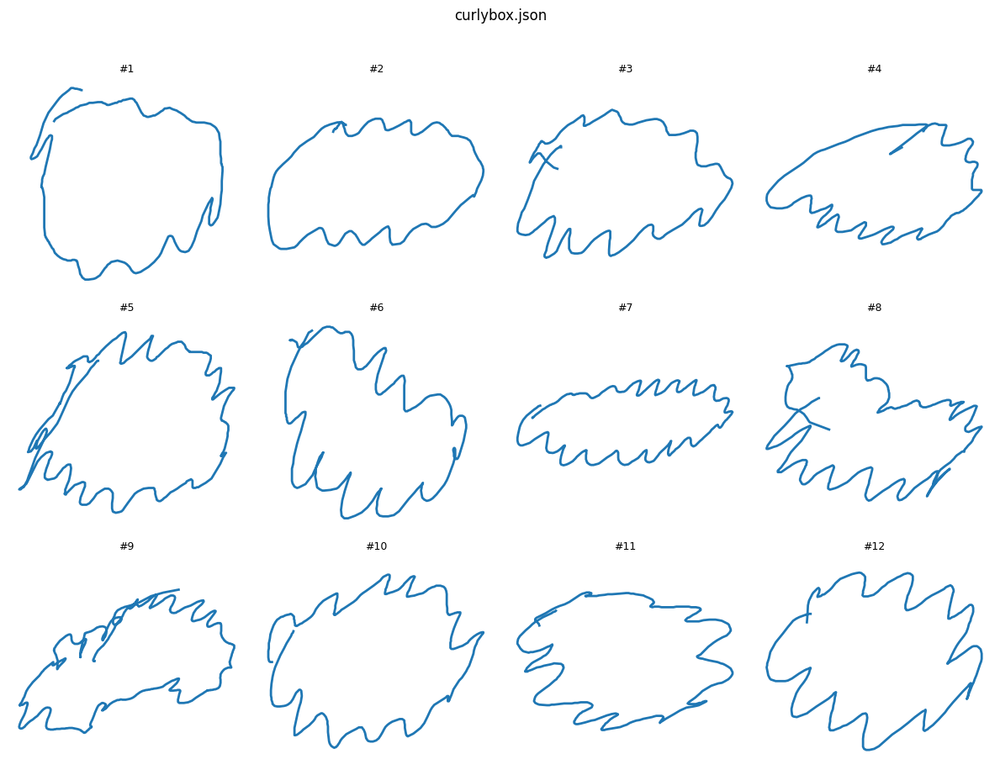


📂 boxshortcut.json → 50 total strokes
🔎 Unique modifier types:
   • boxshortcut: 50 samples


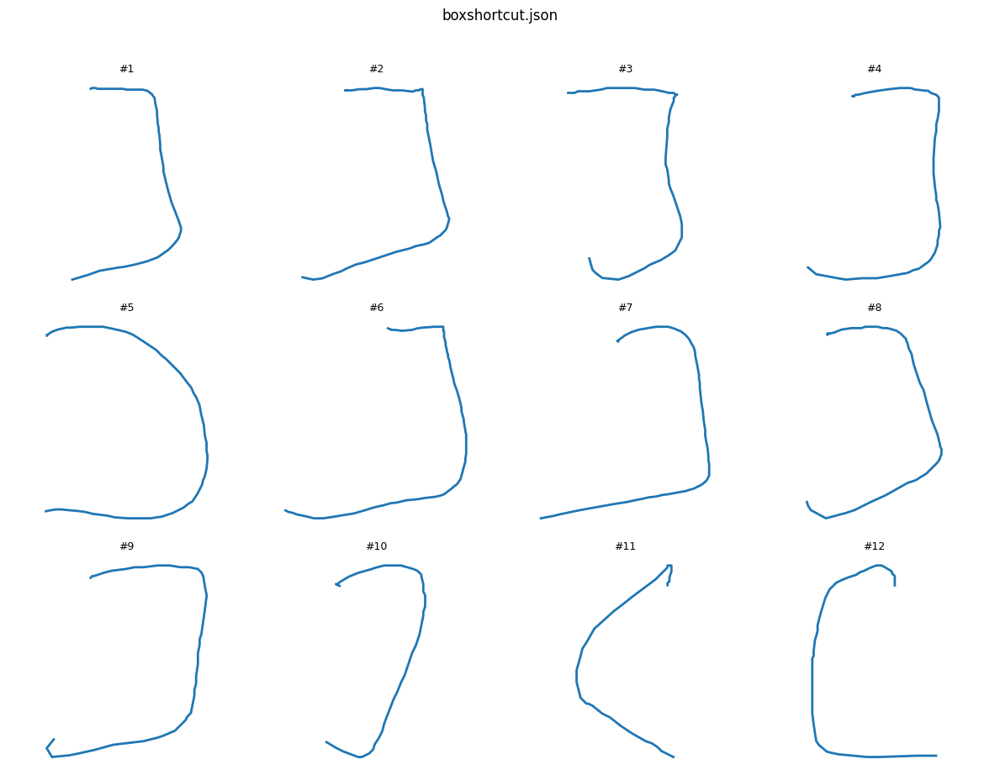


📂 curlyshortcut.json → 49 total strokes
🔎 Unique modifier types:
   • curlyshortcut: 49 samples


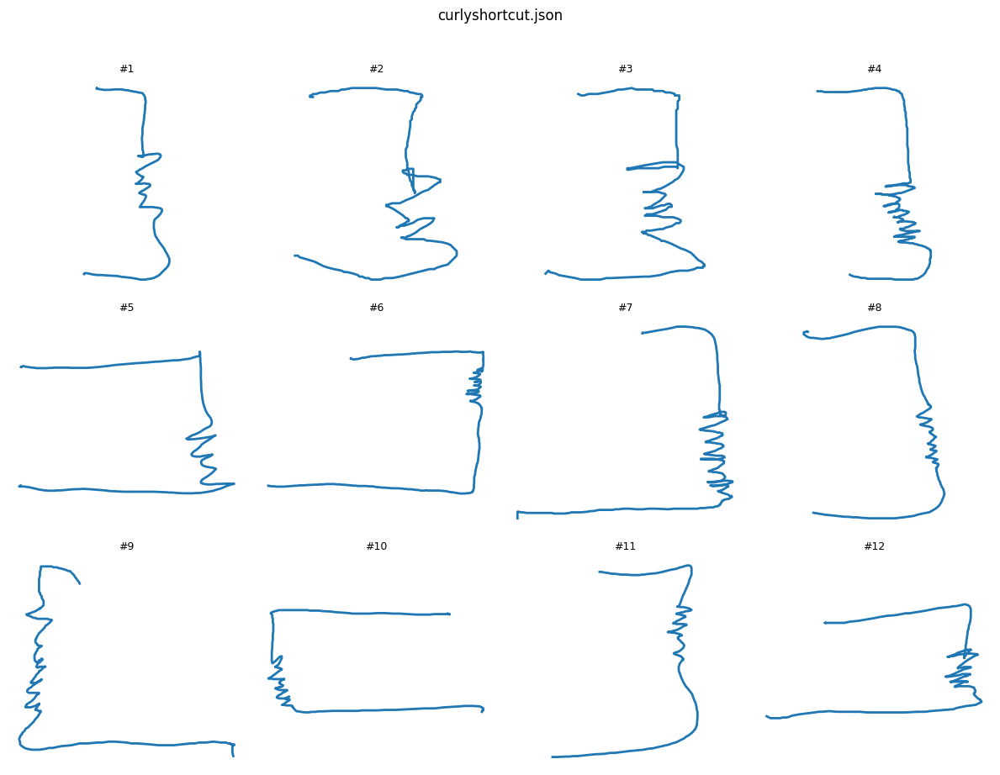


📂 circleshortcut.json → 50 total strokes
🔎 Unique modifier types:
   • circleshortcut: 50 samples


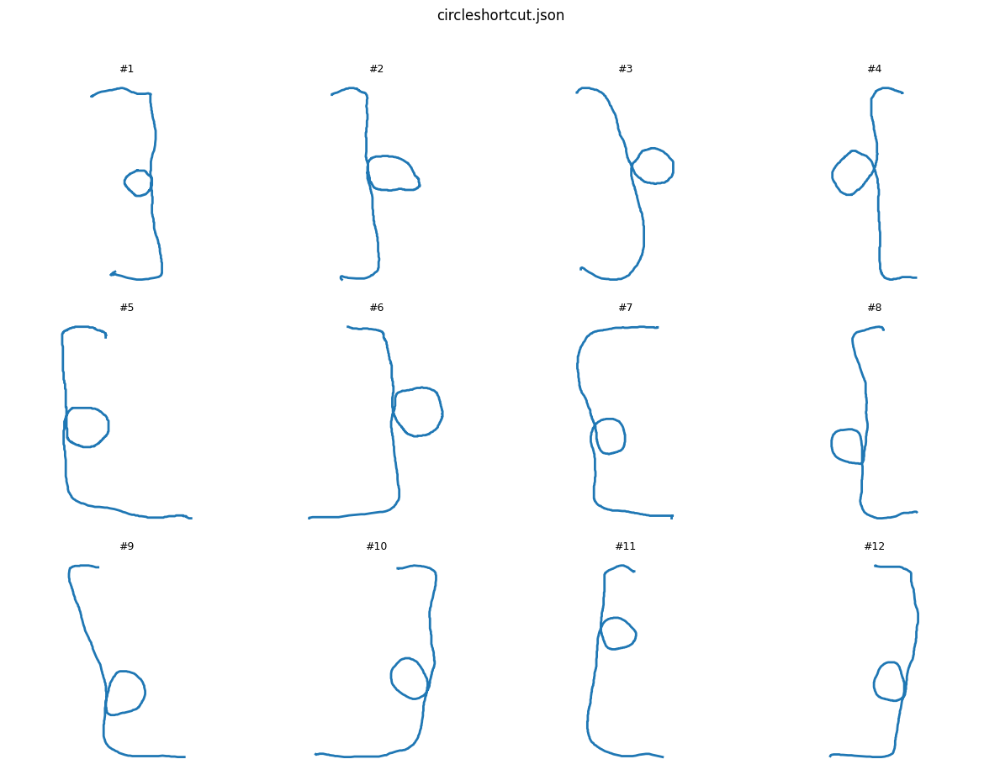


📂 deletengang1.json → 50 total strokes
🔎 Unique modifier types:
   • delete: 50 samples


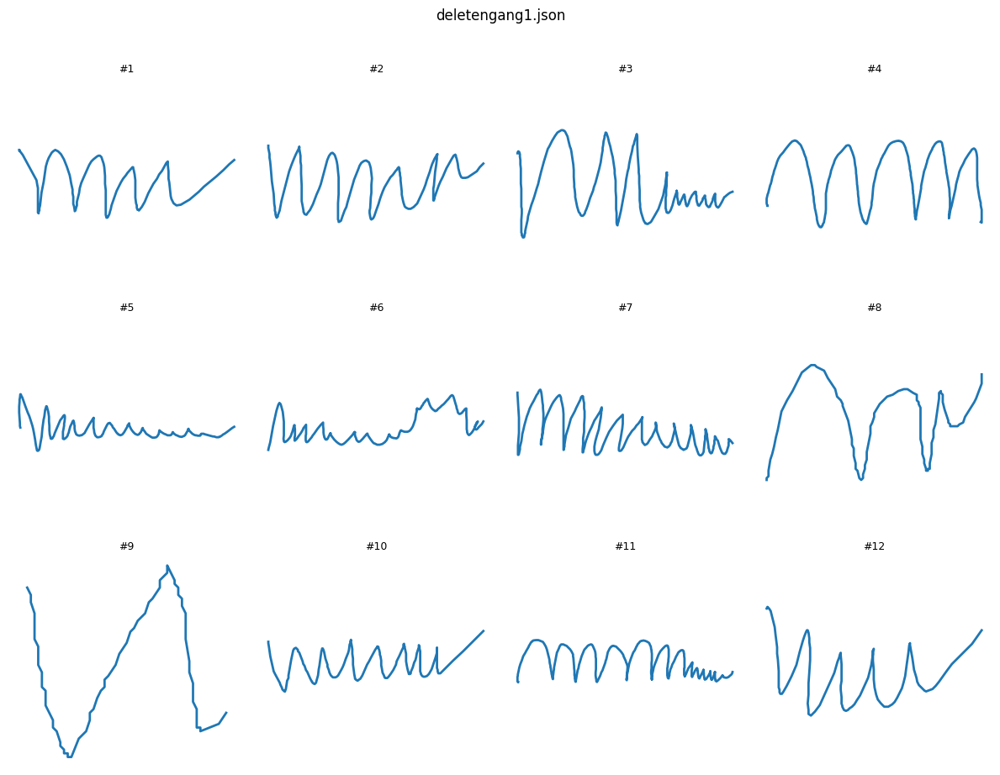


📂 deletedoc.json → 49 total strokes
🔎 Unique modifier types:
   • delete: 49 samples


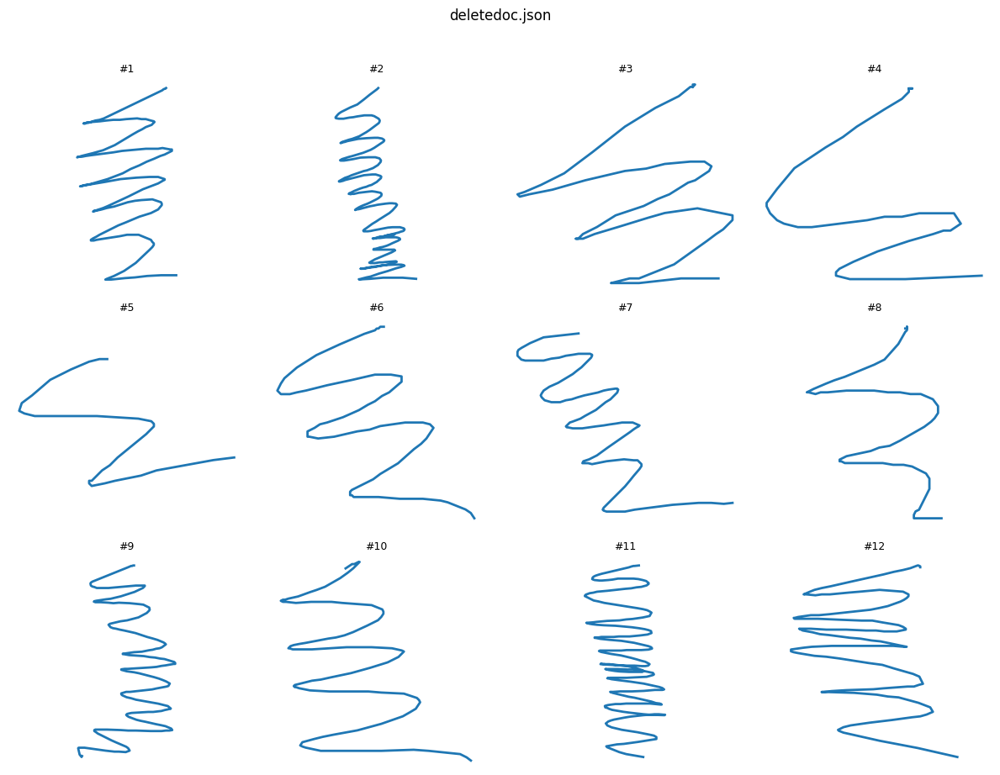


📂 nonedaucham.json → 100 total strokes
🔎 Unique modifier types:
   • nonedot: 100 samples


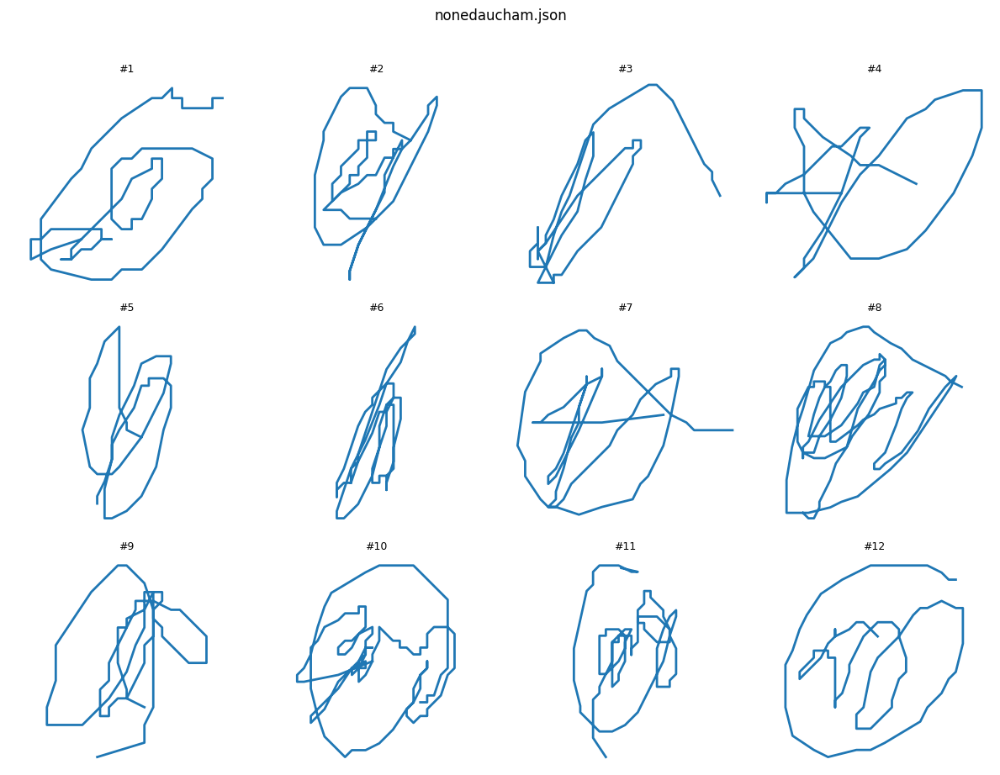


📂 nonedaucham2.json → 100 total strokes
🔎 Unique modifier types:
   • nonedot: 100 samples


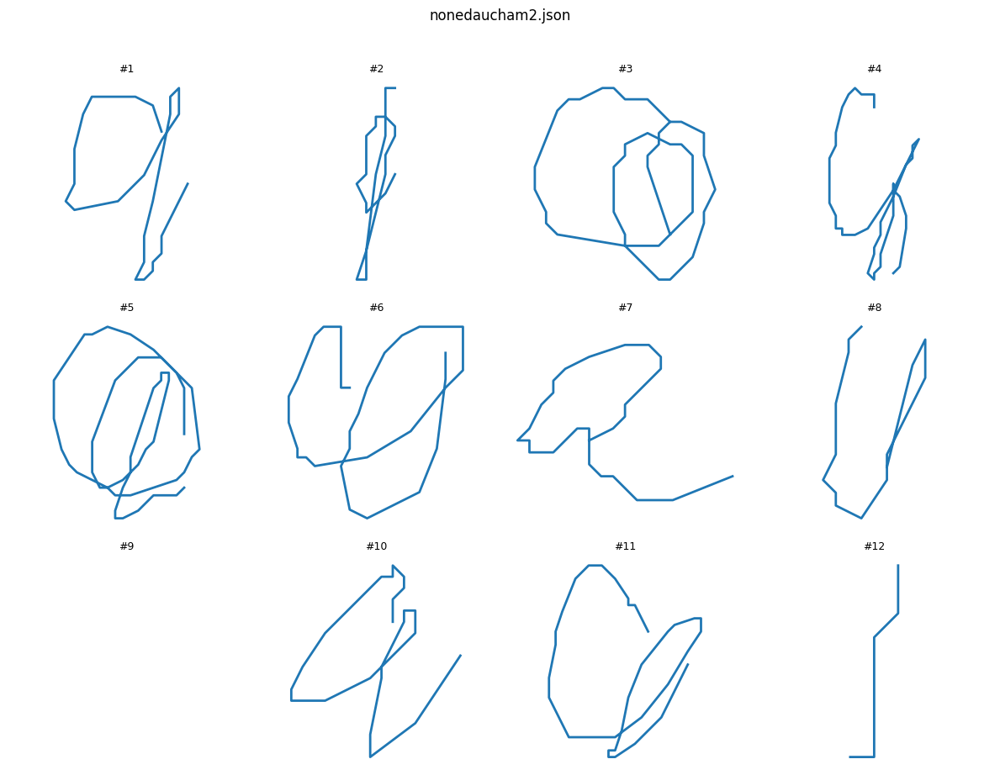


📂 nonedaulon.json → 50 total strokes
🔎 Unique modifier types:
   • nonedaulon: 50 samples


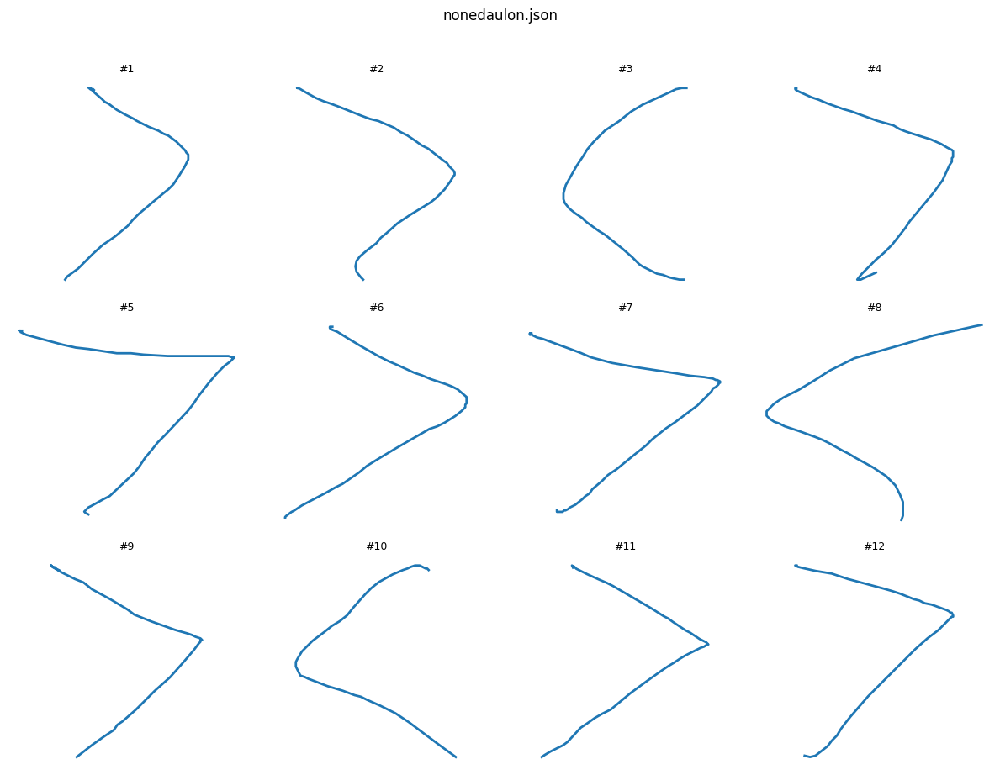


📂 nonedaulon2.json → 50 total strokes
🔎 Unique modifier types:
   • nonedaulon: 50 samples


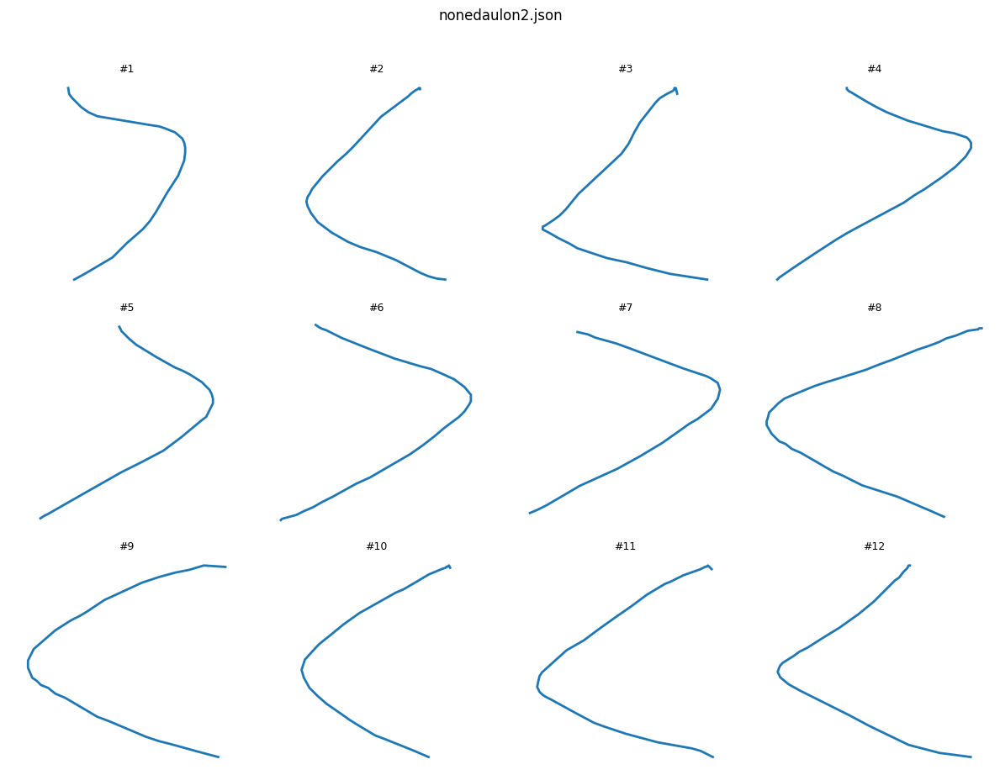


📂 nonedaunhon.json → 50 total strokes
🔎 Unique modifier types:
   • nonenhon: 50 samples


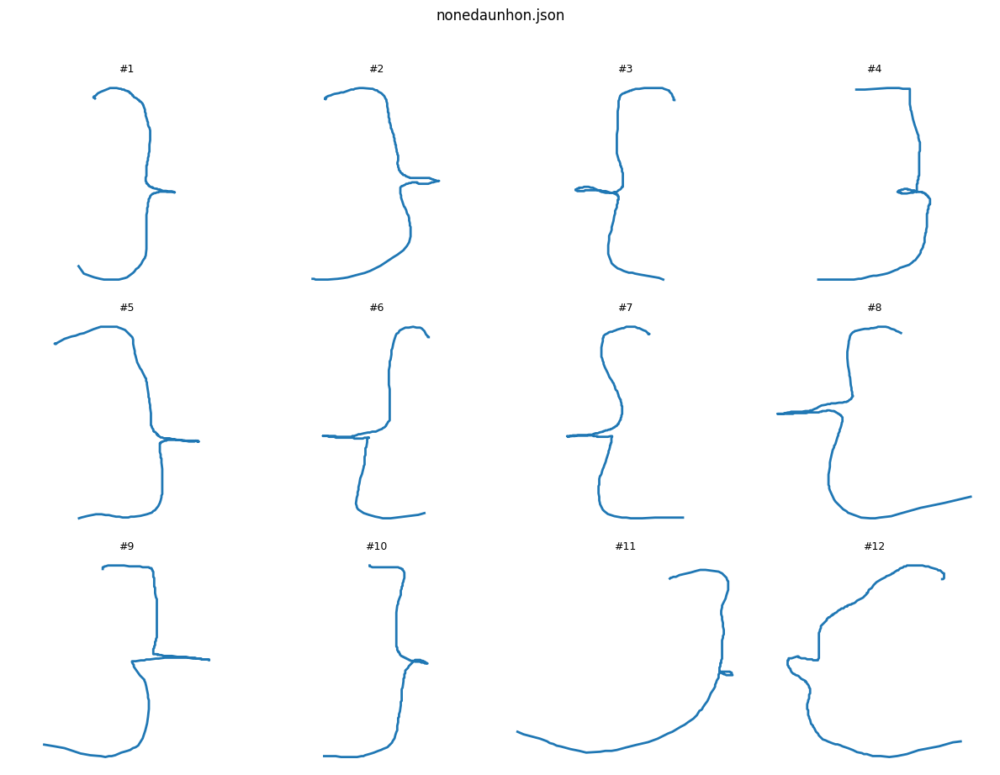


📂 nonedaunhon2.json → 49 total strokes
🔎 Unique modifier types:
   • nonenhon: 49 samples


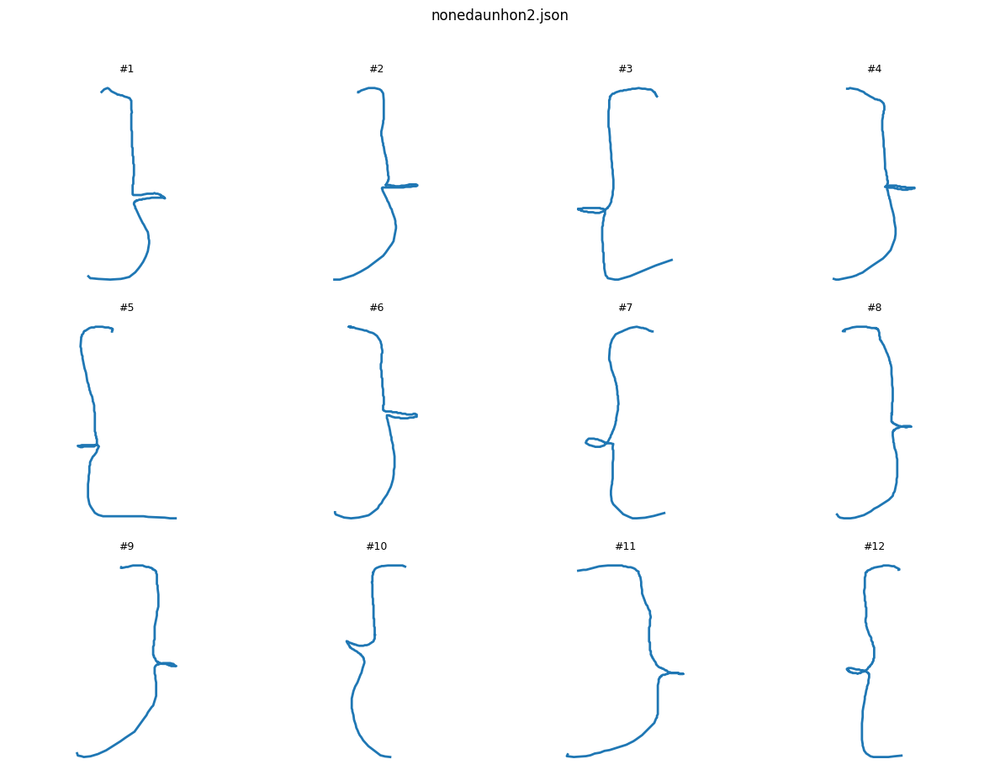

✅ Loaded 50 modifiers from NewData/SangData/underline.json
✅ Loaded 50 modifiers from NewData/SangData/underline2.json
✅ Loaded 50 modifiers from NewData/SangData/box.json
✅ Loaded 50 modifiers from NewData/SangData/curlybox.json
✅ Loaded 50 modifiers from NewData/SangData/boxshortcut.json
✅ Loaded 49 modifiers from NewData/SangData/curlyshortcut.json
✅ Loaded 50 modifiers from NewData/SangData/circleshortcut.json
✅ Loaded 50 modifiers from NewData/SangData/deletengang1.json
✅ Loaded 49 modifiers from NewData/SangData/deletedoc.json
✅ Loaded 100 modifiers from NewData/SangData/nonedaucham.json
✅ Loaded 100 modifiers from NewData/SangData/nonedaucham2.json
✅ Loaded 50 modifiers from NewData/SangData/nonedaulon.json
✅ Loaded 50 modifiers from NewData/SangData/nonedaulon2.json
✅ Loaded 50 modifiers from NewData/SangData/nonedaunhon.json
✅ Loaded 49 modifiers from NewData/SangData/nonedaunhon2.json
✅ Merged 15 files with 847 total modifiers.


In [98]:
import json
import os
import matplotlib.pyplot as plt

# === Base paths ===
Sang_input_files = [
    "NewData/SangData/underline.json",
    "NewData/SangData/underline2.json",
    "NewData/SangData/box.json",
    "NewData/SangData/curlybox.json",
    "NewData/SangData/boxshortcut.json",
    "NewData/SangData/curlyshortcut.json",
    "NewData/SangData/circleshortcut.json",
    "NewData/SangData/deletengang1.json",
    "NewData/SangData/deletedoc.json",
    "NewData/SangData/nonedaucham.json",
    "NewData/SangData/nonedaucham2.json",
    "NewData/SangData/nonedaulon.json",
    "NewData/SangData/nonedaulon2.json",
    "NewData/SangData/nonedaunhon.json",
    "NewData/SangData/nonedaunhon2.json",    
]

# === Run preview for each file ===
for fpath in Sang_input_files:
    if os.path.exists(fpath):
        preview_first_strokes(fpath, n_samples=12)
    else:
        print(f"⚠️ Missing: {fpath}")

Sang_data = merge_json_files(Sang_input_files)



📂 underline.json → 55 total strokes
🔎 Unique modifier types:
   • underline: 55 samples


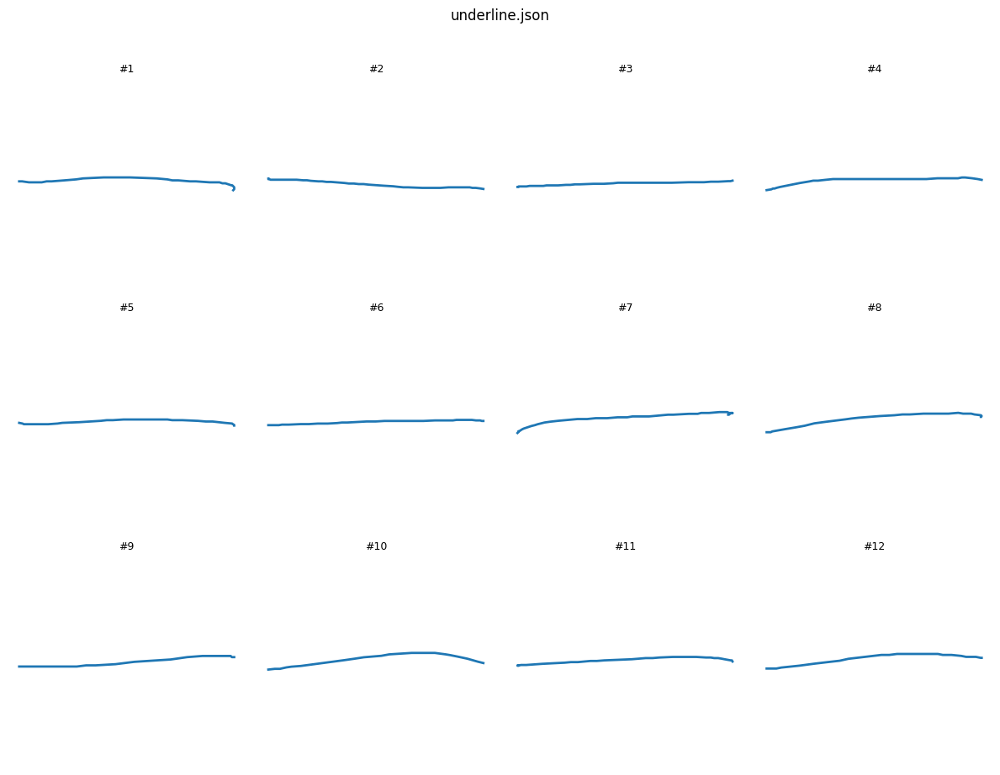


📂 boxcircle.json → 50 total strokes
🔎 Unique modifier types:
   • box: 50 samples


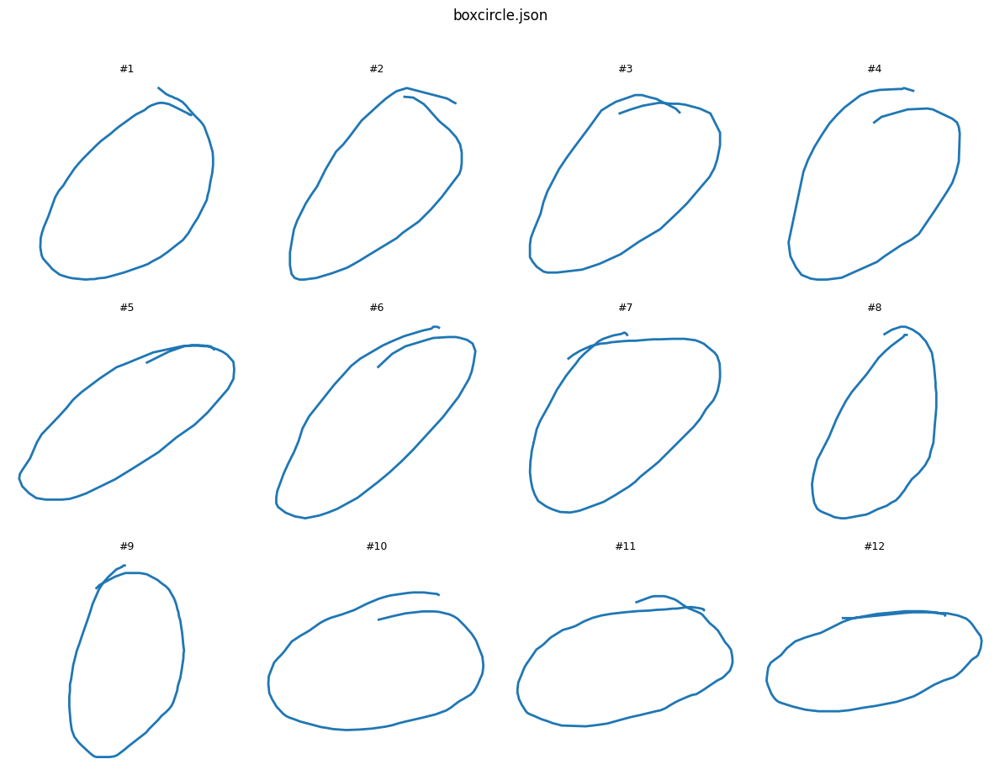


📂 boxsquare.json → 53 total strokes
🔎 Unique modifier types:
   • box: 53 samples


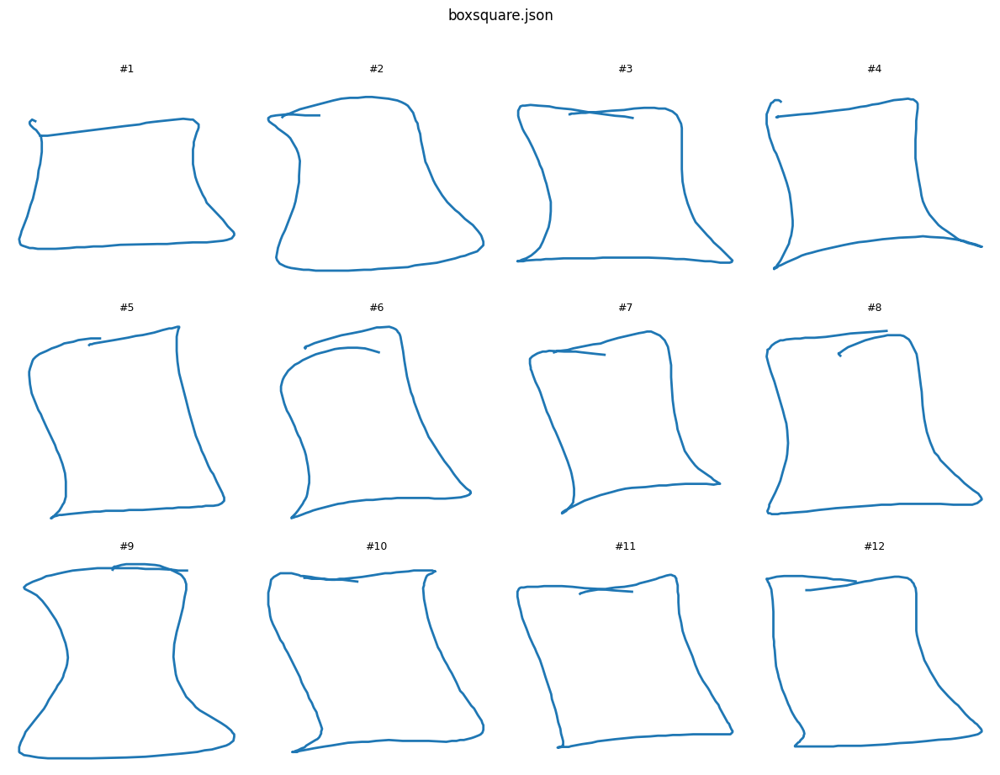


📂 boxtt.json → 51 total strokes
🔎 Unique modifier types:
   • box: 51 samples


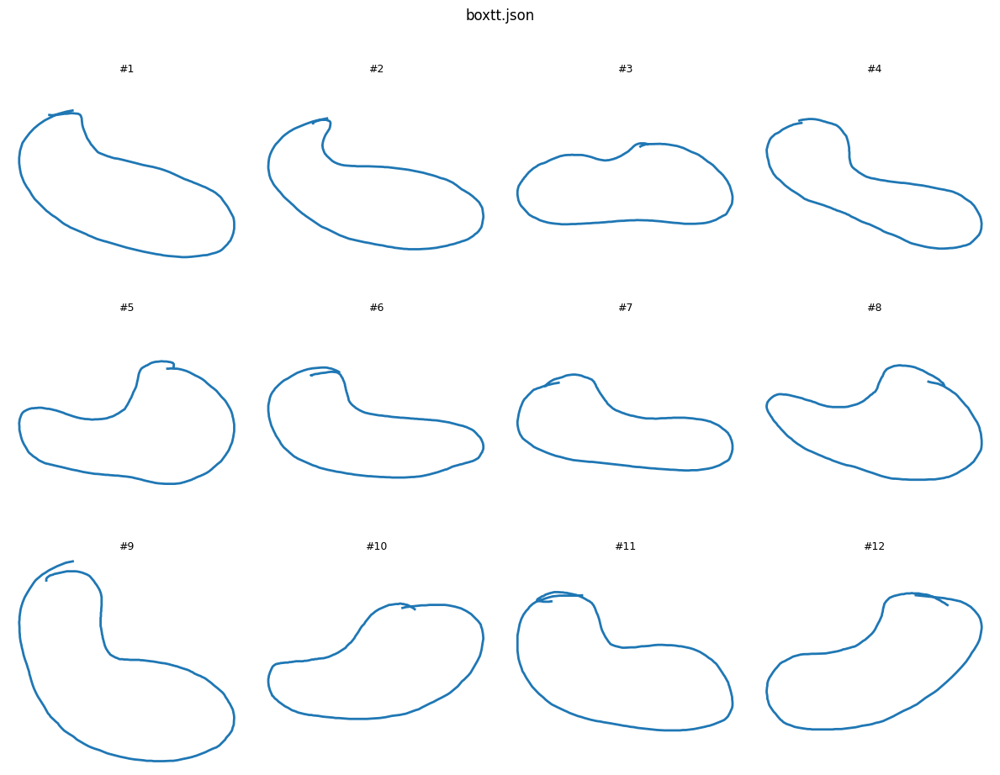


📂 curly.json → 50 total strokes
🔎 Unique modifier types:
   • curly: 50 samples


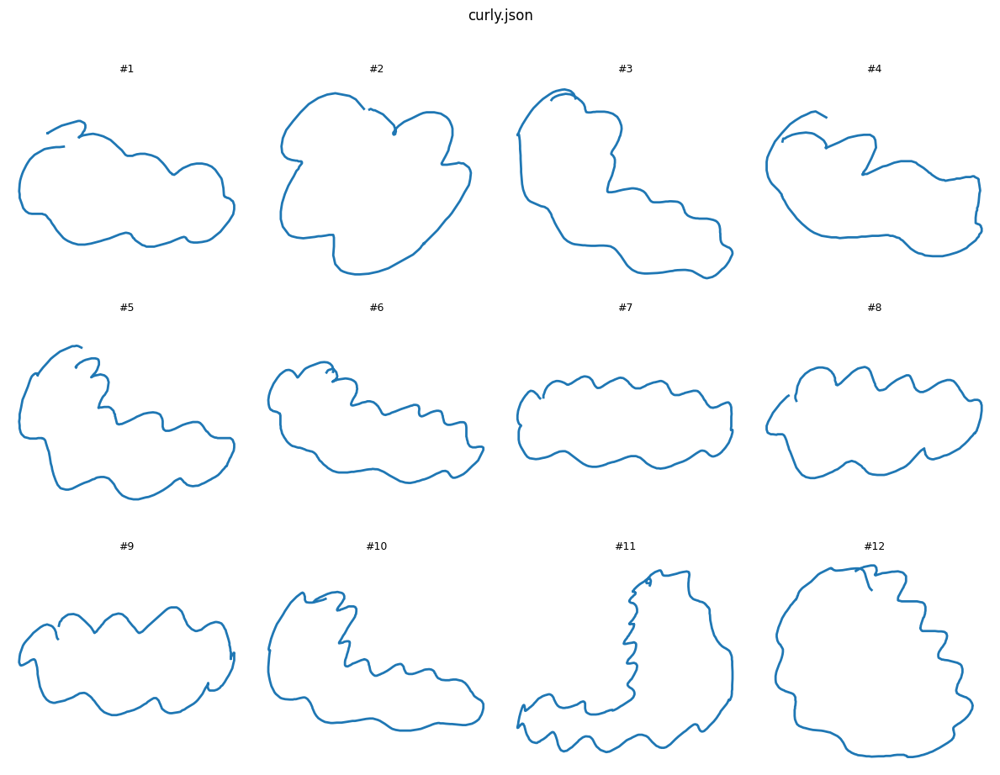


📂 boxshortcut.json → 52 total strokes
🔎 Unique modifier types:
   • boxshortcut: 52 samples


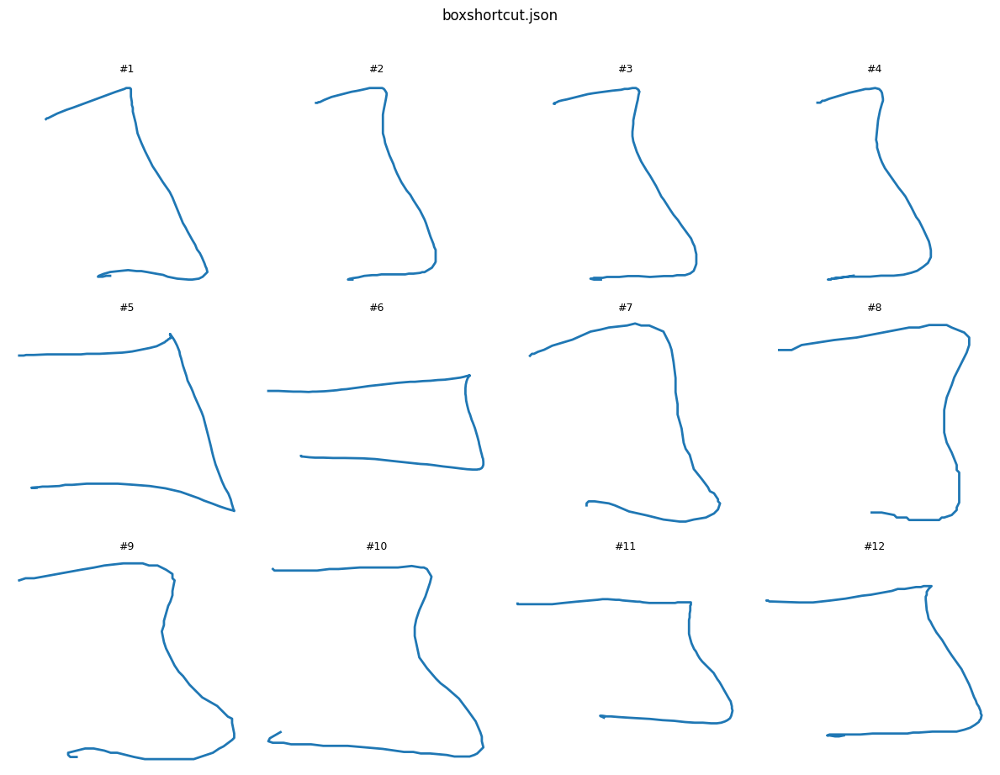


📂 curlyshortcut.json → 76 total strokes
🔎 Unique modifier types:
   • curlyshortcut: 76 samples


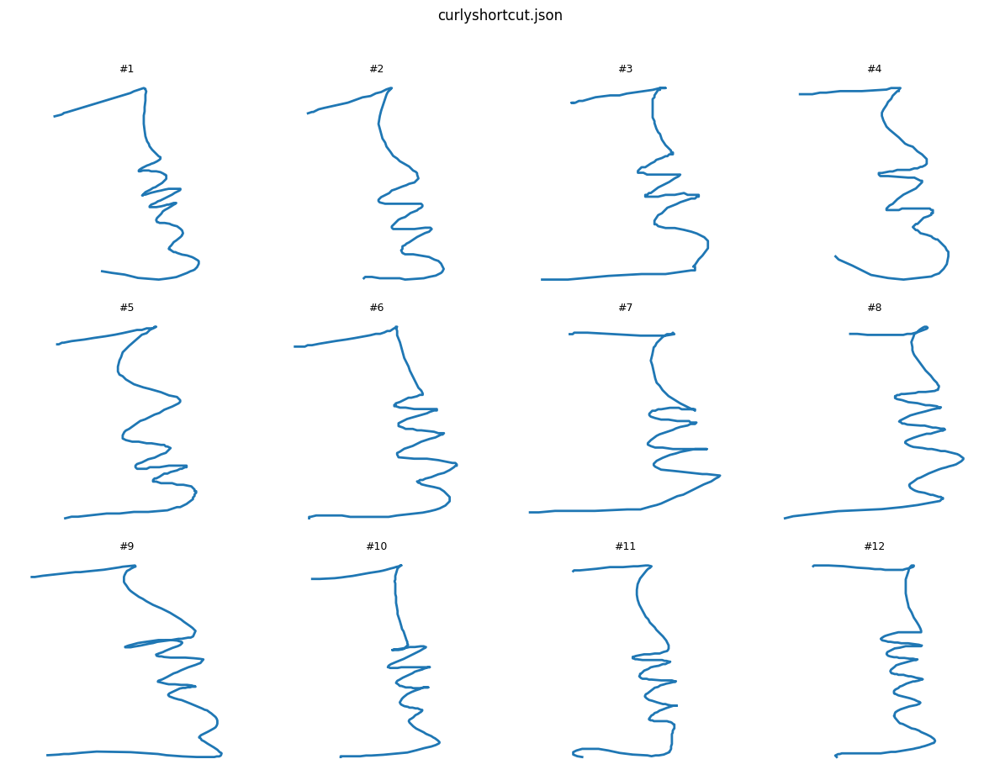


📂 circleshortcut.json → 53 total strokes
🔎 Unique modifier types:
   • circleshortcut: 53 samples


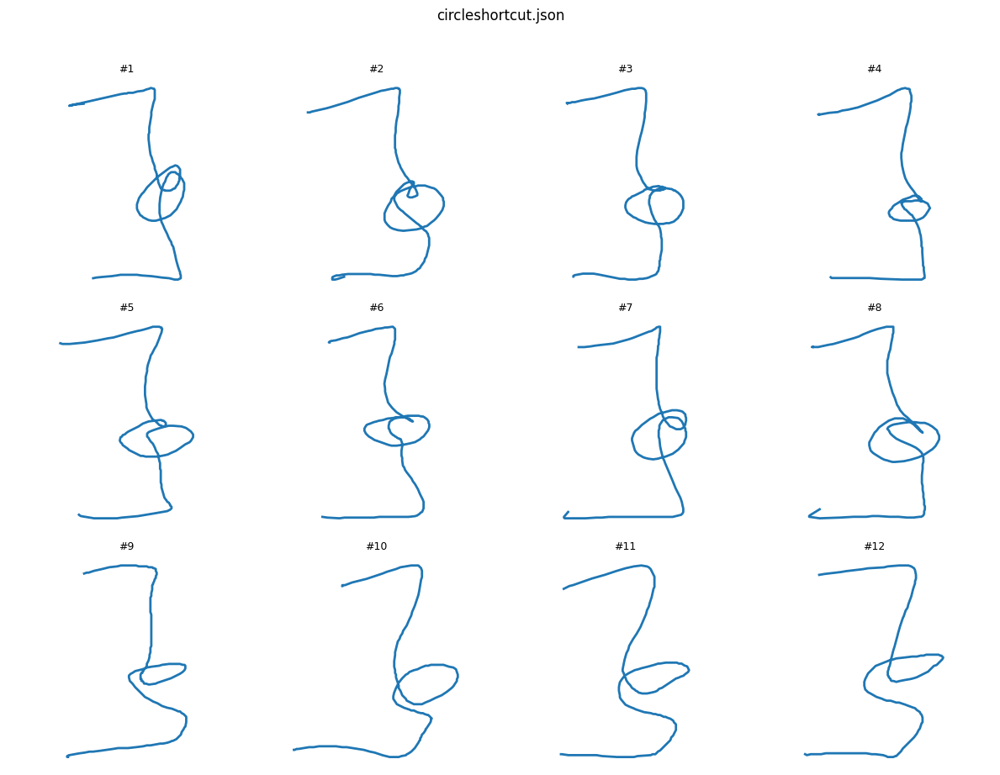


📂 deletehor.json → 53 total strokes
🔎 Unique modifier types:
   • delete: 53 samples


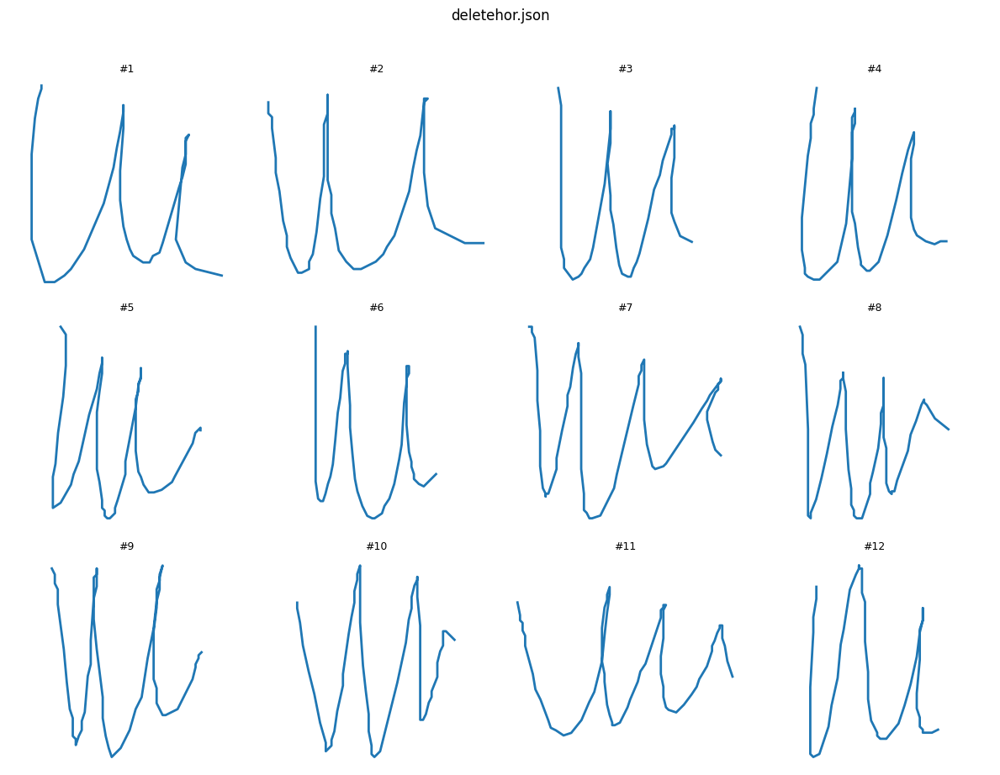


📂 deletevertical.json → 51 total strokes
🔎 Unique modifier types:
   • delete: 51 samples


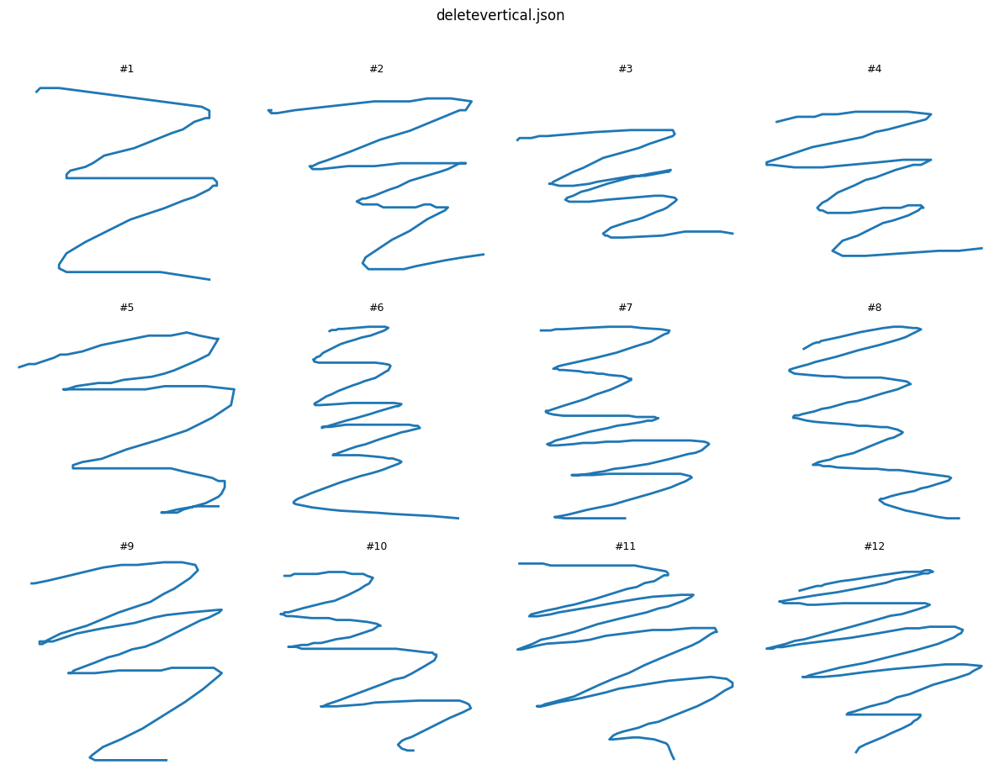


📂 nonedaulon.json → 52 total strokes
🔎 Unique modifier types:
   • nonedaulon: 52 samples


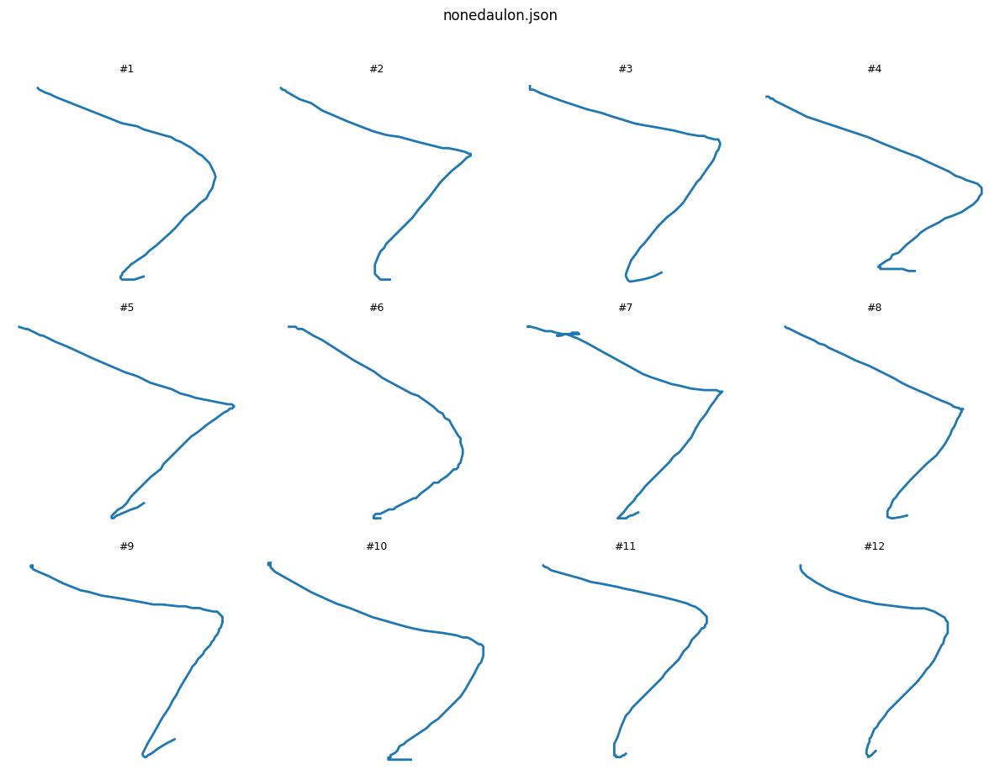


📂 nonedot.json → 50 total strokes
🔎 Unique modifier types:
   • nonedot: 50 samples


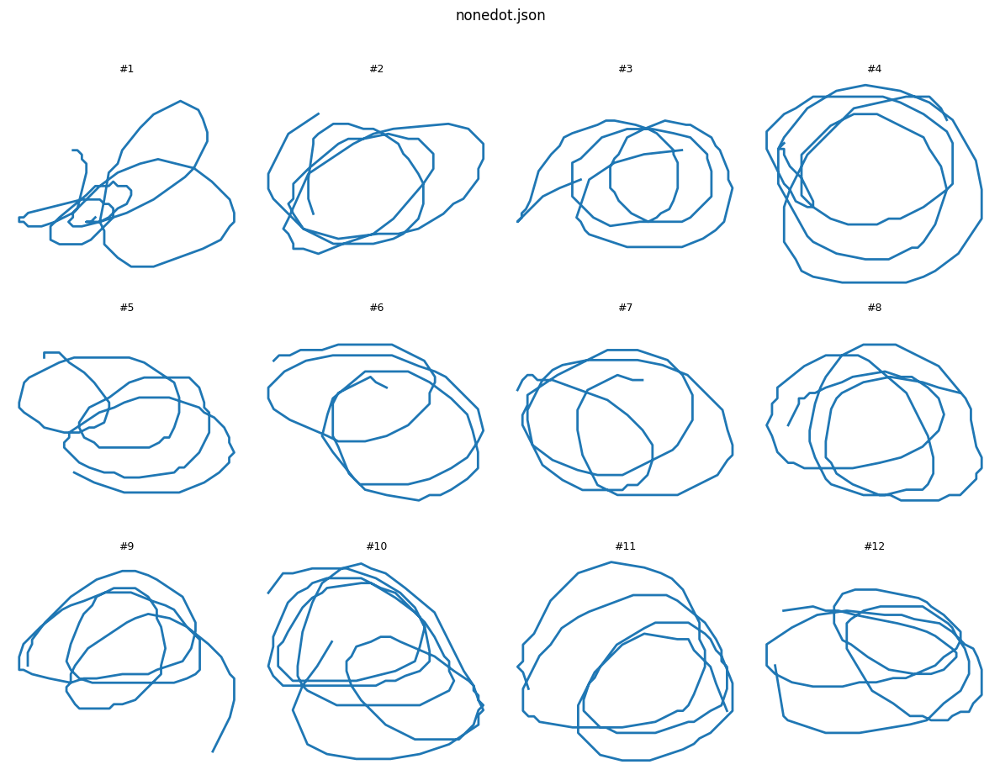


📂 nonenhon.json → 54 total strokes
🔎 Unique modifier types:
   • nonenhon: 54 samples


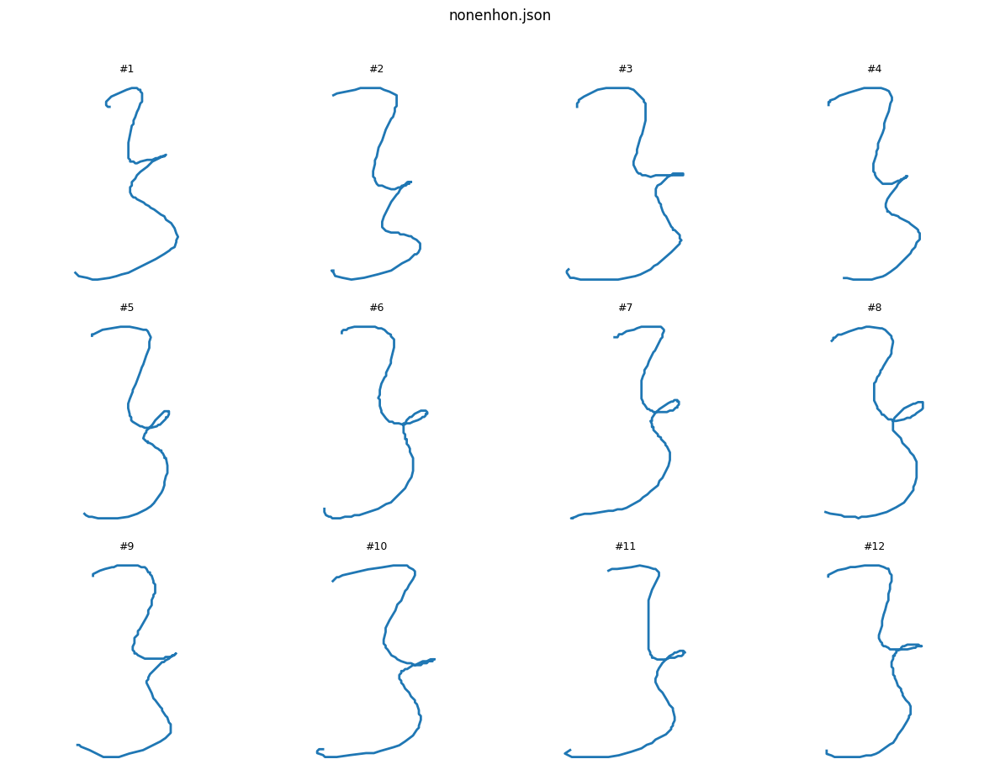

✅ Loaded 55 modifiers from NewData/EshData/underline.json
✅ Loaded 50 modifiers from NewData/EshData/boxcircle.json
✅ Loaded 53 modifiers from NewData/EshData/boxsquare.json
✅ Loaded 51 modifiers from NewData/EshData/boxtt.json
✅ Loaded 50 modifiers from NewData/EshData/curly.json
✅ Loaded 52 modifiers from NewData/EshData/boxshortcut.json
✅ Loaded 76 modifiers from NewData/EshData/curlyshortcut.json
✅ Loaded 53 modifiers from NewData/EshData/circleshortcut.json
✅ Loaded 53 modifiers from NewData/EshData/deletehor.json
✅ Loaded 51 modifiers from NewData/EshData/deletevertical.json
✅ Loaded 52 modifiers from NewData/EshData/nonedaulon.json
✅ Loaded 50 modifiers from NewData/EshData/nonedot.json
✅ Loaded 54 modifiers from NewData/EshData/nonenhon.json
✅ Merged 13 files with 700 total modifiers.


In [99]:
import json
import os
import matplotlib.pyplot as plt

# === Base paths ===
Esh_input_files = [
    "NewData/EshData/underline.json",
    "NewData/EshData/boxcircle.json",
    "NewData/EshData/boxsquare.json",
    "NewData/EshData/boxtt.json",
    "NewData/EshData/curly.json",
    "NewData/EshData/boxshortcut.json",
    "NewData/EshData/curlyshortcut.json",
    "NewData/EshData/circleshortcut.json",
    "NewData/EshData/deletehor.json",
    "NewData/EshData/deletevertical.json",
    "NewData/EshData/nonedaulon.json",
    "NewData/EshData/nonedot.json",
    "NewData/EshData/nonenhon.json",
]


# === Run preview for each file ===
for fpath in Esh_input_files:
    if os.path.exists(fpath):
        preview_first_strokes(fpath, n_samples=12)
    else:
        print(f"⚠️ Missing: {fpath}")

Esh_data = merge_json_files(Esh_input_files)


## Merge the 4 data together

In [100]:
def merge_datasets(*datasets):
    merged_modifiers = []
    total_inputs = len(datasets)

    for i, data in enumerate(datasets, start=1):
        mods = data
        if not isinstance(mods, list):
            print(f"⚠️ Dataset #{i} has malformed 'modifiers' (not a list), skipping.")
            continue

        print(f"✅ Dataset #{i}: merged {len(mods)} modifiers.")
        merged_modifiers.extend(mods)
        
    print(f"\n🎉 Successfully merged {total_inputs} datasets → {len(merged_modifiers)} total modifiers.")
    return merged_modifiers


In [101]:
merged_full = merge_datasets(Quang_data, Linh_data, Sang_data, Esh_data)

✅ Dataset #1: merged 551 modifiers.
✅ Dataset #2: merged 678 modifiers.
✅ Dataset #3: merged 847 modifiers.
✅ Dataset #4: merged 700 modifiers.

🎉 Successfully merged 4 datasets → 2776 total modifiers.


## Overal data review

['box', 'boxshortcut', 'circleshortcut', 'curly', 'curlyshortcut', 'delete', 'nonedaulon', 'nonedot', 'nonenhon', 'underline']
📊 Rendering box: 340 total samples


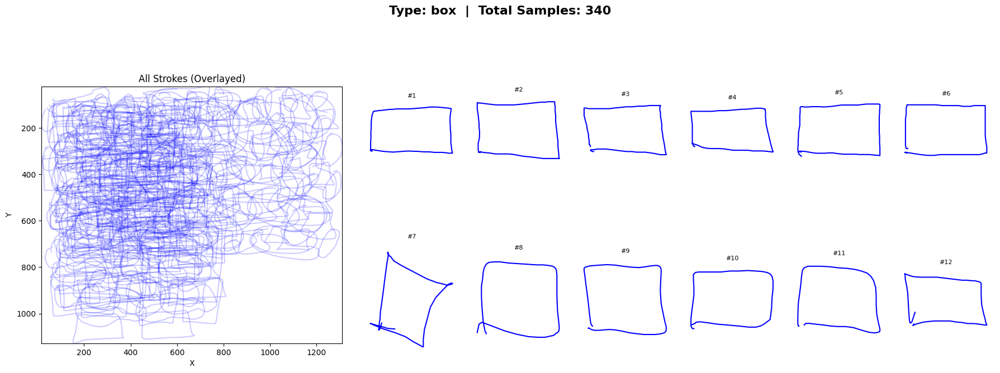

📊 Rendering boxshortcut: 211 total samples


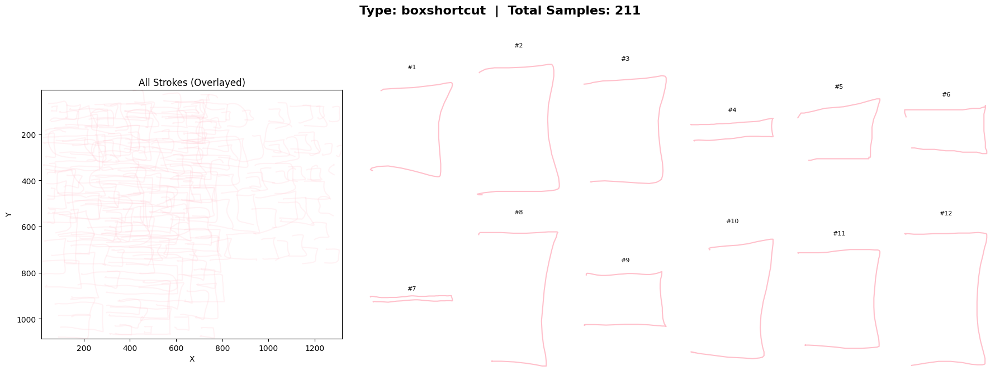

📊 Rendering circleshortcut: 215 total samples


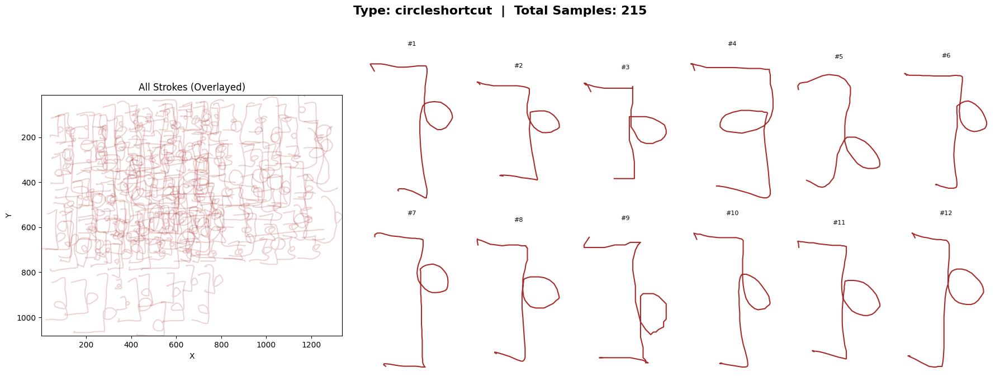

📊 Rendering curly: 178 total samples


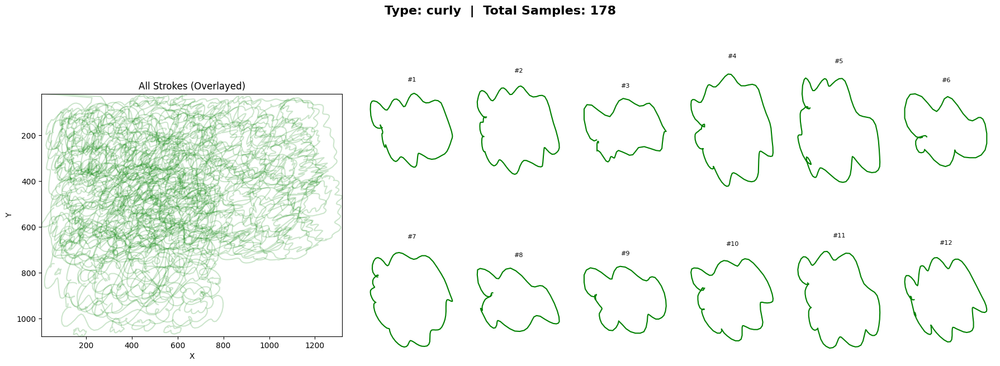

📊 Rendering curlyshortcut: 227 total samples


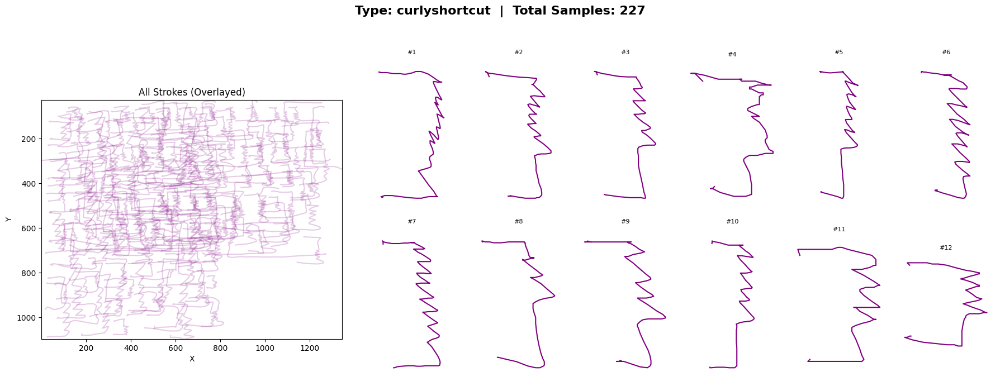

📊 Rendering delete: 405 total samples


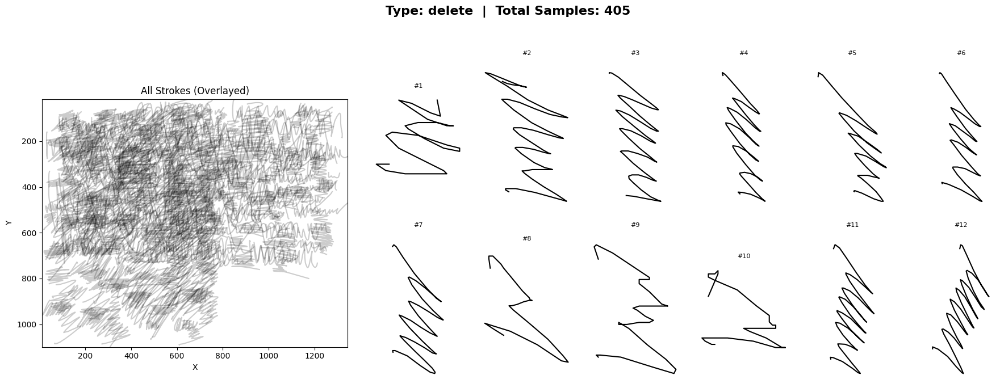

📊 Rendering nonedaulon: 257 total samples


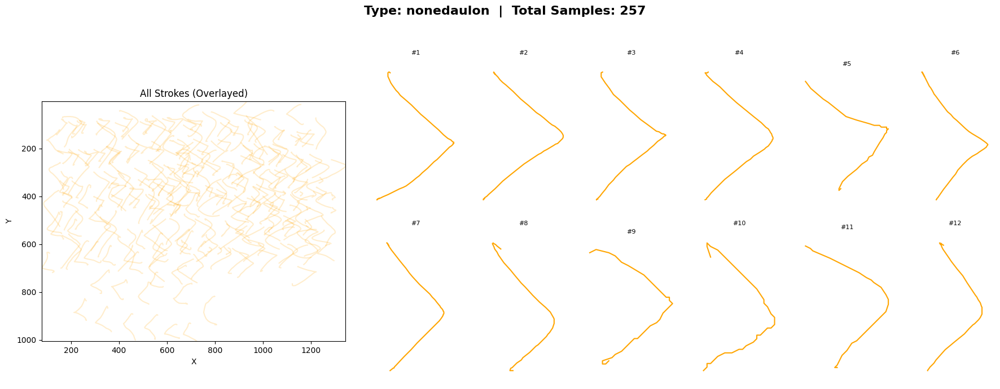

📊 Rendering nonedot: 350 total samples


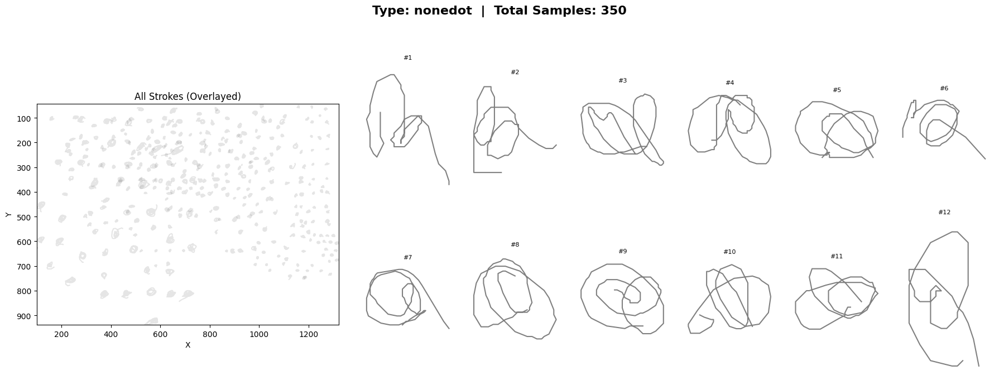

📊 Rendering nonenhon: 262 total samples


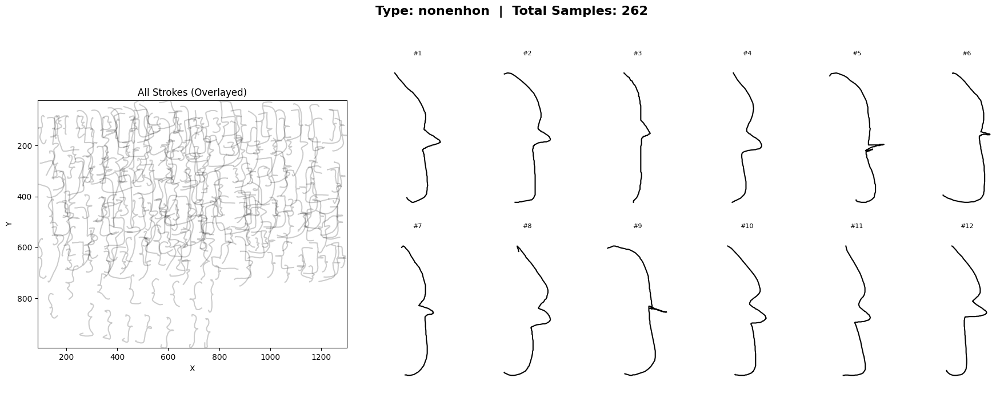

📊 Rendering underline: 331 total samples


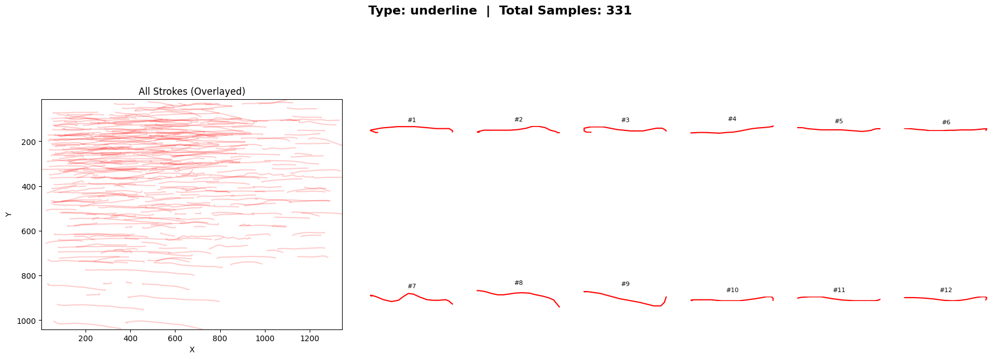

In [102]:
import json
import matplotlib.pyplot as plt

def plot_strokes_summary(merged_data, max_examples=12):
    colors = {
        'box': 'blue',
        'curly': 'green',
        'underline': 'red',
        'delete': 'black',
        'boxshortcut': 'pink',
        'curlyshortcut': 'purple',
        'circleshortcut': 'brown',
        'nonedot': 'gray',
        'nonedaulon': 'orange',
        'nonenhon': 'black'
    }

    # Collect all available modifier types dynamically
    all_types = sorted(set(m['type'] for m in merged_full))
    print(all_types)

    for t in all_types:
        modifiers = [m for m in merged_data if m['type'] == t]
        if not modifiers:
            continue

        print(f"📊 Rendering {t}: {len(modifiers)} total samples")

        # Compute global bounds for overview (left side)
        all_x = [p['x'] for m in modifiers for p in m['stroke']]
        all_y = [p['y'] for m in modifiers for p in m['stroke']]
        x_min, x_max = min(all_x), max(all_x)
        y_min, y_max = min(all_y), max(all_y)

        # Create figure
        fig = plt.figure(figsize=(18, 7))
        fig.suptitle(f"Type: {t}  |  Total Samples: {len(modifiers)}", fontsize=16, fontweight="bold")

        # left: aggregate plot (overlayed)
        ax_overview = plt.subplot2grid((1, 3), (0, 0))
        ax_overview.set_title("All Strokes (Overlayed)", fontsize=12)
        for m in modifiers:
            stroke = m['stroke']
            x = [p['x'] for p in stroke]
            y = [p['y'] for p in stroke]
            ax_overview.plot(x, y, color=colors.get(t, 'black'), alpha=0.2)
        ax_overview.invert_yaxis()
        ax_overview.set_aspect('equal')
        ax_overview.set_xlim(x_min, x_max)
        ax_overview.set_ylim(y_max, y_min)
        ax_overview.set_xlabel("X")
        ax_overview.set_ylabel("Y")

        # right: 2×6 grid of individual samples
        sample_count = min(len(modifiers), max_examples)
        for i in range(sample_count):
            row = i // 6
            col = i % 6
            ax = plt.subplot2grid((2, 9), (row, 3 + col))

            stroke = modifiers[i]['stroke']
            x = [p['x'] for p in stroke]
            y = [p['y'] for p in stroke]
            ax.plot(x, y, color=colors.get(t, 'black'))

            #Compute local zoomed bounds
            margin = 0.1
            x_min_local, x_max_local = min(x), max(x)
            y_min_local, y_max_local = min(y), max(y)
            width = x_max_local - x_min_local
            height = y_max_local - y_min_local
            x_margin = width * margin
            y_margin = height * margin
            ax.set_xlim(x_min_local - x_margin, x_max_local + x_margin)
            ax.set_ylim(y_max_local + y_margin, y_min_local - y_margin)

            ax.invert_yaxis()
            ax.set_aspect('equal')
            ax.set_title(f"#{i+1}", fontsize=8)
            ax.axis("off")

        plt.tight_layout(rect=[0, 0, 1, 0.94])
        plt.show()

plot_strokes_summary(merged_full)


# Augment data

### Augment via random rotattion, sheer and scale

🌀 Augmentation 1/6 | Angle: -4.93°, Shear: (-0.002218500933285933, 0.022203970432778414), Scale: (1.0839582089858284, 0.9308421033046302)


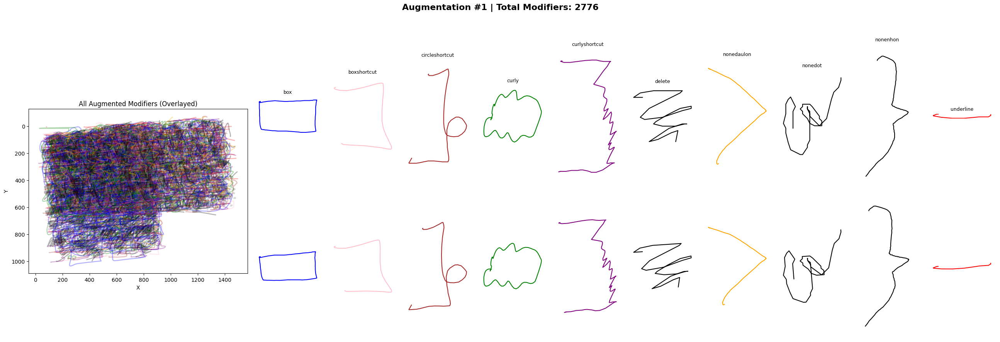

🌀 Augmentation 2/6 | Angle: -4.60°, Shear: (-0.17186159228597117, -0.06846241246584617), Scale: (1.0084655228218502, 1.086963765963127)


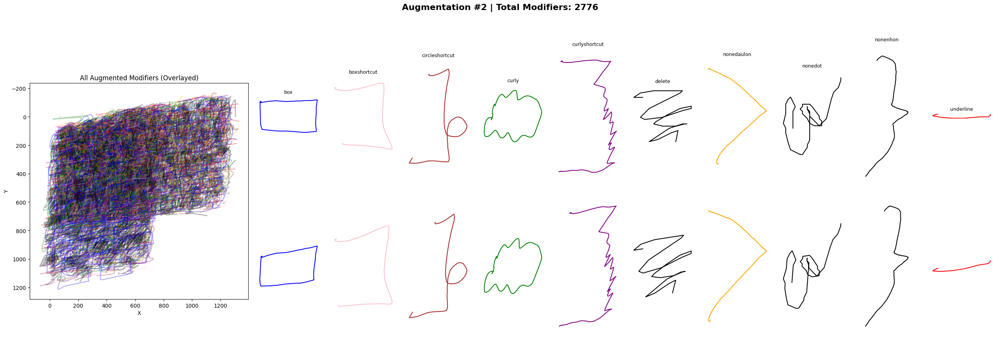

🌀 Augmentation 3/6 | Angle: -4.89°, Shear: (0.19497103521843606, 0.047257008073158135), Scale: (0.9111701927948196, 1.0830921528404103)


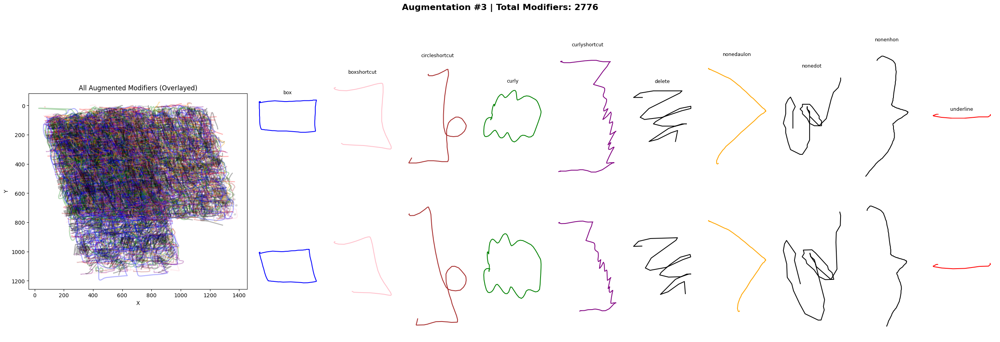

🌀 Augmentation 4/6 | Angle: 0.82°, Shear: (-0.19672288344448027, 0.0899563346037354), Scale: (1.0480370286895269, 0.9494562515246071)


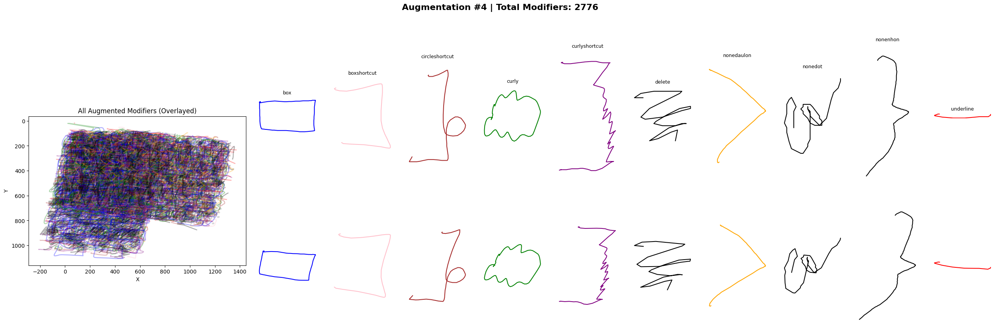

🌀 Augmentation 5/6 | Angle: -2.60°, Shear: (0.03074516614029635, 0.013782737694422467), Scale: (1.0487910434344072, 1.047413501544181)


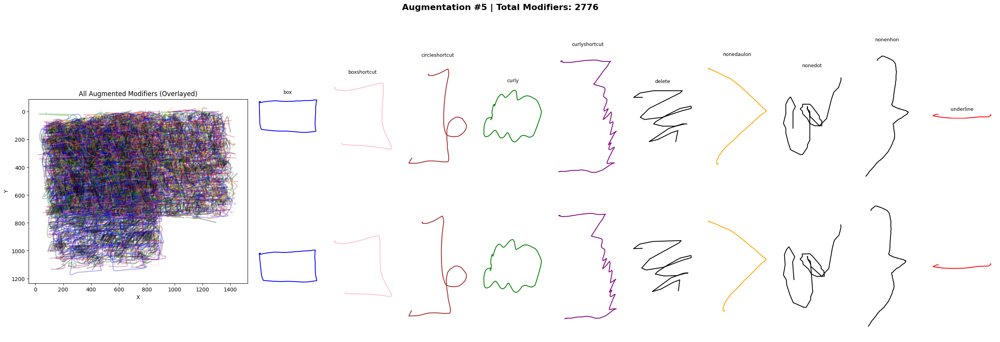

🌀 Augmentation 6/6 | Angle: 2.66°, Shear: (-0.12148668187476264, -0.06555088526858785), Scale: (1.062903065396363, 0.9853786546457058)


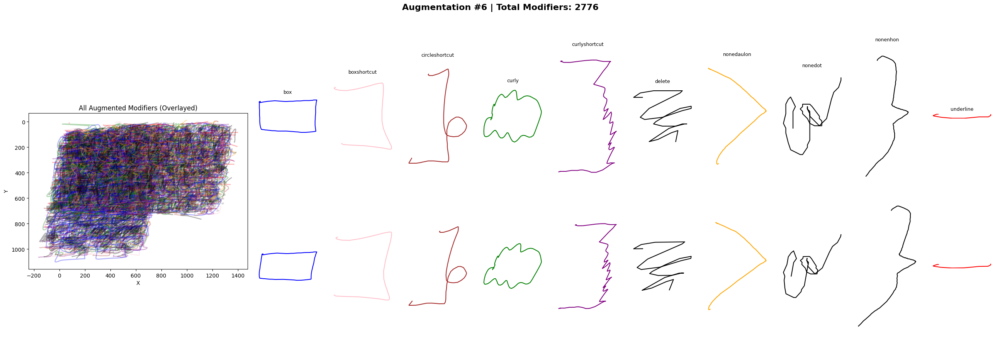


✅ Augmentation complete: 6 groups generated.
Number of augmented groups: 6


In [109]:
import json
import random
import matplotlib.pyplot as plt
import numpy as np


def augment_stroke(stroke, angle, shear, scale):
    """
    Apply shear (x & y), anisotropic scale, and rotation to a single stroke.
    - stroke: list of {"x", "y", "p"?}
    - angle: degrees
    - shear: (shear_x, shear_y)
    - scale: (scale_x, scale_y)
    """
    if not stroke or not isinstance(stroke, list):
        return []

    shear_x, shear_y = shear
    scale_x, scale_y = scale

    rad = np.radians(angle)
    cos_a, sin_a = np.cos(rad), np.sin(rad)

    transformed = []
    for pt in stroke:
        x = pt["x"]
        y = pt["y"]

        # --- Shear ---
        x_sheared = x + shear_x * y
        y_sheared = y + shear_y * x

        # --- Scale ---
        x_scaled = x_sheared * scale_x
        y_scaled = y_sheared * scale_y

        # --- Rotate ---
        x_new = cos_a * x_scaled - sin_a * y_scaled
        y_new = sin_a * x_scaled + cos_a * y_scaled

        transformed.append({
            "x": x_new,
            "y": y_new,
            "p": pt.get("p", 0)
        })

    return transformed


def augment_data(merged_data, augment_count=4):
    """
    merged_data can be:
      - a dict: {"modifiers": [...]}
      - or a plain list: [...]
    Returns list of augmented groups; each group is list of modifiers.
    """
    # Normalize structure
    if isinstance(merged_data, dict):
        original_modifiers = merged_data.get("modifiers", [])
    else:
        original_modifiers = merged_data

    all_augmented_groups = []

    for i in range(augment_count):
        angle = random.uniform(-6, 6)
        shear = (random.uniform(-0.2, 0.2), random.uniform(-0.1, 0.1))
        scale = (random.uniform(0.9, 1.1), random.uniform(0.9, 1.1))

        augmented_modifiers = []
        for mod in original_modifiers:
            stroke = mod.get("stroke", [])
            new_stroke = augment_stroke(stroke, angle, shear, scale)

            augmented_modifiers.append({
                "type": mod.get("type", "none"),
                "stroke": new_stroke
            })

        print(
            f"🌀 Augmentation {i+1}/{augment_count} | "
            f"Angle: {angle:.2f}°, Shear: {shear}, Scale: {scale}"
        )

        plot_augmented_batch(original_modifiers, augmented_modifiers, batch_idx=i+1)
        all_augmented_groups.append(augmented_modifiers)

    print(f"\n✅ Augmentation complete: {len(all_augmented_groups)} groups generated.")
    return all_augmented_groups

def plot_augmented_batch(original_modifiers, augmented_modifiers, batch_idx=1):
    colors = {
        'box': 'blue',
        'curly': 'green',
        'underline': 'red',
        'delete': 'black',
        'boxshortcut': 'pink',
        'curlyshortcut': 'purple',
        'circleshortcut': 'brown',
        'nonedaucham': '#808080',
        'nonedaulon': '#FFA500',
        'nonedaunhon': '#4682B4'   # steel blue
    }

    # All types present in this augmented batch
    all_types = sorted(set(m.get('type', 'none') for m in augmented_modifiers))
    num_types = min(len(all_types), 10)  # show up to 10
    total_cols = 3 + num_types  # left 1/3 + right grid columns

    fig = plt.figure(figsize=(26, 9))
    fig.suptitle(
        f"Augmentation #{batch_idx} | Total Modifiers: {len(augmented_modifiers)}",
        fontsize=16, fontweight="bold"
    )

    # ==== LEFT: Overview of all augmented strokes ====
    ax_overview = plt.subplot2grid((1, total_cols), (0, 0), colspan=3)
    ax_overview.set_title("All Augmented Modifiers (Overlayed)", fontsize=12)

    for m in augmented_modifiers:
        stroke = m.get("stroke", [])
        if not stroke:
            continue
        x = [p["x"] for p in stroke]
        y = [p["y"] for p in stroke]
        if len(x) == 0:
            continue
        ax_overview.plot(
            x, y,
            color=colors.get(m.get("type", "none"), 'gray'),
            alpha=0.3,
            linewidth=1.8
        )

    ax_overview.invert_yaxis()
    ax_overview.set_aspect('equal')
    ax_overview.set_xlabel("X")
    ax_overview.set_ylabel("Y")

    # ==== RIGHT: Grid (Original vs Augmented) ====
    sample_types = all_types[:num_types]
    margin = 0.1

    for col, t in enumerate(sample_types):
        orig = next((m for m in original_modifiers if m.get('type') == t), None)
        aug = next((m for m in augmented_modifiers if m.get('type') == t), None)
        if not orig or not aug:
            continue

        # --- Top: Original ---
        ax_orig = plt.subplot2grid((2, total_cols), (0, 3 + col))
        stroke = orig.get("stroke", [])
        if stroke:
            x = [p["x"] for p in stroke]
            y = [p["y"] for p in stroke]
            if x and y:
                ax_orig.plot(x, y, color=colors.get(t, 'black'))
                ax_orig.invert_yaxis()
                ax_orig.set_aspect('equal')
                x_min, x_max, y_min, y_max = min(x), max(x), min(y), max(y)
                x_margin, y_margin = (x_max - x_min) * margin, (y_max - y_min) * margin
                ax_orig.set_xlim(x_min - x_margin, x_max + x_margin)
                ax_orig.set_ylim(y_max + y_margin, y_min - y_margin)
        ax_orig.set_title(t, fontsize=9)
        ax_orig.axis("off")

        # --- Bottom: Augmented ---
        ax_aug = plt.subplot2grid((2, total_cols), (1, 3 + col))
        stroke_aug = aug.get("stroke", [])
        if stroke_aug:
            x_aug = [p["x"] for p in stroke_aug]
            y_aug = [p["y"] for p in stroke_aug]
            if x_aug and y_aug:
                ax_aug.plot(x_aug, y_aug, color=colors.get(t, 'black'))
                ax_aug.invert_yaxis()
                ax_aug.set_aspect('equal')
                x_min, x_max, y_min, y_max = min(x_aug), max(x_aug), min(y_aug), max(y_aug)
                x_margin, y_margin = (x_max - x_min) * margin, (y_max - y_min) * margin
                ax_aug.set_xlim(x_min - x_margin, x_max + x_margin)
                ax_aug.set_ylim(y_max + y_margin, y_min - y_margin)
        ax_aug.axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.94])
    plt.show()



# === Example call ===
# merged_full can be either:
#   merged_full = {"modifiers": [...]}
# or:
#   merged_full = [...]  # list of modifier dicts
augmented_groups = augment_data(merged_full, augment_count=6)
print("Number of augmented groups:", len(augmented_groups))


## Flip augmentation

In [110]:
def flip_stroke_horizontally(stroke):
    if not stroke:
        return []
    xs = [pt["x"] for pt in stroke]
    center_x = (max(xs) + min(xs)) / 2
    return [
        {"x": 2 * center_x - pt["x"], "y": pt["y"], "p": pt.get("p", 0)}
        for pt in stroke
    ]


def flip_augmented_groups(augmented_groups, exclude_types=None):
    if exclude_types is None:
        exclude_types = []

    merged_augmented_and_flipped = []

    for g_idx, group in enumerate(augmented_groups):
        flipped_group = []
        for mod in group:
            t = mod["type"]
            if t in exclude_types:
                # keep same if excluded
                flipped_group.append({
                    "type": t,
                    "stroke": mod["stroke"]  # unchanged
                })
            else:
                flipped_group.append({
                    "type": t,
                    "stroke": flip_stroke_horizontally(mod["stroke"])
                })

        merged_group = group + flipped_group
        merged_augmented_and_flipped.append(merged_group)
        print(f"🔁 Group {g_idx+1}: {len(flipped_group)} flipped strokes (excluded: {exclude_types})")

    print(f"\n✅ Flip augmentation complete: {len(merged_augmented_and_flipped)} total groups.")
    return merged_augmented_and_flipped

exclude_list = []

merged_augmented_and_flipped = flip_augmented_groups(
    augmented_groups,
    exclude_types=exclude_list,
)


🔁 Group 1: 2776 flipped strokes (excluded: [])
🔁 Group 2: 2776 flipped strokes (excluded: [])
🔁 Group 3: 2776 flipped strokes (excluded: [])
🔁 Group 4: 2776 flipped strokes (excluded: [])
🔁 Group 5: 2776 flipped strokes (excluded: [])
🔁 Group 6: 2776 flipped strokes (excluded: [])

✅ Flip augmentation complete: 6 total groups.


In [111]:
full_modifiers = merged_full.copy()
for group in merged_augmented_and_flipped:
    full_modifiers.extend(group)


In [112]:
#By chatgpt
def summarize_modifiers_flat(modifiers):
    type_counts = {}
    for mod in modifiers:
        t = mod.get("type", "unknown")
        type_counts[t] = type_counts.get(t, 0) + 1

    total_modifiers = sum(type_counts.values())
    print("\n📊 ===== FINAL AUGMENTATION SUMMARY =====")
    for t, count in sorted(type_counts.items()):
        print(f"• {t:<15} → {count:>6} strokes")
    print("──────────────────────────────────────────")
    print(f"🧮 TOTAL STROKES: {total_modifiers:,}")
    print("==========================================\n")

    return {
        "counts_by_type": type_counts,
        "total_strokes": total_modifiers
    }

# ✅ call this version:
report = summarize_modifiers_flat(full_modifiers)



📊 ===== FINAL AUGMENTATION SUMMARY =====
• box             →   4420 strokes
• boxshortcut     →   2743 strokes
• circleshortcut  →   2795 strokes
• curly           →   2314 strokes
• curlyshortcut   →   2951 strokes
• delete          →   5265 strokes
• nonedaulon      →   3341 strokes
• nonedot         →   4550 strokes
• nonenhon        →   3406 strokes
• underline       →   4303 strokes
──────────────────────────────────────────
🧮 TOTAL STROKES: 36,088



# Normalized data

## Normalize

In [113]:
import matplotlib.pyplot as plt

def get_bounding_box(stroke):
    xs = [pt["x"] for pt in stroke]
    ys = [pt["y"] for pt in stroke]
    return min(xs), max(xs), min(ys), max(ys)

def smooth_stroke(stroke, window_size=5):
    if len(stroke) < window_size:
        return stroke

    smoothed = []
    half_window = window_size // 2

    for i in range(len(stroke)):
        sum_x = sum_y = sum_p = 0
        count = 0

        for j in range(-half_window, half_window + 1):
            idx = i + j
            if 0 <= idx < len(stroke):
                pt = stroke[idx]
                sum_x += pt["x"]
                sum_y += pt["y"]
                sum_p += pt.get("p", 0)
                count += 1

        smoothed.append({
            "x": sum_x / count,
            "y": sum_y / count,
            "p": sum_p / count
        })

    return smoothed
    
def normalize_stroke(stroke, min_x, max_x, min_y, max_y):
    w = max_x - min_x
    h = max_y - min_y

    return [
        {
            "x": (pt["x"] - min_x) / w if w > 0 else 0.0,
            "y": (pt["y"] - min_y) / h if h > 0 else 0.0,
            "p": pt.get("p", 0)
        }
        for pt in stroke
    ]

def smooth_and_normalize(stroke, window_size=5):
    if not stroke:
        return []

    smoothed = smooth_stroke(stroke, window_size)
    min_x, max_x, min_y, max_y = get_bounding_box(smoothed)
    return normalize_stroke(smoothed, min_x, max_x, min_y, max_y)


# === Normalize Full Dataset ===
def normalize_full_dataset(merged_data, smooth=False, window_size=5):
    normalized_modifiers = []

    for i, mod in enumerate(merged_data):
        stroke = mod.get("stroke", [])
        if not stroke:
            continue

        # Smooth + normalize or direct normalize
        if smooth:
            normalized_stroke = smooth_and_normalize(stroke, window_size)
        else:
            min_x, max_x, min_y, max_y = get_bounding_box(stroke)
            normalized_stroke = normalize_stroke(stroke, min_x, max_x, min_y, max_y)

        normalized_mod = dict(mod)
        normalized_mod["stroke"] = normalized_stroke
        normalized_modifiers.append(normalized_mod)

    print(f"\n✅ Normalized {len(normalized_modifiers)} modifiers (smooth={smooth})")
    return normalized_modifiers

normalized_data = normalize_full_dataset(full_modifiers, smooth=False, window_size=7)



✅ Normalized 36088 modifiers (smooth=False)


## Visualize normalized stroke

📊 Rendering box: 4420 samples


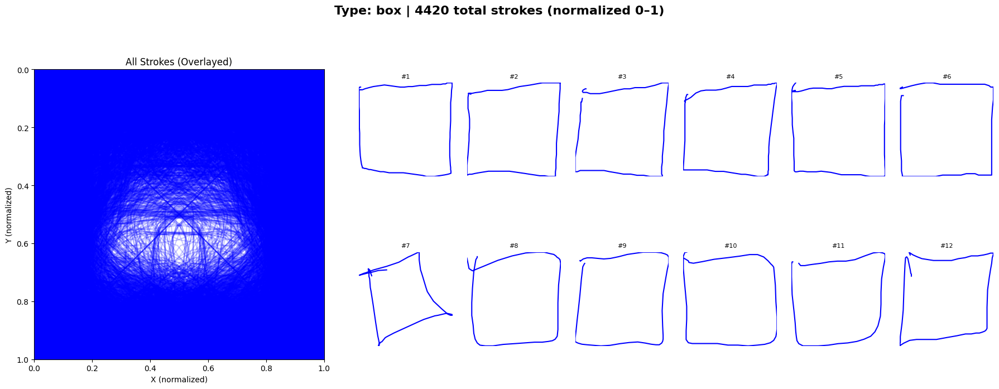

📊 Rendering boxshortcut: 2743 samples


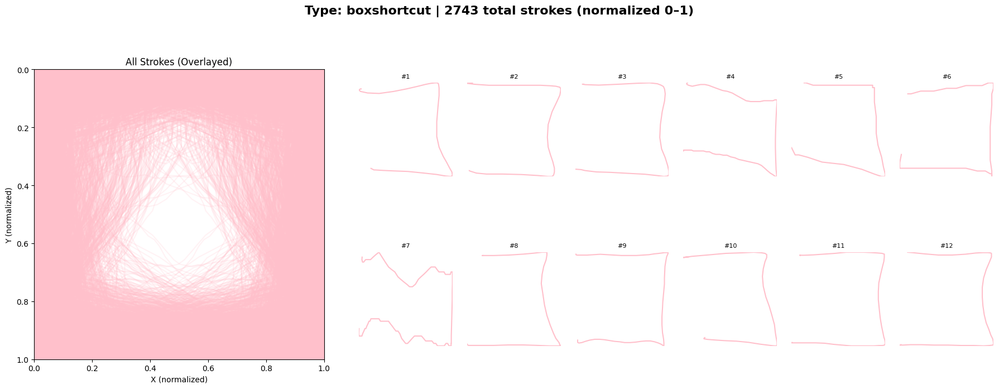

📊 Rendering circleshortcut: 2795 samples


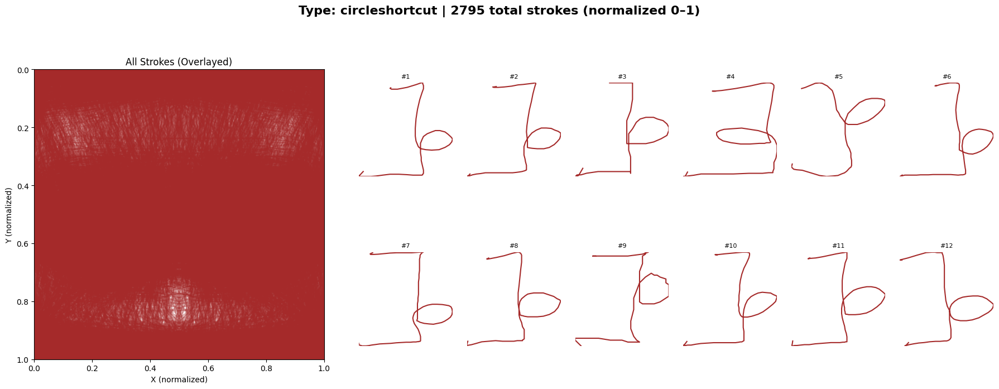

📊 Rendering curly: 2314 samples


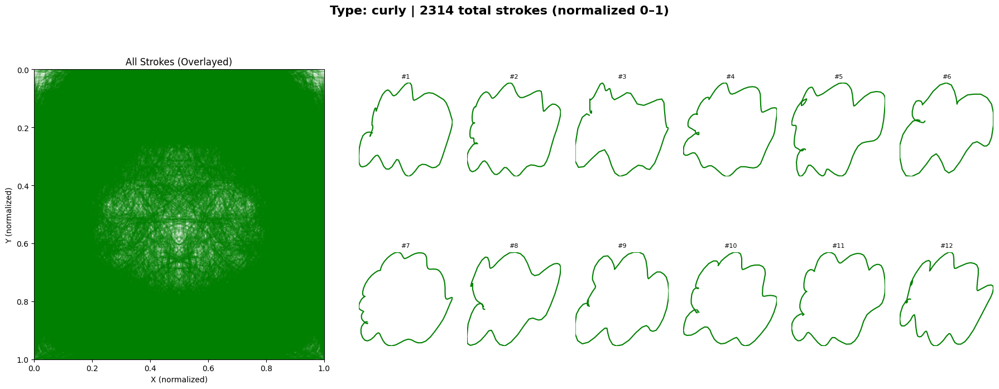

📊 Rendering curlyshortcut: 2951 samples


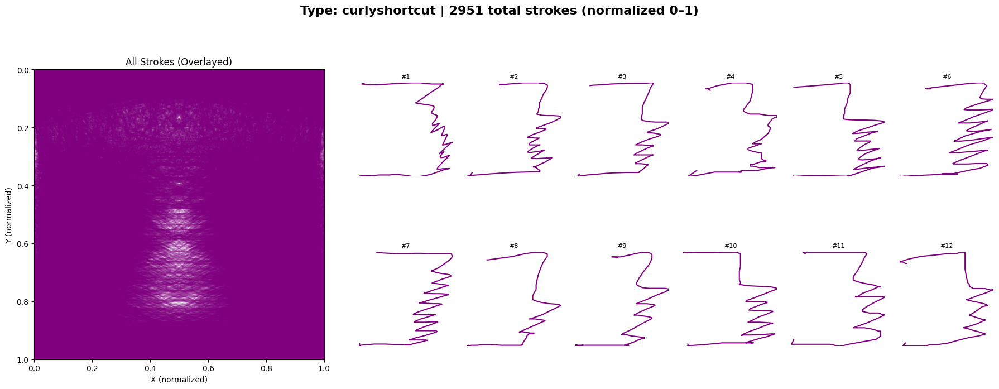

📊 Rendering delete: 5265 samples


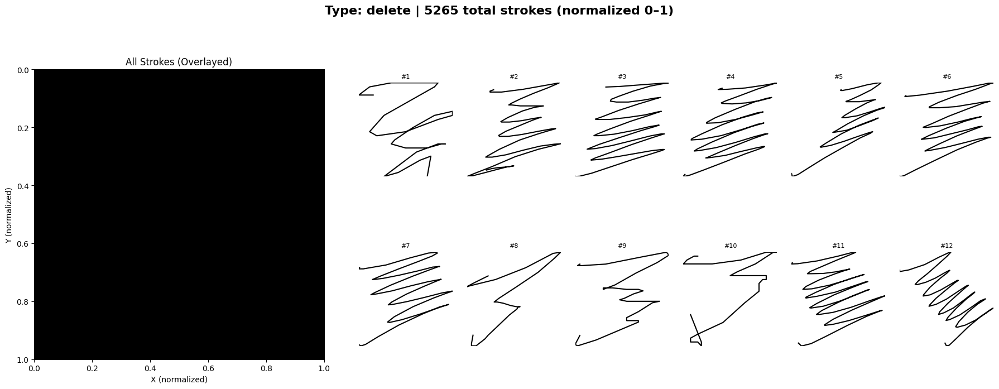

📊 Rendering nonedaulon: 3341 samples


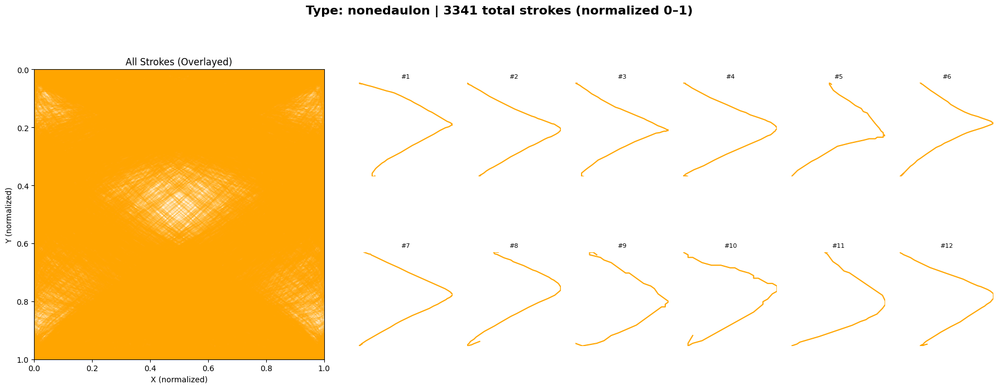

📊 Rendering nonedot: 4550 samples


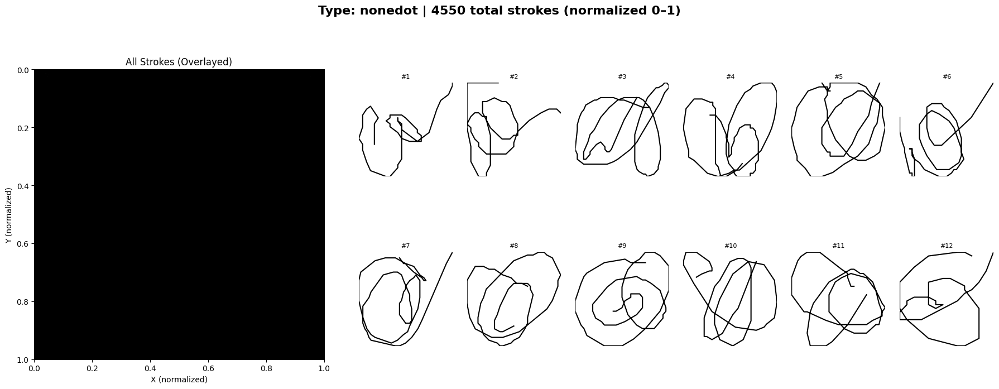

📊 Rendering nonenhon: 3406 samples


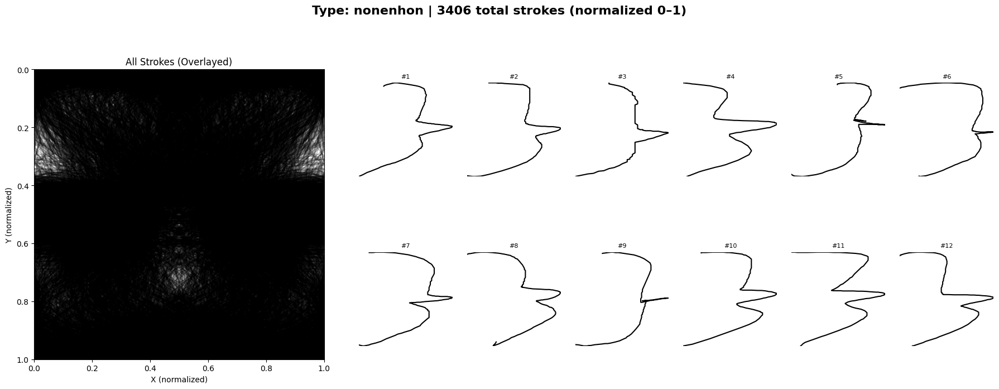

📊 Rendering underline: 4303 samples


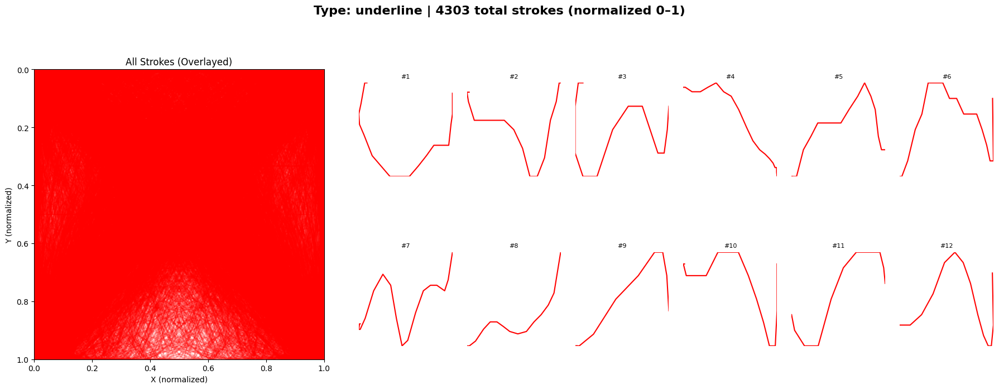

In [114]:
import matplotlib.pyplot as plt

def plot_normalized_summary(normalized_data, max_examples=12):
    colors = {
        'box': 'blue',
        'curly': 'green',
        'underline': 'red',
        'delete': 'black',
        'boxshortcut': 'pink',
        'curlyshortcut': 'purple',
        'circleshortcut': 'brown',
        'nonedaucham': '#808080',
        'nonedaulon': '#FFA500',
        'nonedaunhon': '#4682B4'   # steel blue
    }

    modifiers = normalized_data
    if not modifiers:
        print("⚠️ No modifiers found to plot.")
        return

    all_types = sorted(set(m["type"] for m in modifiers))

    for t in all_types:
        type_mods = [m for m in modifiers if m["type"] == t]
        if not type_mods:
            continue

        print(f"📊 Rendering {t}: {len(type_mods)} samples")

        fig = plt.figure(figsize=(18, 7))
        fig.suptitle(f"Type: {t} | {len(type_mods)} total strokes (normalized 0–1)", 
                     fontsize=16, fontweight="bold")

        # ==== Left (1/3): Overlay of all normalized strokes ====
        ax_all = plt.subplot2grid((1, 3), (0, 0))
        ax_all.set_title("All Strokes (Overlayed)", fontsize=12)
        for m in type_mods:
            stroke = m["stroke"]
            x = [p["x"] for p in stroke]
            y = [p["y"] for p in stroke]
            ax_all.plot(x, y, color=colors.get(t, "black"), alpha=0.2)
        ax_all.invert_yaxis()
        ax_all.set_xlim(0, 1)
        ax_all.set_ylim(1, 0)
        ax_all.set_aspect("equal")
        ax_all.set_xlabel("X (normalized)")
        ax_all.set_ylabel("Y (normalized)")

        #Right (2/3): 12 sample strokes (2×6 grid)
        sample_count = min(len(type_mods), max_examples)
        for i in range(sample_count):
            row = i // 6
            col = i % 6
            ax = plt.subplot2grid((2, 9), (row, 3 + col))
            stroke = type_mods[i]["stroke"]
            x = [p["x"] for p in stroke]
            y = [p["y"] for p in stroke]
            ax.plot(x, y, color=colors.get(t, "black"))
            ax.invert_yaxis()
            ax.set_xlim(0, 1)
            ax.set_ylim(1, 0)
            ax.set_aspect("equal")
            ax.set_title(f"#{i+1}", fontsize=8)
            ax.axis("off")

        plt.tight_layout(rect=[0, 0, 1, 0.94])
        plt.show()

plot_normalized_summary(normalized_data)


# Training

### Render stroke to image

In [156]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

def render_stroke_to_image(stroke, img_size=164, line_width=3):
    """
    Render a normalized stroke (0–1 coordinates) into a grayscale image.
    Adds margin equal to line_width so lines never touch borders.
    """
    if not stroke:
        return np.ones((img_size, img_size), dtype=np.uint8) * 255

    margin = line_width  # margin equals the line width
    draw_size = img_size - 2 * margin  # effective drawing area

    img = Image.new('L', (img_size, img_size), color=255)
    draw = ImageDraw.Draw(img)

    # Extract normalized coordinates (clamped to [0, 1])
    xs = np.clip([pt["x"] for pt in stroke], 0, 1)
    ys = np.clip([pt["y"] for pt in stroke], 0, 1)

    # Scale coordinates to [margin, img_size - margin]
    scaled_xs = [margin + x * draw_size for x in xs]
    scaled_ys = [margin + y * draw_size for y in ys]

    # Draw stroke
    points = list(zip(scaled_xs, scaled_ys))
    draw.line(points, fill=0, width=line_width)

    return np.array(img)


### Test render function

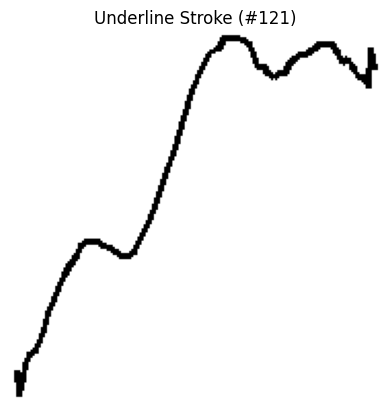

In [157]:
target_type = "underline"     # e.g. 'curly', 'delete', etc.
target_index = 121      # sample index to visualize

selected_stroke = None
count = 0

for item in normalized_data:
    if item.get("type") == target_type:
        count += 1
        if count > target_index:
            selected_stroke = item["stroke"]
            break

if selected_stroke is not None:
    img = render_stroke_to_image(selected_stroke, img_size=180, line_width=3)
    plt.imshow(img, cmap="gray")
    plt.axis("off")
    plt.title(f"{target_type.capitalize()} Stroke (#{target_index})")
    plt.show()
else:
    print(f"No '{target_type}' stroke found at index {target_index}.")

### Create dataset

In [120]:
#old
import numpy as np

def compute_fast_stroke_features(raw_stroke, norm_stroke, height_threshold=45, cap_value=100):
    if len(raw_stroke) < 2 or len(norm_stroke) < 2:
        return np.zeros(12, dtype=np.float32)

    pts_raw = np.array([[p['x'], p['y']] for p in raw_stroke])
    x, y = pts_raw[:, 0], pts_raw[:, 1]

    # --- Basic geometry ---
    x_min, x_max, y_min, y_max = x.min(), x.max(), y.min(), y.max()
    w, h = x_max - x_min, y_max - y_min
    w, h = max(w, 1e-6), max(h, 1e-6)
    bbox_area = w * h
    diag = np.sqrt(w**2 + h**2)

    # --- Derived features ---
    aspect_ratio = w / h
    elongation = max(w, h) / (min(w, h) + 1e-6)
    direction_bias = abs(w - h) / (w + h + 1e-6)
    height_diff_45 = np.clip((h - height_threshold) / cap_value, -1.0, 1.0)
    perim_diag_ratio = (2 * (w + h)) / (diag + 1e-6)

    # --- Stroke dynamics ---
    deltas = np.diff(pts_raw, axis=0)
    seg_len = np.linalg.norm(deltas, axis=1)
    total_len = np.sum(seg_len)
    avg_speed = total_len / len(pts_raw)
    compactness = total_len / (diag + 1e-6)

    # --- Point distribution ---
    density = len(pts_raw) / (bbox_area + 1e-6)
    log_density = np.log1p(density)
    vert_var, horiz_var = np.std(y), np.std(x)

    # --- Edge fraction (normalized) ---
    pts_n = np.array([[p['x'], p['y']] for p in norm_stroke])
    x_n, y_n = pts_n[:, 0], pts_n[:, 1]
    edge_thresh = 0.1 * max(x_n.max() - x_n.min(), y_n.max() - y_n.min())
    d_edge = np.minimum.reduce([
        x_n - x_n.min(), x_n.max() - x_n, y_n - y_n.min(), y_n.max() - y_n
    ])
    edge_frac = np.mean(d_edge < edge_thresh)

    return np.array([
        aspect_ratio, elongation, direction_bias, height_diff_45,
        perim_diag_ratio, compactness, avg_speed, log_density,
        edge_frac, vert_var, horiz_var, total_len
    ], dtype=np.float32)


In [147]:
import numpy as np

def compute_fast_stroke_features(raw_stroke, norm_stroke, height_threshold=45, cap_value=100):
    if len(raw_stroke) < 2 or len(norm_stroke) < 2:
        return np.zeros(15, dtype=np.float32)

    pts_raw = np.array([[p['x'], p['y']] for p in raw_stroke])
    x, y = pts_raw[:, 0], pts_raw[:, 1]

    # --- Basic geometry ---
    x_min, x_max, y_min, y_max = x.min(), x.max(), y.min(), y.max()
    w, h = x_max - x_min, y_max - y_min
    w, h = max(w, 1e-6), max(h, 1e-6)
    bbox_area = w * h
    diag = np.sqrt(w**2 + h**2)

    # --- Derived features ---
    aspect_ratio = w / h
    elongation = max(w, h) / (min(w, h) + 1e-6)
    direction_bias = abs(w - h) / (w + h + 1e-6)
    height_diff_45 = np.clip((h - height_threshold) / cap_value, -1.0, 1.0)
    perim_diag_ratio = (2 * (w + h)) / (diag + 1e-6)

    # --- Stroke dynamics ---
    deltas = np.diff(pts_raw, axis=0)
    seg_len = np.linalg.norm(deltas, axis=1)
    total_len = np.sum(seg_len)
    avg_speed = total_len / len(pts_raw)
    compactness = total_len / (diag + 1e-6)

    # --- Point distribution ---
    density = len(pts_raw) / (bbox_area + 1e-6)
    log_density = np.log1p(density)
    vert_var, horiz_var = np.std(y), np.std(x)

    # --- Edge fraction (normalized) ---
    pts_n = np.array([[p['x'], p['y']] for p in norm_stroke])
    x_n, y_n = pts_n[:, 0], pts_n[:, 1]
    edge_thresh = 0.1 * max(x_n.max() - x_n.min(), y_n.max() - y_n.min())
    d_edge = np.minimum.reduce([
        x_n - x_n.min(), x_n.max() - x_n, y_n - y_n.min(), y_n.max() - y_n
    ])
    edge_frac = np.mean(d_edge < edge_thresh)

    # -------------------------------------------------------------------------
    # === New Advanced Geometry Features ===
    # -------------------------------------------------------------------------

    # 1️⃣ Rectilinearity: measures how many near-straight or right-angle turns exist
    rectilinearity = 0.0
    if len(deltas) > 1:
        angles = np.arctan2(deltas[:, 1], deltas[:, 0])
        angle_diffs = np.abs(np.diff(angles))
        angle_diffs = np.minimum(angle_diffs, np.pi - angle_diffs)  # wrap-around
        rect_count = np.sum((angle_diffs < 0.2) | (np.abs(angle_diffs - np.pi / 2) < 0.2))
        rectilinearity = rect_count / len(angle_diffs)

    # 2️⃣ Spine verticality: how close stroke direction is to vertical
    dx, dy = x[-1] - x[0], y[-1] - y[0]
    angle = abs(np.arctan2(dy, dx))
    spine_verticality = 1 - abs(angle - np.pi / 2) / (np.pi / 2)

    # 3️⃣ Circularity mid: local curvature bump detection (detects small mid-stroke loops)
    circularity_mid = 0.0
    if len(deltas) > 3:
        seg_angles = np.arctan2(deltas[:, 1], deltas[:, 0])
        curv = np.abs(np.diff(seg_angles))
        mid_start, mid_end = len(curv)//3, 2*len(curv)//3
        avg_all = np.mean(curv) + 1e-6
        avg_mid = np.mean(curv[mid_start:mid_end]) if mid_end > mid_start else avg_all
        circularity_mid = avg_mid / avg_all

    # -------------------------------------------------------------------------
    # === Combine into feature vector ===
    # -------------------------------------------------------------------------
    return np.array([
        aspect_ratio, elongation, direction_bias, height_diff_45,
        perim_diag_ratio, compactness, avg_speed, log_density,
        edge_frac, vert_var, horiz_var, total_len,
        rectilinearity, spine_verticality, circularity_mid
    ], dtype=np.float32)


In [158]:
import numpy as np

def compute_fast_stroke_features(raw_stroke, norm_stroke, height_threshold=45, cap_value=100):
    """
    Compute the top 10 best-performing geometric + distribution features for stroke classification.
    Returns a 10D feature vector.
    """
    if len(raw_stroke) < 2 or len(norm_stroke) < 2:
        return np.zeros(10, dtype=np.float32)

    pts_raw = np.array([[p['x'], p['y']] for p in raw_stroke])
    x, y = pts_raw[:, 0], pts_raw[:, 1]
    deltas = np.diff(pts_raw, axis=0)
    seg_len = np.linalg.norm(deltas, axis=1)

    # --- Bounding box geometry ---
    x_min, x_max, y_min, y_max = x.min(), x.max(), y.min(), y.max()
    w, h = max(x_max - x_min, 1e-6), max(y_max - y_min, 1e-6)
    bbox_area = w * h
    diag = np.sqrt(w**2 + h**2)

    # --- Core shape/size metrics ---
    perim_diag_ratio = (2 * (w + h)) / (diag + 1e-6)
    height_diff_45 = np.clip((h - height_threshold) / cap_value, -1.0, 1.0)
    direction_bias = abs(w - h) / (w + h + 1e-6)
    total_len = np.sum(seg_len)
    compactness = total_len / (diag + 1e-6)

    # --- Density & variance ---
    density = len(pts_raw) / (bbox_area + 1e-6)
    log_density = np.log1p(density)
    vert_var = np.std(y)

    # --- Edge fraction (normalized) ---
    pts_n = np.array([[p['x'], p['y']] for p in norm_stroke])
    x_n, y_n = pts_n[:, 0], pts_n[:, 1]
    edge_thresh = 0.1 * max(x_n.max() - x_n.min(), y_n.max() - y_n.min())
    d_edge = np.minimum.reduce([
        x_n - x_n.min(), x_n.max() - x_n, y_n - y_n.min(), y_n.max() - y_n
    ])
    edge_frac = np.mean(d_edge < edge_thresh)

    # --- Spine verticality (orientation) ---
    dx, dy = x[-1] - x[0], y[-1] - y[0]
    angle = abs(np.arctan2(dy, dx))
    spine_verticality = 1 - abs(angle - np.pi / 2) / (np.pi / 2)

    # --- Rectilinearity (how straight or right-angled the stroke is) ---
    rectilinearity = 0.0
    if len(deltas) > 1:
        angles = np.arctan2(deltas[:, 1], deltas[:, 0])
        angle_diffs = np.abs(np.diff(angles))
        angle_diffs = np.minimum(angle_diffs, np.pi - angle_diffs)  # wrap around
        rect_count = np.sum((angle_diffs < 0.2) | (np.abs(angle_diffs - np.pi / 2) < 0.2))
        rectilinearity = rect_count / len(angle_diffs)

    # --- Final 10D feature vector ---
    return np.array([
        perim_diag_ratio, height_diff_45, direction_bias, compactness,
        edge_frac, spine_verticality, log_density, vert_var,
        total_len, rectilinearity
    ], dtype=np.float32)


In [159]:
def create_dataset_with_features(raw_data, norm_data, img_size=136):
    X_imgs, X_feats, y = [], [], []

    label_map = {
        'underline': 0, 'box': 1, 'curly': 2,
        'delete': 3, 'boxshortcut': 4, 'curlyshortcut': 5, 'circleshortcut': 6,
        'nonedot': 7, 'nonedaulon': 8, 'nonenhon': 9
    }

    for mod_raw, mod_norm in zip(raw_data, norm_data):
        stroke_raw = mod_raw['stroke']
        stroke_norm = mod_norm['stroke']

        # Render normalized image
        img = render_stroke_to_image(stroke_norm, img_size=img_size)
        img_rgb = np.stack((img, img, img), axis=-1).astype(np.float32) / 255.0

        # Compute all features efficiently
        feats = compute_fast_stroke_features(stroke_raw, stroke_norm)

        X_imgs.append(img_rgb)
        X_feats.append(feats)
        y.append(label_map.get(mod_raw['type'], 6))

    return (
        np.array(X_imgs, dtype=np.float32),
        np.array(y, dtype=np.int32),
        np.array(X_feats, dtype=np.float32)
    )


In [160]:
X_imgs, y, X_feats = create_dataset_with_features(full_modifiers, normalized_data, img_size=136)

In [161]:
print("\n✅ Dataset Created!")
print(f"Images shape: {X_imgs.shape}")
print(f"Labels shape: {y.shape}")
print(f"Feature matrix shape: {X_feats.shape}")


✅ Dataset Created!
Images shape: (36088, 136, 136, 3)
Labels shape: (36088,)
Feature matrix shape: (36088, 10)


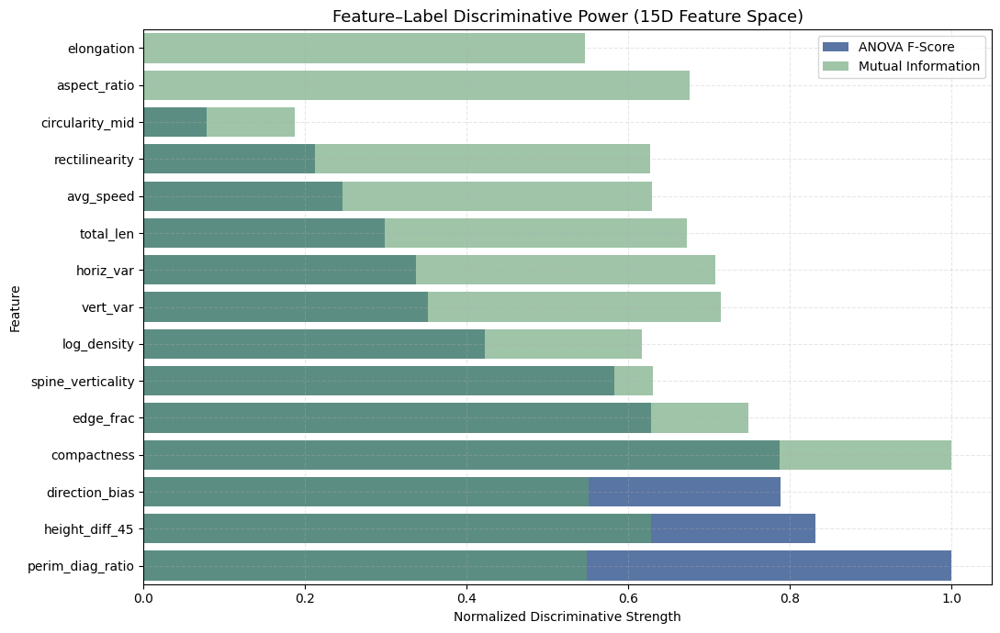

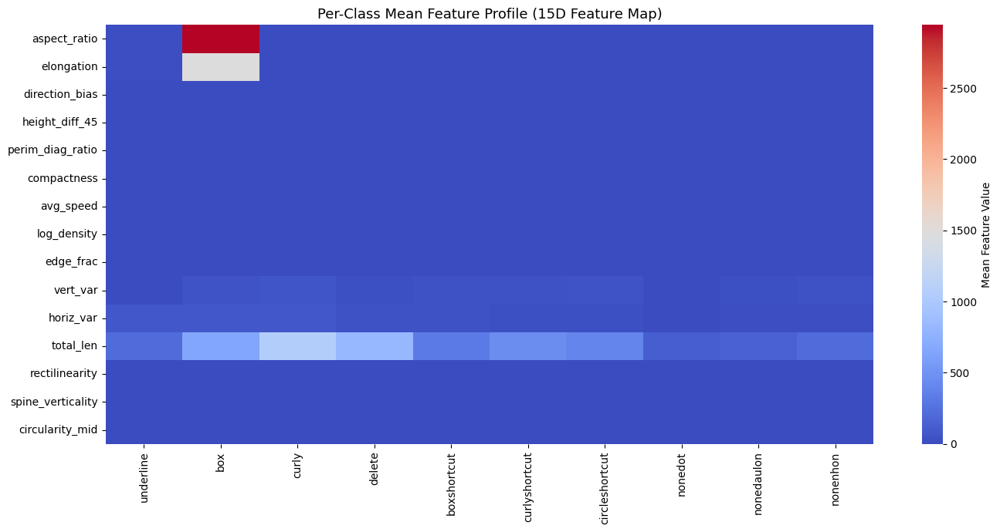


🌟 Top discriminative features (ANOVA):
perim_diag_ratio    1.000
height_diff_45      0.832
direction_bias      0.789
compactness         0.787
edge_frac           0.628
spine_verticality   0.583
log_density         0.422

🌟 Top nonlinear discriminative features (Mutual Info):
compactness         1.000
edge_frac           0.749
vert_var            0.715
horiz_var           0.708
aspect_ratio        0.676
total_len           0.673
spine_verticality   0.630


In [150]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder

def analyze_stroke_feature_discriminability(X_feats, y, class_names=None):
    """
    Analyze how 15 stroke features relate to actual label classes.
    - Computes ANOVA F-scores & mutual information
    - Visualizes feature-class discriminative power
    - Shows per-class mean profiles for interpretability
    """

    feature_names = [
        "aspect_ratio", "elongation", "direction_bias", "height_diff_45",
        "perim_diag_ratio", "compactness", "avg_speed", "log_density",
        "edge_frac", "vert_var", "horiz_var", "total_len",
        "rectilinearity", "spine_verticality", "circularity_mid"
    ]

    # Ensure input alignment
    if X_feats.shape[1] != len(feature_names):
        raise ValueError(f"❌ Expected {len(feature_names)} features, got {X_feats.shape[1]} instead.")

    df = pd.DataFrame(X_feats, columns=feature_names)
    df["label"] = y

    # Encode labels if not numeric
    if not np.issubdtype(df["label"].dtype, np.number):
        le = LabelEncoder()
        df["label"] = le.fit_transform(df["label"])
        if class_names is None:
            class_names = le.classes_

    # === 1️⃣ ANOVA F-scores (measures linear separability)
    F_vals, _ = f_classif(df[feature_names], df["label"])
    F_vals_norm = F_vals / (F_vals.max() + 1e-9)
    F_series = pd.Series(F_vals_norm, index=feature_names).sort_values(ascending=True)

    # === 2️⃣ Mutual Information (captures nonlinear relationships)
    MI_vals = mutual_info_classif(df[feature_names], df["label"], random_state=42)
    MI_series = pd.Series(MI_vals / (MI_vals.max() + 1e-9), index=feature_names).sort_values(ascending=True)

    # === 🎯 Plot: Feature Discriminative Power
    plt.figure(figsize=(11, 7))
    sns.barplot(y=F_series.index, x=F_series.values, color="#4C72B0", label="ANOVA F-Score")
    sns.barplot(y=MI_series.index, x=MI_series.values, color="#55A868", alpha=0.6, label="Mutual Information")
    plt.title("Feature–Label Discriminative Power (15D Feature Space)", fontsize=13)
    plt.xlabel("Normalized Discriminative Strength")
    plt.ylabel("Feature")
    plt.legend()
    plt.grid(alpha=0.3, linestyle="--")
    plt.tight_layout()
    plt.show()

    # === 3️⃣ Per-Class Mean Feature Profiles (Interpretability)
    if class_names is not None:
        plt.figure(figsize=(14, 7))
        class_means = df.groupby("label")[feature_names].mean().T
        class_means.columns = class_names
        sns.heatmap(
            class_means,
            cmap="coolwarm",
            annot=False,
            cbar_kws={"label": "Mean Feature Value"}
        )
        plt.title("Per-Class Mean Feature Profile (15D Feature Map)", fontsize=13)
        plt.tight_layout()
        plt.show()

    # === 🌟 Top discriminative features summary
    print("\n🌟 Top discriminative features (ANOVA):")
    print(F_series.sort_values(ascending=False).head(7).to_string(float_format="%.3f"))

    print("\n🌟 Top nonlinear discriminative features (Mutual Info):")
    print(MI_series.sort_values(ascending=False).head(7).to_string(float_format="%.3f"))

    return F_series, MI_series, class_means if class_names is not None else None


# === Example Usage ===
F_scores, MI_scores, class_means = analyze_stroke_feature_discriminability(
    X_feats, y,
    class_names=[
        "underline", "box", "curly", "delete", "boxshortcut",
        "curlyshortcut", "circleshortcut", "nonedot", "nonedaulon", "nonenhon"
    ]
)


In [126]:
def select_top_features(X_feats):
    """
    Select top 6 most discriminative engineered features based on ANOVA + MI analysis.
    Selected features:
        0. aspect_ratio
        1. elongation
        2. direction_bias
        3. height_diff_45
        4. perim_diag_ratio
        5. compactness
        6. avg_speed
        7. log_density
        8. edge_frac
        9. vert_var
        10. horiz_var
        11. total_len
    """
    # Based on analysis:
    selected_idx = [2, 3, 5, 8, 9, 11]  # direction_bias, height_diff_45, compactness, edge_frac, vert_var, total_len
    X_selected = X_feats[:, selected_idx]

    print(f"✅ Reduced to top {len(selected_idx)} features:", X_selected.shape)
    print("🧩 Selected features: ['direction_bias', 'height_diff_45', 'compactness', 'edge_frac', 'vert_var', 'total_len']")
    return X_selected




In [129]:
X_feats = select_top_features(X_feats)

✅ Reduced to top 6 features: (36088, 6)
🧩 Selected features: ['direction_bias', 'height_diff_45', 'compactness', 'edge_frac', 'vert_var', 'total_len']


# Build Models

## New model v1

In [131]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.layers import (
    Input, Dense, Dropout, BatchNormalization,
    GlobalAveragePooling2D, Concatenate, LayerNormalization
)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


def build_stable_mobilenetv3_hybrid(
    input_shape=(136, 136, 3),
    num_classes=10,
    feature_dim=5,
    lr=1e-4
):
    # === 🖼️ Image branch ===
    img_input = Input(shape=input_shape, name="img_input")
    base_model = MobileNetV3Small(
        include_top=False,
        input_tensor=img_input,
        weights="imagenet",
        minimalistic=False
    )
    base_model.trainable = False  # keep frozen for stable training

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.35)(x)  # same as old model

    # === 📈 Feature branch ===
    feat_input = Input(shape=(feature_dim,), name="feature_input")
    f = Dense(64, activation="relu")(feat_input)
    f = LayerNormalization()(f)
    f = Dropout(0.25)(f)  # same as old model

    # === 🔗 Fusion ===
    combined = Concatenate()([x, f])
    combined = Dense(256, activation="relu")(combined)
    combined = BatchNormalization()(combined)
    combined = Dropout(0.4)(combined)  # same as old model

    combined = Dense(128, activation="relu")(combined)
    combined = BatchNormalization()(combined)
    combined = Dropout(0.3)(combined)  # same as old model

    output = Dense(num_classes, activation="softmax", name="classifier")(combined)

    model = Model(inputs=[img_input, feat_input], outputs=output)

    model.compile(
        optimizer=Adam(learning_rate=lr),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    print("✅ Built stable MobileNetV3Small hybrid model (frozen backbone, balanced dropout)")
    return model


In [165]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.layers import (
    Input, Dense, Dropout, BatchNormalization,
    GlobalAveragePooling2D, Concatenate, LayerNormalization,
    Multiply, Reshape
)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam


def build_balanced_mobilenetv3_hybrid_v2(
    input_shape=(136, 136, 3),
    num_classes=10,
    feature_dim=10,
    lr=2e-4
):
    # === 🖼️ Image branch ===
    img_input = Input(shape=input_shape, name="img_input")

    base_model = MobileNetV3Small(
        include_top=False,
        input_tensor=img_input,
        weights="imagenet",
        minimalistic=False
    )
    # ❄️ Freeze the entire base model (no fine-tuning)
    base_model.trainable = False

    x = base_model.output

    # --- Lightweight Spatial Attention (Squeeze & Excitation) ---
    se = GlobalAveragePooling2D()(x)
    se = Dense(x.shape[-1] // 8, activation="relu")(se)
    se = Dense(x.shape[-1], activation="sigmoid")(se)
    se = Reshape((1, 1, x.shape[-1]))(se)
    x = Multiply()([x, se])  # adaptively reweight feature maps

    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dropout(0.25)(x)

    # === 📈 Feature branch ===
    feat_input = Input(shape=(feature_dim,), name="feature_input")
    f = Dense(128, activation="relu")(feat_input)
    f = LayerNormalization()(f)
    f = Dropout(0.25)(f)
    f = Dense(64, activation="relu")(f)
    f = LayerNormalization()(f)
    f = Dropout(0.2)(f)

    # === 🔗 Fusion ===
    combined = Concatenate()([x, f])
    combined = Dense(384, activation="relu")(combined)
    combined = BatchNormalization()(combined)
    combined = Dropout(0.35)(combined)

    combined = Dense(192, activation="relu")(combined)
    combined = BatchNormalization()(combined)
    combined = Dropout(0.25)(combined)

    output = Dense(num_classes, activation="softmax", name="classifier")(combined)

    # === 🧩 Compile ===
    model = Model(inputs=[img_input, feat_input], outputs=output)

    model.compile(
        optimizer=Adam(learning_rate=lr),
        loss="sparse_categorical_crossentropy",
        metrics=["accuracy"]
    )

    print("✅ Built Balanced MobileNetV3 Hybrid v2 (frozen backbone, 10D features)")
    print("   • Image: full freeze, SE attention")
    print("   • Feature branch: 2 dense layers (128→64)")
    print("   • Expected inference: ~60–80 ms desktop, ~100 ms laptop")
    return model


## Model training

# Run with model v1

In [137]:
from sklearn.model_selection import train_test_split
import tensorflow as tf
import os, datetime

# === Split ===
X_train_img, X_val_img, X_train_feat, X_val_feat, y_train, y_val = train_test_split(
    X_imgs, X_feats, y,
    test_size=0.18,
    stratify=y,
    random_state=42
)

# === Callbacks ===
run_id = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = f"logs/mobilenetv3_hybrid_{run_id}"
os.makedirs(logdir, exist_ok=True)

callbacks = [
    tf.keras.callbacks.TensorBoard(log_dir=logdir),
    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(logdir, "BestHybridModel.keras"),
        save_best_only=True,
        monitor="val_accuracy",
        verbose=1
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss", factor=0.5, patience=4, min_lr=1e-6, verbose=1
    ),
    tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy", patience=200, restore_best_weights=True, verbose=1
    ),
]

# === Build & Train ===
model = build_stable_mobilenetv3_hybrid(
    input_shape=(136,136,3),
    num_classes=10,
    feature_dim=6,
    lr=1e-4
)

history = model.fit(
    {"img_input": X_train_img, "feature_input": X_train_feat},
    y_train,
    validation_data=(
        {"img_input": X_val_img, "feature_input": X_val_feat},
        y_val
    ),
    epochs=600,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)


/opt/anaconda3/envs/machinelearning_env/lib/python3.10/site-packages/keras/src/applications/mobilenet_v3.py:452: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


✅ Built stable MobileNetV3Small hybrid model (frozen backbone, balanced dropout)
Epoch 1/600
924/925 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.4153 - loss: 1.8091
Epoch 1: val_accuracy improved from -inf to 0.82435, saving model to logs/mobilenetv3_hybrid_20251108-040844/BestHybridModel.keras
925/925 ━━━━━━━━━━━━━━━━━━━━ 58s 59ms/step - accuracy: 0.4156 - loss: 1.8080 - val_accuracy: 0.8244 - val_loss: 0.5057 - learning_rate: 1.0000e-04
Epoch 2/600
925/925 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.7331 - loss: 0.7672
Epoch 2: val_accuracy improved from 0.82435 to 0.88331, saving model to logs/mobilenetv3_hybrid_20251108-040844/BestHybridModel.keras
925/925 ━━━━━━━━━━━━━━━━━━━━ 46s 50ms/step - accuracy: 0.7331 - loss: 0.7671 - val_accuracy: 0.8833 - val_loss: 0.3477 - learning_rate: 1.0000e-04
Epoch 3/600
925/925 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.8070 - loss: 0.5587
Epoch 3: val_accuracy improved from 0.88331 to 0.91333, saving model to logs/mobilenetv3_hybrid_

KeyboardInterrupt: 

# Run with model v2

In [166]:
import os, datetime
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight


# ============================================================
# 🧩 1️⃣ Split Data: Train / Val / Test
# ============================================================

# First split Train+Val vs Test (keep test untouched until final evaluation)
X_trainval_img, X_test_img, X_trainval_feat, X_test_feat, y_trainval, y_test = train_test_split(
    X_imgs, X_feats, y,
    test_size=0.10,       # 10% reserved for test
    stratify=y,
    random_state=42
)

# Then split Train vs Val from remaining
X_train_img, X_val_img, X_train_feat, X_val_feat, y_train, y_val = train_test_split(
    X_trainval_img, X_trainval_feat, y_trainval,
    test_size=0.16,       # 18% of the remaining 90% ≈ 16% overall
    stratify=y_trainval,
    random_state=42
)

print(f"✅ Data split complete:")
print(f"   Train: {len(y_train)} samples")
print(f"   Val:   {len(y_val)} samples")
print(f"   Test:  {len(y_test)} samples")

# ============================================================
# ⚙️ 2️⃣ Callbacks & Logging Setup
# ============================================================

run_id = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
logdir = f"logs/mobilenetv3_hybrid_v2_{run_id}"
os.makedirs(logdir, exist_ok=True)

callbacks = [
    tf.keras.callbacks.TensorBoard(log_dir=logdir),

    tf.keras.callbacks.ModelCheckpoint(
        filepath=os.path.join(logdir, "BestHybridModelV2.keras"),
        monitor="val_accuracy",
        save_best_only=True,
        verbose=1
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1
    ),

    tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        patience=35,
        restore_best_weights=True,
        verbose=1
    ),
]

# ============================================================
# 🚀 3️⃣ Build Model
# ============================================================

# model = build_balanced_mobilenetv3_hybrid_v2(
#     input_shape=(136, 136, 3),
#     num_classes=10,
#     feature_dim=10,
#     lr=2e-4
# )

# model.summary()

# ============================================================
# ⚖️ 4️⃣ Compute Class Weights (optional but recommended)
# ============================================================

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weights = dict(enumerate(class_weights))
print("⚖️ Class Weights:", class_weights)

# ============================================================
# 🧮 5️⃣ Train Model
# ============================================================

history = model.fit(
    {"img_input": X_train_img, "feature_input": X_train_feat},
    y_train,
    validation_data=(
        {"img_input": X_val_img, "feature_input": X_val_feat},
        y_val
    ),
    epochs=200,
    batch_size=32,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1
)



✅ Data split complete:
   Train: 27282 samples
   Val:   5197 samples
   Test:  3609 samples


/opt/anaconda3/envs/machinelearning_env/lib/python3.10/site-packages/keras/src/applications/mobilenet_v3.py:452: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


✅ Built Balanced MobileNetV3 Hybrid v2 (frozen backbone, 10D features)
   • Image: full freeze, SE attention
   • Feature branch: 2 dense layers (128→64)
   • Expected inference: ~60–80 ms desktop, ~100 ms laptop


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ img_input           │ (None, 136, 136,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_4         │ (None, 136, 136,  │          0 │ img_input[0][0]   │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 68, 68,    │        432 │ rescaling_4[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_bn             │ (None, 68, 68,    │         64 │ conv[0][0]        │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_72       │ (None, 68, 68,    │          0 │ conv_bn[0][0]     │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 69, 69,    │          0 │ activation_72[0]… │
│ (ZeroPadding2D)     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 34, 34,    │        144 │ expanded_conv_de… │
│ (DepthwiseConv2D)   │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 34, 34,    │         64 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_56 (ReLU)     │ (None, 34, 34,    │          0 │ expanded_conv_de… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │          0 │ re_lu_56[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │        136 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 8)   │          0 │ expanded_conv_sq… │
│ (ReLU)              │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 1, 1, 16)  │        144 │ expanded_conv_sq… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_36 (Add)        │ (None, 1, 1, 16)  │          0 │ expanded_conv_sq… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ re_lu_57 (ReLU)     │ (None, 1, 1, 16)  │          0 │ add_36[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_37         │ (None, 1, 1, 16)  │          0 │ re_lu_57[0][0]    │
│ (Multiply)          │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_sque… │ (None, 34, 34,    │          0 │ re_lu_56[0][0],   │
│ (Multiply)          │ 16)               │            │ multiply_37[0][0] │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 1,359,362 (5.19 MB)

 Trainable params: 417,938 (1.59 MB)

 Non-trainable params: 941,424 (3.59 MB)

⚖️ Class Weights: {0: 0.8386719950814633, 1: 0.8165818617180485, 2: 1.5589714285714287, 3: 0.6854773869346734, 4: 1.3154291224686596, 5: 1.2228597041685343, 6: 1.2911500236630384, 7: 0.7930813953488373, 8: 1.0800475059382422, 9: 1.05990675990676}
Epoch 1/200
852/853 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.5764 - loss: 1.2760
Epoch 1: val_accuracy improved from -inf to 0.91091, saving model to logs/mobilenetv3_hybrid_v2_20251108-100256/BestHybridModelV2.keras
853/853 ━━━━━━━━━━━━━━━━━━━━ 44s 47ms/step - accuracy: 0.5767 - loss: 1.2750 - val_accuracy: 0.9109 - val_loss: 0.2947 - learning_rate: 2.0000e-04
Epoch 2/200
852/853 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.8526 - loss: 0.4560
Epoch 2: val_accuracy improved from 0.91091 to 0.93766, saving model to logs/mobilenetv3_hybrid_v2_20251108-100256/BestHybridModelV2.keras
853/853 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step - accuracy: 0.8526 - loss: 0.4559 - val_accuracy: 0.9377 - val_loss: 0.1913 - learning_rate: 2.0000e-04
Epoch 3/

## Evaluation


🔍 Evaluating model on TEST data...
113/113 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.9937 - loss: 0.0135

✅ Test Loss: 0.0111
✅ Test Accuracy: 0.9953

🧠 Generating predictions on test set...
113/113 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step

📊 Confusion Matrix (Test Set):
[[428   0   0   2   0   0   0   0   0   0]
 [  0 441   1   0   0   0   0   0   0   0]
 [  0   0 231   0   0   0   0   0   0   0]
 [  1   0   0 526   0   0   0   0   0   0]
 [  0   0   0   0 272   0   0   0   2   0]
 [  0   0   0   0   4 289   0   0   0   2]
 [  0   0   0   0   0   3 277   0   0   0]
 [  0   0   0   0   0   0   0 455   0   0]
 [  0   0   0   0   1   0   0   0 333   0]
 [  0   0   0   0   0   0   0   0   1 340]]


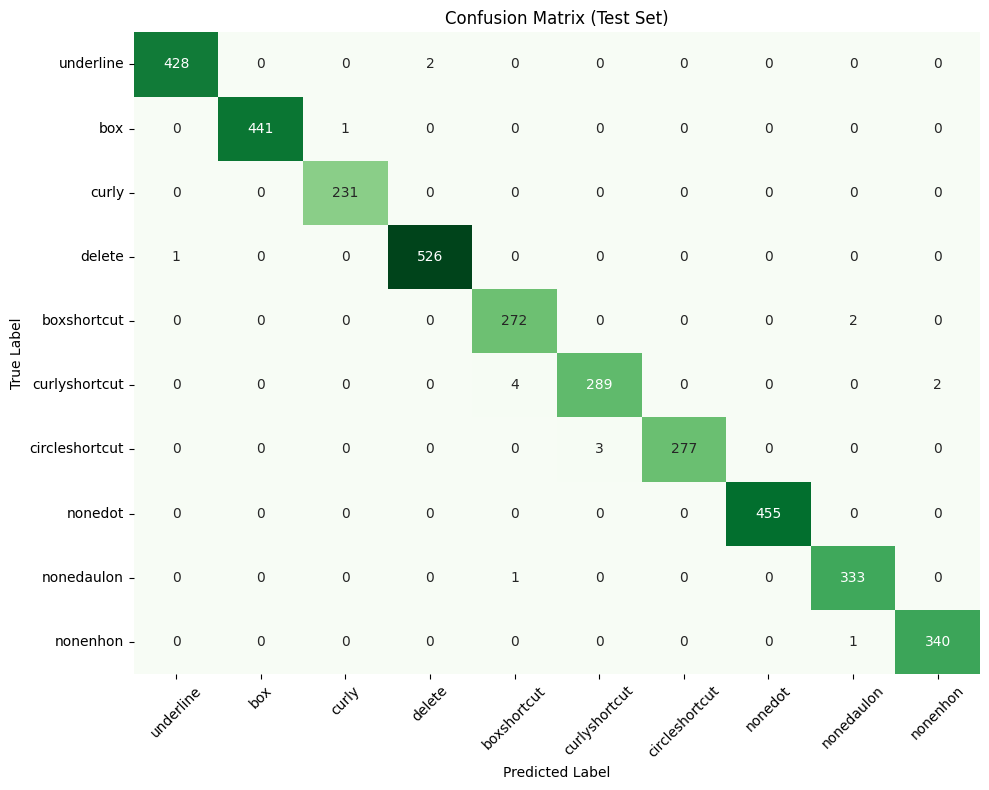


📈 Classification Report (Test Set):
                precision    recall  f1-score   support

     underline     0.9977    0.9953    0.9965       430
           box     1.0000    0.9977    0.9989       442
         curly     0.9957    1.0000    0.9978       231
        delete     0.9962    0.9981    0.9972       527
   boxshortcut     0.9819    0.9927    0.9873       274
 curlyshortcut     0.9897    0.9797    0.9847       295
circleshortcut     1.0000    0.9893    0.9946       280
       nonedot     1.0000    1.0000    1.0000       455
    nonedaulon     0.9911    0.9970    0.9940       334
      nonenhon     0.9942    0.9971    0.9956       341

      accuracy                         0.9953      3609
     macro avg     0.9946    0.9947    0.9947      3609
  weighted avg     0.9953    0.9953    0.9953      3609


🎯 Per-Class Accuracy (Test Set):
underline: 99.53% accuracy
box: 99.77% accuracy
curly: 100.00% accuracy
delete: 99.81% accuracy
boxshortcut: 99.27% accuracy
curlyshortcut: 97

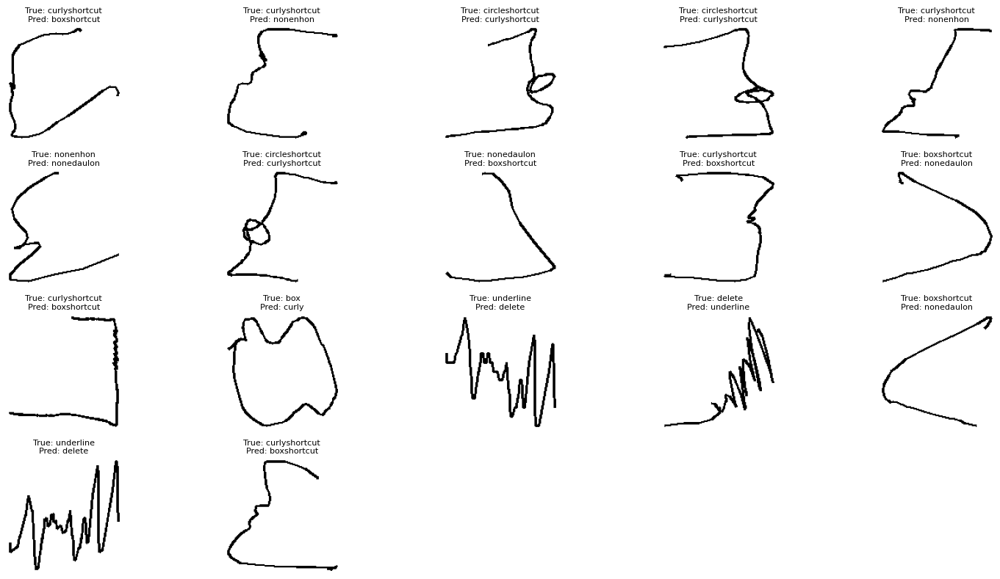

In [167]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# ============================================================
# ⚙️ Load Best Model (V2)
# ============================================================

# best_model_path = os.path.join(logdir, "BestHybridModelV2.keras")
# print(f"🔹 Loading best model from: {best_model_path}")

# model = load_model(best_model_path)

# ============================================================
# 🧪 Evaluate on Test Data
# ============================================================

print("\n🔍 Evaluating model on TEST data...")
test_loss, test_accuracy = model.evaluate(
    {"img_input": X_test_img, "feature_input": X_test_feat},
    y_test,
    verbose=1
)

print(f"\n✅ Test Loss: {test_loss:.4f}")
print(f"✅ Test Accuracy: {test_accuracy:.4f}")

# ============================================================
# 🧠 Generate Predictions
# ============================================================

print("\n🧠 Generating predictions on test set...")
y_pred = model.predict({"img_input": X_test_img, "feature_input": X_test_feat})

# --- Convert labels correctly ---
if y_test.ndim == 1:  # integer labels
    y_true = y_test
else:  # one-hot encoded
    y_true = np.argmax(y_test, axis=1)

y_pred_classes = np.argmax(y_pred, axis=1)

# ============================================================
# 🏷️ Class Labels
# ============================================================

class_names = [
    'underline', 'box', 'curly', 'delete',
    'boxshortcut', 'curlyshortcut', 'circleshortcut',
    'nonedot', 'nonedaulon', 'nonenhon'
]

# ============================================================
# 📊 Confusion Matrix
# ============================================================

print("\n📊 Confusion Matrix (Test Set):")
cm = confusion_matrix(y_true, y_pred_classes)
print(cm)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=class_names,
    yticklabels=class_names,
    cbar=False
)
plt.title("Confusion Matrix (Test Set)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# ============================================================
# 📈 Classification Report
# ============================================================

print("\n📈 Classification Report (Test Set):")
print(classification_report(y_true, y_pred_classes, target_names=class_names, digits=4))

# ============================================================
# 🎯 Per-Class Accuracy
# ============================================================

print("\n🎯 Per-Class Accuracy (Test Set):")
class_accuracy = cm.diagonal() / cm.sum(axis=1)
for name, acc in zip(class_names, class_accuracy):
    print(f"{name}: {acc*100:.2f}% accuracy")

# ============================================================
# 🚨 Visualize False Predictions
# ============================================================

print("\n🚨 Displaying False Predictions from Test Set...")
false_indices = np.where(y_pred_classes != y_true)[0]
print(f"Total False Predictions: {len(false_indices)}")

num_to_show = min(20, len(false_indices))
plt.figure(figsize=(15, 8))

for i, idx in enumerate(false_indices[:num_to_show]):
    plt.subplot(4, 5, i + 1)
    plt.imshow(X_test_img[idx])
    plt.title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred_classes[idx]]}", fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()


🔹 Loading best model from: logs/mobilenetv3_hybrid_20251108-040844/BestHybridModel.keras

🔍 Evaluating model on validation data...
203/203 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - accuracy: 0.9928 - loss: 0.0215

✅ Validation Loss: 0.0216
✅ Validation Accuracy: 0.9926

🧠 Generating predictions...
203/203 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step

📊 Confusion Matrix:
[[773   0   0   2   0   0   0   0   0   0]
 [  0 790   1   0   5   0   0   0   0   0]
 [  0   2 414   0   0   0   0   0   0   0]
 [  1   0   0 947   0   0   0   0   0   0]
 [  2   1   0   0 487   0   0   0   4   0]
 [  0   1   0   0   6 518   4   0   0   2]
 [  0   0   0   0   0   6 495   0   0   2]
 [  0   0   0   0   0   0   0 819   0   0]
 [  0   0   0   0   3   0   0   0 598   0]
 [  0   0   0   0   2   0   2   0   2 607]]


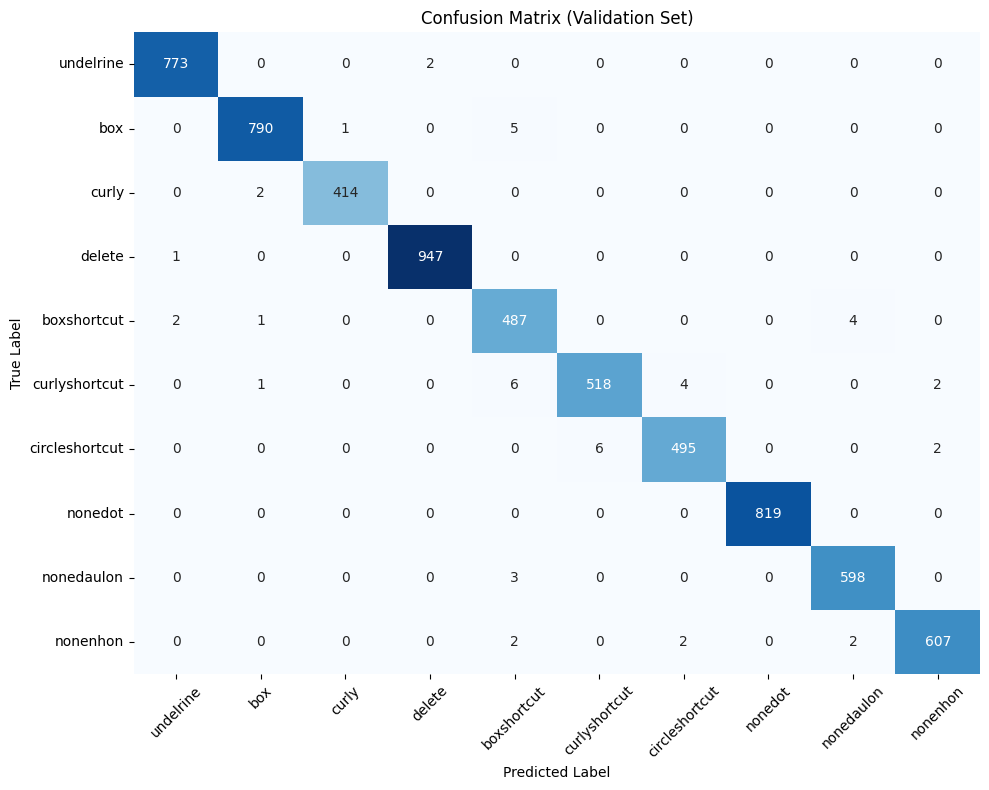


📈 Classification Report:
                precision    recall  f1-score   support

     undelrine     0.9961    0.9974    0.9968       775
           box     0.9950    0.9925    0.9937       796
         curly     0.9976    0.9952    0.9964       416
        delete     0.9979    0.9989    0.9984       948
   boxshortcut     0.9682    0.9858    0.9769       494
 curlyshortcut     0.9885    0.9755    0.9820       531
circleshortcut     0.9880    0.9841    0.9861       503
       nonedot     1.0000    1.0000    1.0000       819
    nonedaulon     0.9901    0.9950    0.9925       601
      nonenhon     0.9935    0.9902    0.9918       613

      accuracy                         0.9926      6496
     macro avg     0.9915    0.9915    0.9915      6496
  weighted avg     0.9926    0.9926    0.9926      6496


🎯 Per-Class Accuracy:
undelrine: 99.74% accuracy
box: 99.25% accuracy
curly: 99.52% accuracy
delete: 99.89% accuracy
boxshortcut: 98.58% accuracy
curlyshortcut: 97.55% accuracy
circlesho

/var/folders/3t/pzp15jbx0_739jd83sg_8scr0000gn/T/ipykernel_98250/124177149.py:96: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/opt/anaconda3/envs/machinelearning_env/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


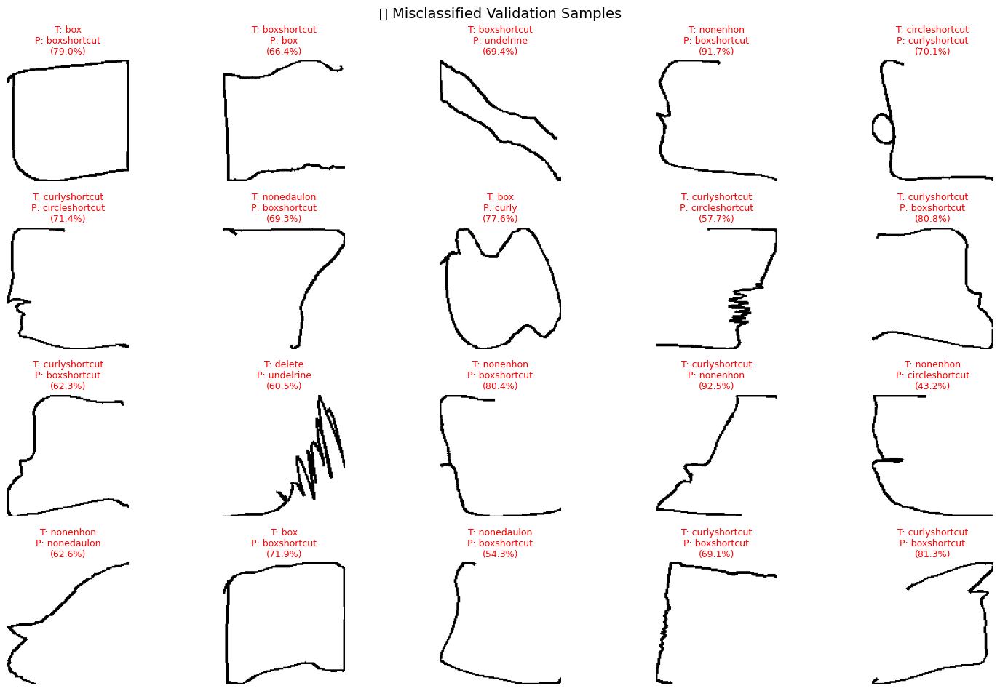


🧾 Misclassified Samples (True → Predicted):
[01] True: box        | Pred: boxshortcut | Conf: 79.04%
[02] True: boxshortcut | Pred: box        | Conf: 66.35%
[03] True: boxshortcut | Pred: undelrine  | Conf: 69.41%
[04] True: nonenhon   | Pred: boxshortcut | Conf: 91.72%
[05] True: circleshortcut | Pred: curlyshortcut | Conf: 70.14%
[06] True: curlyshortcut | Pred: circleshortcut | Conf: 71.35%
[07] True: nonedaulon | Pred: boxshortcut | Conf: 69.26%
[08] True: box        | Pred: curly      | Conf: 77.58%
[09] True: curlyshortcut | Pred: circleshortcut | Conf: 57.74%
[10] True: curlyshortcut | Pred: boxshortcut | Conf: 80.77%
[11] True: curlyshortcut | Pred: boxshortcut | Conf: 62.33%
[12] True: delete     | Pred: undelrine  | Conf: 60.48%
[13] True: nonenhon   | Pred: boxshortcut | Conf: 80.39%
[14] True: curlyshortcut | Pred: nonenhon   | Conf: 92.54%
[15] True: nonenhon   | Pred: circleshortcut | Conf: 43.24%
[16] True: nonenhon   | Pred: nonedaulon | Conf: 62.56%
[17] True: box   

In [145]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# === Load Best Model ===
best_model_path = os.path.join(logdir, "BestHybridModel.keras")
print(f"🔹 Loading best model from: {best_model_path}")
model = load_model(best_model_path)

# === Evaluate ===
print("\n🔍 Evaluating model on validation data...")
val_loss, val_accuracy = model.evaluate(
    {"img_input": X_val_img, "feature_input": X_val_feat},
    y_val,
    verbose=1
)

print(f"\n✅ Validation Loss: {val_loss:.4f}")
print(f"✅ Validation Accuracy: {val_accuracy:.4f}")

# === Predictions ===
print("\n🧠 Generating predictions...")
y_pred = model.predict({"img_input": X_val_img, "feature_input": X_val_feat})

# Handle one-hot or integer labels
if y_val.ndim == 1:
    y_true = y_val
else:
    y_true = np.argmax(y_val, axis=1)

y_pred_classes = np.argmax(y_pred, axis=1)

# === Define your class labels ===
class_names = ['undelrine', 'box', 'curly', 'delete', 'boxshortcut', 'curlyshortcut', 'circleshortcut', 'nonedot', 'nonedaulon', 'nonenhon']

# Example custom labels:
# class_names = ["cat", "dog", "car", "plane", "truck", "ship", "bird", "horse", "frog", "deer"]

# === Confusion Matrix ===
print("\n📊 Confusion Matrix:")
cm = confusion_matrix(y_true, y_pred_classes)
print(cm)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names,
    cbar=False
)
plt.title("Confusion Matrix (Validation Set)")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# === Classification Report ===
print("\n📈 Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_names, digits=4))

# === Per-Class Accuracy ===
print("\n🎯 Per-Class Accuracy:")
class_accuracy = cm.diagonal() / cm.sum(axis=1)
for name, acc in zip(class_names, class_accuracy):
    print(f"{name}: {acc*100:.2f}% accuracy")

# === Find Misclassified Samples ===
mis_idx = np.where(y_true != y_pred_classes)[0]
print(f"\n❌ Found {len(mis_idx)} misclassified samples out of {len(y_true)}.")

# === Display Misclassified Samples ===
num_show = min(20, len(mis_idx))  # show up to 20 samples
plt.figure(figsize=(15, num_show // 5 * 3))

for i, idx in enumerate(mis_idx[:num_show]):
    plt.subplot(num_show // 5 + 1, 5, i + 1)
    plt.imshow(np.clip(X_val_img[idx], 0, 1))  # assumes normalized 0-1
    plt.axis("off")

    true_label = class_names[y_true[idx]]
    pred_label = class_names[y_pred_classes[idx]]
    confidence = np.max(y_pred[idx]) * 100

    plt.title(f"T: {true_label}\nP: {pred_label}\n({confidence:.1f}%)", fontsize=9, color="red")

plt.suptitle("❌ Misclassified Validation Samples", fontsize=14)
plt.tight_layout()
plt.show()

# === Print Misclassified Labels in Text ===
print("\n🧾 Misclassified Samples (True → Predicted):")
for i, idx in enumerate(mis_idx[:num_show]):
    true_label = class_names[y_true[idx]]
    pred_label = class_names[y_pred_classes[idx]]
    confidence = np.max(y_pred[idx]) * 100
    print(f"[{i+1:02d}] True: {true_label:<10} | Pred: {pred_label:<10} | Conf: {confidence:.2f}%")


# Export model

In [169]:
model.export('MobileNetV3_HybridModelV2/')

INFO:tensorflow:Assets written to: MobileNetV3_HybridModelV2/assets


INFO:tensorflow:Assets written to: MobileNetV3_HybridModelV2/assets


Saved artifact at 'MobileNetV3_HybridModelV2/'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): List[TensorSpec(shape=(None, 136, 136, 3), dtype=tf.float32, name='img_input'), TensorSpec(shape=(None, 10), dtype=tf.float32, name='feature_input')]
Output Type:
  TensorSpec(shape=(None, 10), dtype=tf.float32, name=None)
Captures:
  17364069792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  17989857552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  17962851792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  17392720304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  17989857728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  17413317456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16043703664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16043689936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16043688352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  16043704016: TensorSpec(shape=(), dt

In [ ]:
#tensorflowjs_converter --input_format=tf_saved_model MobileNetV3_HybridModelV2/ MobileNetV3_HybridModelV2_exp/